In [74]:
from sys import path as syspath
from os import path as ospath
syspath.append(ospath.join(ospath.expanduser("~"), '/data/hashemi/Freetime/Freetime-DQN/Deep-Freetime/SB3_f'))

In [75]:
import torch as torch
torch._C._cuda_getDeviceCount() > 0

True

In [76]:
import os
import gym 
import matplotlib.pyplot as plt
import numpy as np 
from SB3_f.sb3f import DQN
from SB3_f.sb3f.common.vec_env import DummyVecEnv
from SB3_f.sb3f.common.evaluation import evaluate_policy
from SB3_f.sb3f.common.callbacks import EvalCallback, StopTrainingOnRewardThreshold


In [77]:
rewards = [[2,0,10],[1,0,0]]
from GridEnv import WindyGridworld
env = WindyGridworld(
        height=20,
        width=11,
        rewards=rewards,
        wind=True,
        allowed_actions=['L', 'R', 'C'],
        reward_terminates_episode=False
    )

In [78]:
episodes = 5
for episode in range(1, episodes+1):
    state = env.reset()
    done = False
    score = 0 
    
    while not done:
        env.render()
        action = env.action_space.sample()
        n_state, reward, done, info = env.step(action)
        score+=reward
    print('Episode:{} Score:{}'.format(episode, score))
env.close()

QObject::moveToThread: Current thread (0x5585d7fb2f50) is not the object's thread (0x5585d7f35ea0).
Cannot move to target thread (0x5585d7fb2f50)

QObject::moveToThread: Current thread (0x5585d7fb2f50) is not the object's thread (0x5585d7f35ea0).
Cannot move to target thread (0x5585d7fb2f50)

QObject::moveToThread: Current thread (0x5585d7fb2f50) is not the object's thread (0x5585d7f35ea0).
Cannot move to target thread (0x5585d7fb2f50)

QObject::moveToThread: Current thread (0x5585d7fb2f50) is not the object's thread (0x5585d7f35ea0).
Cannot move to target thread (0x5585d7fb2f50)

QObject::moveToThread: Current thread (0x5585d7fb2f50) is not the object's thread (0x5585d7f35ea0).
Cannot move to target thread (0x5585d7fb2f50)

QObject::moveToThread: Current thread (0x5585d7fb2f50) is not the object's thread (0x5585d7f35ea0).
Cannot move to target thread (0x5585d7fb2f50)

QObject::moveToThread: Current thread (0x5585d7fb2f50) is not the object's thread (0x5585d7f35ea0).
Cannot move to tar

Episode:1 Score:1
Episode:2 Score:0
Episode:3 Score:0
Episode:4 Score:0
Episode:5 Score:0


In [79]:
save_path = os.path.join('Training', 'Saved Models')
log_path = os.path.join('Training', 'Logs_F_Only', 'Env3')

In [80]:
stop_callback = StopTrainingOnRewardThreshold(reward_threshold=3, verbose=1)
eval_callback = EvalCallback(env, 
                             callback_on_new_best=stop_callback, 
                             eval_freq=10000, 
                             best_model_save_path=save_path, 
                             verbose=1)

In [81]:
# Using same prams that performed optimally in Baseline
opt_val = None
model = DQN('CnnPolicy', env, opt_val=opt_val, exploration_fraction=0.8,
    exploration_final_eps=0.1,learning_starts=200000,
    verbose = 1, 
    buffer_size = 50000,
    target_update_interval=1000,
    tensorboard_log=log_path)

Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env in a VecTransposeImage.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


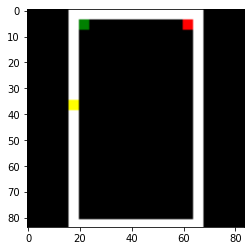

In [82]:
from SB3_f.sb3f.common.utils import obs_as_tensor
device = torch.device('cuda:0')

obs = env.canvas
plt.imshow(obs)


# Check the Network Q Value
observation = np.transpose(obs, (2, 0, 1))
observation = observation[np.newaxis, ...]
observation = obs_as_tensor(observation, device)
with torch.no_grad():
        q_values = model.f_net(observation)

In [83]:
q_values


tensor([[1.1109, 1.1042, 1.1067]], device='cuda:0')

In [84]:
model.learn(total_timesteps=1000000,callback=eval_callback, tb_log_name='Env3_1m_0.8exp')

Logging to Training/Logs_F_Only/Env3/Env3_1m_0.8exp_11
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 20       |
|    ep_rew_mean      | 0        |
|    exploration_rate | 1        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 2526     |
|    time_elapsed     | 0        |
|    total_timesteps  | 80       |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 1        |
| time/               |          |
|    episodes         | 8        |
|    fps              | 2593     |
|    time_elapsed     | 0        |
|    total_timesteps  | 142      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 1        |


/data/hashemi/Freetime/Freetime-DQN/Deep-Freetime/SB3_f/sb3f/common/callbacks.py:388: UserWarning: Training and eval env are not of the same type<sb3f.common.vec_env.vec_transpose.VecTransposeImage object at 0x7fd110e3cbb0> != <sb3f.common.vec_env.dummy_vec_env.DummyVecEnv object at 0x7fd11023a730>
  warnings.warn("Training and eval env are not of the same type" f"{self.training_env} != {self.eval_env}")


----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.0714   |
|    exploration_rate | 1        |
| time/               |          |
|    episodes         | 28       |
|    fps              | 2808     |
|    time_elapsed     | 0        |
|    total_timesteps  | 423      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.0625   |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes         | 32       |
|    fps              | 2863     |
|    time_elapsed     | 0        |
|    total_timesteps  | 492      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.0556   |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes         | 116      |
|    fps              | 3110     |
|    time_elapsed     | 0        |
|    total_timesteps  | 1643     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes         | 120      |
|    fps              | 3123     |
|    time_elapsed     | 0        |
|    total_timesteps  | 1723     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.997    |
| time/               |          |
|    episodes         | 204      |
|    fps              | 3177     |
|    time_elapsed     | 0        |
|    total_timesteps  | 2870     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.997    |
| time/               |          |
|    episodes         | 208      |
|    fps              | 3181     |
|    time_elapsed     | 0        |
|    total_timesteps  | 2941     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.997    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.995    |
| time/               |          |
|    episodes         | 292      |
|    fps              | 3205     |
|    time_elapsed     | 1        |
|    total_timesteps  | 4219     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.995    |
| time/               |          |
|    episodes         | 296      |
|    fps              | 3206     |
|    time_elapsed     | 1        |
|    total_timesteps  | 4282     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.995    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.994    |
| time/               |          |
|    episodes         | 380      |
|    fps              | 3227     |
|    time_elapsed     | 1        |
|    total_timesteps  | 5527     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.994    |
| time/               |          |
|    episodes         | 384      |
|    fps              | 3227     |
|    time_elapsed     | 1        |
|    total_timesteps  | 5583     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.994    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.992    |
| time/               |          |
|    episodes         | 468      |
|    fps              | 3234     |
|    time_elapsed     | 2        |
|    total_timesteps  | 6719     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.992    |
| time/               |          |
|    episodes         | 472      |
|    fps              | 3234     |
|    time_elapsed     | 2        |
|    total_timesteps  | 6763     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.992    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.991    |
| time/               |          |
|    episodes         | 556      |
|    fps              | 3237     |
|    time_elapsed     | 2        |
|    total_timesteps  | 7882     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.991    |
| time/               |          |
|    episodes         | 560      |
|    fps              | 3237     |
|    time_elapsed     | 2        |
|    total_timesteps  | 7919     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.991    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.99     |
| time/               |          |
|    episodes         | 644      |
|    fps              | 3240     |
|    time_elapsed     | 2        |
|    total_timesteps  | 9090     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.99     |
| time/               |          |
|    episodes         | 648      |
|    fps              | 3240     |
|    time_elapsed     | 2        |
|    total_timesteps  | 9136     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.99     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.988    |
| time/               |          |
|    episodes         | 728      |
|    fps              | 3047     |
|    time_elapsed     | 3        |
|    total_timesteps  | 10240    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.988    |
| time/               |          |
|    episodes         | 732      |
|    fps              | 3049     |
|    time_elapsed     | 3        |
|    total_timesteps  | 10305    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.988    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.987    |
| time/               |          |
|    episodes         | 816      |
|    fps              | 3066     |
|    time_elapsed     | 3        |
|    total_timesteps  | 11520    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.987    |
| time/               |          |
|    episodes         | 820      |
|    fps              | 3067     |
|    time_elapsed     | 3        |
|    total_timesteps  | 11600    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.987    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.986    |
| time/               |          |
|    episodes         | 904      |
|    fps              | 3083     |
|    time_elapsed     | 4        |
|    total_timesteps  | 12880    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.985    |
| time/               |          |
|    episodes         | 908      |
|    fps              | 3083     |
|    time_elapsed     | 4        |
|    total_timesteps  | 12916    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.985    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 0.984    |
| time/               |          |
|    episodes         | 992      |
|    fps              | 3094     |
|    time_elapsed     | 4        |
|    total_timesteps  | 14173    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.984    |
| time/               |          |
|    episodes         | 996      |
|    fps              | 3094     |
|    time_elapsed     | 4        |
|    total_timesteps  | 14232    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.984    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.983    |
| time/               |          |
|    episodes         | 1080     |
|    fps              | 3111     |
|    time_elapsed     | 4        |
|    total_timesteps  | 15554    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.982    |
| time/               |          |
|    episodes         | 1084     |
|    fps              | 3112     |
|    time_elapsed     | 5        |
|    total_timesteps  | 15617    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.982    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.981    |
| time/               |          |
|    episodes         | 1168     |
|    fps              | 3129     |
|    time_elapsed     | 5        |
|    total_timesteps  | 17051    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.981    |
| time/               |          |
|    episodes         | 1172     |
|    fps              | 3129     |
|    time_elapsed     | 5        |
|    total_timesteps  | 17090    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.981    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.979    |
| time/               |          |
|    episodes         | 1256     |
|    fps              | 3140     |
|    time_elapsed     | 5        |
|    total_timesteps  | 18335    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.979    |
| time/               |          |
|    episodes         | 1260     |
|    fps              | 3140     |
|    time_elapsed     | 5        |
|    total_timesteps  | 18396    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.979    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.978    |
| time/               |          |
|    episodes         | 1344     |
|    fps              | 3150     |
|    time_elapsed     | 6        |
|    total_timesteps  | 19644    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.978    |
| time/               |          |
|    episodes         | 1348     |
|    fps              | 3150     |
|    time_elapsed     | 6        |
|    total_timesteps  | 19707    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.978    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.976    |
| time/               |          |
|    episodes         | 1428     |
|    fps              | 3114     |
|    time_elapsed     | 6        |
|    total_timesteps  | 20952    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.976    |
| time/               |          |
|    episodes         | 1432     |
|    fps              | 3114     |
|    time_elapsed     | 6        |
|    total_timesteps  | 21021    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.976    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.975    |
| time/               |          |
|    episodes         | 1516     |
|    fps              | 3123     |
|    time_elapsed     | 7        |
|    total_timesteps  | 22322    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.975    |
| time/               |          |
|    episodes         | 1520     |
|    fps              | 3123     |
|    time_elapsed     | 7        |
|    total_timesteps  | 22364    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.975    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.973    |
| time/               |          |
|    episodes         | 1604     |
|    fps              | 3131     |
|    time_elapsed     | 7        |
|    total_timesteps  | 23638    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.973    |
| time/               |          |
|    episodes         | 1608     |
|    fps              | 3132     |
|    time_elapsed     | 7        |
|    total_timesteps  | 23701    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.973    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.972    |
| time/               |          |
|    episodes         | 1692     |
|    fps              | 3138     |
|    time_elapsed     | 7        |
|    total_timesteps  | 24889    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.972    |
| time/               |          |
|    episodes         | 1696     |
|    fps              | 3138     |
|    time_elapsed     | 7        |
|    total_timesteps  | 24929    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.972    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.971    |
| time/               |          |
|    episodes         | 1780     |
|    fps              | 3144     |
|    time_elapsed     | 8        |
|    total_timesteps  | 26195    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.971    |
| time/               |          |
|    episodes         | 1784     |
|    fps              | 3144     |
|    time_elapsed     | 8        |
|    total_timesteps  | 26213    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.97     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.969    |
| time/               |          |
|    episodes         | 1868     |
|    fps              | 3151     |
|    time_elapsed     | 8        |
|    total_timesteps  | 27519    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.969    |
| time/               |          |
|    episodes         | 1872     |
|    fps              | 3151     |
|    time_elapsed     | 8        |
|    total_timesteps  | 27552    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.969    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.968    |
| time/               |          |
|    episodes         | 1956     |
|    fps              | 3156     |
|    time_elapsed     | 9        |
|    total_timesteps  | 28814    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.967    |
| time/               |          |
|    episodes         | 1960     |
|    fps              | 3157     |
|    time_elapsed     | 9        |
|    total_timesteps  | 28889    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.967    |
| time/               |          |
|    episodes       

Eval num_timesteps=30000, episode_reward=0.00 +/- 0.00
Episode length: 15.80 +/- 7.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 15.8     |
|    mean_reward      | 0        |
| rollout/            |          |
|    exploration_rate | 0.966    |
| time/               |          |
|    total_timesteps  | 30000    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.966    |
| time/               |          |
|    episodes         | 2044     |
|    fps              | 3130     |
|    time_elapsed     | 9        |
|    total_timesteps  | 30041    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.966    |
| time/               |          |
|   

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.965    |
| time/               |          |
|    episodes         | 2128     |
|    fps              | 3135     |
|    time_elapsed     | 9        |
|    total_timesteps  | 31268    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.965    |
| time/               |          |
|    episodes         | 2132     |
|    fps              | 3136     |
|    time_elapsed     | 9        |
|    total_timesteps  | 31332    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.965    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.963    |
| time/               |          |
|    episodes         | 2216     |
|    fps              | 3140     |
|    time_elapsed     | 10       |
|    total_timesteps  | 32515    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.963    |
| time/               |          |
|    episodes         | 2220     |
|    fps              | 3140     |
|    time_elapsed     | 10       |
|    total_timesteps  | 32569    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.963    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.962    |
| time/               |          |
|    episodes         | 2304     |
|    fps              | 3143     |
|    time_elapsed     | 10       |
|    total_timesteps  | 33700    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.962    |
| time/               |          |
|    episodes         | 2308     |
|    fps              | 3143     |
|    time_elapsed     | 10       |
|    total_timesteps  | 33733    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.962    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.961    |
| time/               |          |
|    episodes         | 2392     |
|    fps              | 3147     |
|    time_elapsed     | 11       |
|    total_timesteps  | 34918    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.961    |
| time/               |          |
|    episodes         | 2396     |
|    fps              | 3147     |
|    time_elapsed     | 11       |
|    total_timesteps  | 34948    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.961    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.959    |
| time/               |          |
|    episodes         | 2480     |
|    fps              | 3150     |
|    time_elapsed     | 11       |
|    total_timesteps  | 36147    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.959    |
| time/               |          |
|    episodes         | 2484     |
|    fps              | 3151     |
|    time_elapsed     | 11       |
|    total_timesteps  | 36205    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.959    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.958    |
| time/               |          |
|    episodes         | 2568     |
|    fps              | 3155     |
|    time_elapsed     | 11       |
|    total_timesteps  | 37449    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.958    |
| time/               |          |
|    episodes         | 2572     |
|    fps              | 3155     |
|    time_elapsed     | 11       |
|    total_timesteps  | 37506    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.958    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.957    |
| time/               |          |
|    episodes         | 2656     |
|    fps              | 3157     |
|    time_elapsed     | 12       |
|    total_timesteps  | 38605    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.956    |
| time/               |          |
|    episodes         | 2660     |
|    fps              | 3158     |
|    time_elapsed     | 12       |
|    total_timesteps  | 38677    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.956    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.955    |
| time/               |          |
|    episodes         | 2744     |
|    fps              | 3162     |
|    time_elapsed     | 12       |
|    total_timesteps  | 39966    |
----------------------------------
Eval num_timesteps=40000, episode_reward=0.20 +/- 0.40
Episode length: 15.00 +/- 6.32
----------------------------------
| eval/               |          |
|    mean_ep_length   | 15       |
|    mean_reward      | 0.2      |
| rollout/            |          |
|    exploration_rate | 0.955    |
| time/               |          |
|    total_timesteps  | 40000    |
----------------------------------
New best mean reward!
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.955    |
| time/          

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.954    |
| time/               |          |
|    episodes         | 2828     |
|    fps              | 3118     |
|    time_elapsed     | 13       |
|    total_timesteps  | 41095    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.954    |
| time/               |          |
|    episodes         | 2832     |
|    fps              | 3118     |
|    time_elapsed     | 13       |
|    total_timesteps  | 41152    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.954    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.952    |
| time/               |          |
|    episodes         | 2916     |
|    fps              | 3123     |
|    time_elapsed     | 13       |
|    total_timesteps  | 42472    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.952    |
| time/               |          |
|    episodes         | 2920     |
|    fps              | 3124     |
|    time_elapsed     | 13       |
|    total_timesteps  | 42552    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.952    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.951    |
| time/               |          |
|    episodes         | 3004     |
|    fps              | 3128     |
|    time_elapsed     | 14       |
|    total_timesteps  | 43848    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.951    |
| time/               |          |
|    episodes         | 3008     |
|    fps              | 3129     |
|    time_elapsed     | 14       |
|    total_timesteps  | 43918    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.951    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.949    |
| time/               |          |
|    episodes         | 3092     |
|    fps              | 3133     |
|    time_elapsed     | 14       |
|    total_timesteps  | 45103    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.949    |
| time/               |          |
|    episodes         | 3096     |
|    fps              | 3133     |
|    time_elapsed     | 14       |
|    total_timesteps  | 45179    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.949    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.948    |
| time/               |          |
|    episodes         | 3180     |
|    fps              | 3138     |
|    time_elapsed     | 14       |
|    total_timesteps  | 46458    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.948    |
| time/               |          |
|    episodes         | 3184     |
|    fps              | 3138     |
|    time_elapsed     | 14       |
|    total_timesteps  | 46520    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.948    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.946    |
| time/               |          |
|    episodes         | 3268     |
|    fps              | 3142     |
|    time_elapsed     | 15       |
|    total_timesteps  | 47723    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.946    |
| time/               |          |
|    episodes         | 3272     |
|    fps              | 3142     |
|    time_elapsed     | 15       |
|    total_timesteps  | 47801    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.946    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.945    |
| time/               |          |
|    episodes         | 3356     |
|    fps              | 3147     |
|    time_elapsed     | 15       |
|    total_timesteps  | 49109    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.945    |
| time/               |          |
|    episodes         | 3360     |
|    fps              | 3147     |
|    time_elapsed     | 15       |
|    total_timesteps  | 49163    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.945    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.943    |
| time/               |          |
|    episodes         | 3440     |
|    fps              | 3141     |
|    time_elapsed     | 16       |
|    total_timesteps  | 50391    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.943    |
| time/               |          |
|    episodes         | 3444     |
|    fps              | 3141     |
|    time_elapsed     | 16       |
|    total_timesteps  | 50458    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.943    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.942    |
| time/               |          |
|    episodes         | 3528     |
|    fps              | 3148     |
|    time_elapsed     | 16       |
|    total_timesteps  | 51716    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.942    |
| time/               |          |
|    episodes         | 3532     |
|    fps              | 3148     |
|    time_elapsed     | 16       |
|    total_timesteps  | 51796    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.942    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.94     |
| time/               |          |
|    episodes         | 3616     |
|    fps              | 3154     |
|    time_elapsed     | 16       |
|    total_timesteps  | 53034    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.94     |
| time/               |          |
|    episodes         | 3620     |
|    fps              | 3154     |
|    time_elapsed     | 16       |
|    total_timesteps  | 53094    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.94     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.939    |
| time/               |          |
|    episodes         | 3704     |
|    fps              | 3158     |
|    time_elapsed     | 17       |
|    total_timesteps  | 54274    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.939    |
| time/               |          |
|    episodes         | 3708     |
|    fps              | 3158     |
|    time_elapsed     | 17       |
|    total_timesteps  | 54343    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.939    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.938    |
| time/               |          |
|    episodes         | 3792     |
|    fps              | 3162     |
|    time_elapsed     | 17       |
|    total_timesteps  | 55521    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.937    |
| time/               |          |
|    episodes         | 3796     |
|    fps              | 3162     |
|    time_elapsed     | 17       |
|    total_timesteps  | 55583    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.937    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.936    |
| time/               |          |
|    episodes         | 3880     |
|    fps              | 3166     |
|    time_elapsed     | 17       |
|    total_timesteps  | 56835    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.936    |
| time/               |          |
|    episodes         | 3884     |
|    fps              | 3166     |
|    time_elapsed     | 17       |
|    total_timesteps  | 56915    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.936    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.935    |
| time/               |          |
|    episodes         | 3968     |
|    fps              | 3170     |
|    time_elapsed     | 18       |
|    total_timesteps  | 58149    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.935    |
| time/               |          |
|    episodes         | 3972     |
|    fps              | 3170     |
|    time_elapsed     | 18       |
|    total_timesteps  | 58206    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.934    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.933    |
| time/               |          |
|    episodes         | 4056     |
|    fps              | 3174     |
|    time_elapsed     | 18       |
|    total_timesteps  | 59458    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.933    |
| time/               |          |
|    episodes         | 4060     |
|    fps              | 3174     |
|    time_elapsed     | 18       |
|    total_timesteps  | 59532    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.933    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.932    |
| time/               |          |
|    episodes         | 4140     |
|    fps              | 3146     |
|    time_elapsed     | 19       |
|    total_timesteps  | 60832    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.931    |
| time/               |          |
|    episodes         | 4144     |
|    fps              | 3147     |
|    time_elapsed     | 19       |
|    total_timesteps  | 60912    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.931    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.93     |
| time/               |          |
|    episodes         | 4228     |
|    fps              | 3151     |
|    time_elapsed     | 19       |
|    total_timesteps  | 62256    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.93     |
| time/               |          |
|    episodes         | 4232     |
|    fps              | 3152     |
|    time_elapsed     | 19       |
|    total_timesteps  | 62336    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.93     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.928    |
| time/               |          |
|    episodes         | 4316     |
|    fps              | 3157     |
|    time_elapsed     | 20       |
|    total_timesteps  | 63681    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.928    |
| time/               |          |
|    episodes         | 4320     |
|    fps              | 3157     |
|    time_elapsed     | 20       |
|    total_timesteps  | 63753    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.928    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.927    |
| time/               |          |
|    episodes         | 4404     |
|    fps              | 3161     |
|    time_elapsed     | 20       |
|    total_timesteps  | 64970    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.927    |
| time/               |          |
|    episodes         | 4408     |
|    fps              | 3161     |
|    time_elapsed     | 20       |
|    total_timesteps  | 65017    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.927    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.925    |
| time/               |          |
|    episodes         | 4492     |
|    fps              | 3166     |
|    time_elapsed     | 20       |
|    total_timesteps  | 66345    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.925    |
| time/               |          |
|    episodes         | 4496     |
|    fps              | 3166     |
|    time_elapsed     | 20       |
|    total_timesteps  | 66414    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.925    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.924    |
| time/               |          |
|    episodes         | 4580     |
|    fps              | 3169     |
|    time_elapsed     | 21       |
|    total_timesteps  | 67562    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.924    |
| time/               |          |
|    episodes         | 4584     |
|    fps              | 3169     |
|    time_elapsed     | 21       |
|    total_timesteps  | 67589    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.924    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.922    |
| time/               |          |
|    episodes         | 4668     |
|    fps              | 3174     |
|    time_elapsed     | 21       |
|    total_timesteps  | 68905    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.922    |
| time/               |          |
|    episodes         | 4672     |
|    fps              | 3174     |
|    time_elapsed     | 21       |
|    total_timesteps  | 68968    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.922    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.921    |
| time/               |          |
|    episodes         | 4752     |
|    fps              | 3166     |
|    time_elapsed     | 22       |
|    total_timesteps  | 70182    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.921    |
| time/               |          |
|    episodes         | 4756     |
|    fps              | 3166     |
|    time_elapsed     | 22       |
|    total_timesteps  | 70240    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.921    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.919    |
| time/               |          |
|    episodes         | 4840     |
|    fps              | 3170     |
|    time_elapsed     | 22       |
|    total_timesteps  | 71560    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.919    |
| time/               |          |
|    episodes         | 4844     |
|    fps              | 3170     |
|    time_elapsed     | 22       |
|    total_timesteps  | 71606    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.919    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.918    |
| time/               |          |
|    episodes         | 4928     |
|    fps              | 3174     |
|    time_elapsed     | 22       |
|    total_timesteps  | 72831    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.918    |
| time/               |          |
|    episodes         | 4932     |
|    fps              | 3174     |
|    time_elapsed     | 22       |
|    total_timesteps  | 72883    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.918    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.917    |
| time/               |          |
|    episodes         | 5016     |
|    fps              | 3176     |
|    time_elapsed     | 23       |
|    total_timesteps  | 74048    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.917    |
| time/               |          |
|    episodes         | 5020     |
|    fps              | 3176     |
|    time_elapsed     | 23       |
|    total_timesteps  | 74111    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.917    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.915    |
| time/               |          |
|    episodes         | 5104     |
|    fps              | 3177     |
|    time_elapsed     | 23       |
|    total_timesteps  | 75302    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.915    |
| time/               |          |
|    episodes         | 5108     |
|    fps              | 3177     |
|    time_elapsed     | 23       |
|    total_timesteps  | 75339    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.915    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.914    |
| time/               |          |
|    episodes         | 5192     |
|    fps              | 3180     |
|    time_elapsed     | 24       |
|    total_timesteps  | 76572    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.914    |
| time/               |          |
|    episodes         | 5196     |
|    fps              | 3180     |
|    time_elapsed     | 24       |
|    total_timesteps  | 76605    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.914    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.912    |
| time/               |          |
|    episodes         | 5280     |
|    fps              | 3184     |
|    time_elapsed     | 24       |
|    total_timesteps  | 77935    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.912    |
| time/               |          |
|    episodes         | 5284     |
|    fps              | 3184     |
|    time_elapsed     | 24       |
|    total_timesteps  | 77987    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.912    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.911    |
| time/               |          |
|    episodes         | 5368     |
|    fps              | 3187     |
|    time_elapsed     | 24       |
|    total_timesteps  | 79369    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.911    |
| time/               |          |
|    episodes         | 5372     |
|    fps              | 3187     |
|    time_elapsed     | 24       |
|    total_timesteps  | 79413    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.911    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.909    |
| time/               |          |
|    episodes         | 5452     |
|    fps              | 3175     |
|    time_elapsed     | 25       |
|    total_timesteps  | 80511    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.909    |
| time/               |          |
|    episodes         | 5456     |
|    fps              | 3175     |
|    time_elapsed     | 25       |
|    total_timesteps  | 80591    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.909    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.908    |
| time/               |          |
|    episodes         | 5540     |
|    fps              | 3177     |
|    time_elapsed     | 25       |
|    total_timesteps  | 81701    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.908    |
| time/               |          |
|    episodes         | 5544     |
|    fps              | 3177     |
|    time_elapsed     | 25       |
|    total_timesteps  | 81730    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.908    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.907    |
| time/               |          |
|    episodes         | 5628     |
|    fps              | 3179     |
|    time_elapsed     | 26       |
|    total_timesteps  | 83031    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.907    |
| time/               |          |
|    episodes         | 5632     |
|    fps              | 3179     |
|    time_elapsed     | 26       |
|    total_timesteps  | 83091    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.906    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 5716     |
|    fps              | 3181     |
|    time_elapsed     | 26       |
|    total_timesteps  | 84150    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 5720     |
|    fps              | 3181     |
|    time_elapsed     | 26       |
|    total_timesteps  | 84211    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.904    |
| time/               |          |
|    episodes         | 5804     |
|    fps              | 3184     |
|    time_elapsed     | 26       |
|    total_timesteps  | 85493    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.904    |
| time/               |          |
|    episodes         | 5808     |
|    fps              | 3184     |
|    time_elapsed     | 26       |
|    total_timesteps  | 85552    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.904    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.903    |
| time/               |          |
|    episodes         | 5892     |
|    fps              | 3186     |
|    time_elapsed     | 27       |
|    total_timesteps  | 86640    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.902    |
| time/               |          |
|    episodes         | 5896     |
|    fps              | 3186     |
|    time_elapsed     | 27       |
|    total_timesteps  | 86687    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.902    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.901    |
| time/               |          |
|    episodes         | 5980     |
|    fps              | 3188     |
|    time_elapsed     | 27       |
|    total_timesteps  | 87957    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.901    |
| time/               |          |
|    episodes         | 5984     |
|    fps              | 3188     |
|    time_elapsed     | 27       |
|    total_timesteps  | 88035    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.901    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.9      |
| time/               |          |
|    episodes         | 6068     |
|    fps              | 3190     |
|    time_elapsed     | 27       |
|    total_timesteps  | 89331    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.899    |
| time/               |          |
|    episodes         | 6072     |
|    fps              | 3190     |
|    time_elapsed     | 28       |
|    total_timesteps  | 89376    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.899    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.898    |
| time/               |          |
|    episodes         | 6152     |
|    fps              | 3183     |
|    time_elapsed     | 28       |
|    total_timesteps  | 90532    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.898    |
| time/               |          |
|    episodes         | 6156     |
|    fps              | 3183     |
|    time_elapsed     | 28       |
|    total_timesteps  | 90588    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.898    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.897    |
| time/               |          |
|    episodes         | 6240     |
|    fps              | 3183     |
|    time_elapsed     | 28       |
|    total_timesteps  | 91858    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.897    |
| time/               |          |
|    episodes         | 6244     |
|    fps              | 3183     |
|    time_elapsed     | 28       |
|    total_timesteps  | 91895    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.897    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.895    |
| time/               |          |
|    episodes         | 6328     |
|    fps              | 3184     |
|    time_elapsed     | 29       |
|    total_timesteps  | 93088    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.895    |
| time/               |          |
|    episodes         | 6332     |
|    fps              | 3184     |
|    time_elapsed     | 29       |
|    total_timesteps  | 93168    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.895    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.894    |
| time/               |          |
|    episodes         | 6416     |
|    fps              | 3186     |
|    time_elapsed     | 29       |
|    total_timesteps  | 94441    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.894    |
| time/               |          |
|    episodes         | 6420     |
|    fps              | 3186     |
|    time_elapsed     | 29       |
|    total_timesteps  | 94502    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.894    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.892    |
| time/               |          |
|    episodes         | 6504     |
|    fps              | 3189     |
|    time_elapsed     | 30       |
|    total_timesteps  | 95852    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.892    |
| time/               |          |
|    episodes         | 6508     |
|    fps              | 3189     |
|    time_elapsed     | 30       |
|    total_timesteps  | 95932    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.892    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.891    |
| time/               |          |
|    episodes         | 6592     |
|    fps              | 3191     |
|    time_elapsed     | 30       |
|    total_timesteps  | 97201    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.891    |
| time/               |          |
|    episodes         | 6596     |
|    fps              | 3191     |
|    time_elapsed     | 30       |
|    total_timesteps  | 97263    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.891    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.889    |
| time/               |          |
|    episodes         | 6680     |
|    fps              | 3192     |
|    time_elapsed     | 30       |
|    total_timesteps  | 98434    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.889    |
| time/               |          |
|    episodes         | 6684     |
|    fps              | 3192     |
|    time_elapsed     | 30       |
|    total_timesteps  | 98484    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.889    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.888    |
| time/               |          |
|    episodes         | 6768     |
|    fps              | 3191     |
|    time_elapsed     | 31       |
|    total_timesteps  | 99820    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.888    |
| time/               |          |
|    episodes         | 6772     |
|    fps              | 3191     |
|    time_elapsed     | 31       |
|    total_timesteps  | 99885    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.888    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.886    |
| time/               |          |
|    episodes         | 6852     |
|    fps              | 3181     |
|    time_elapsed     | 31       |
|    total_timesteps  | 101008   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.886    |
| time/               |          |
|    episodes         | 6856     |
|    fps              | 3181     |
|    time_elapsed     | 31       |
|    total_timesteps  | 101080   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.886    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.885    |
| time/               |          |
|    episodes         | 6940     |
|    fps              | 3179     |
|    time_elapsed     | 32       |
|    total_timesteps  | 102359   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.885    |
| time/               |          |
|    episodes         | 6944     |
|    fps              | 3179     |
|    time_elapsed     | 32       |
|    total_timesteps  | 102420   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.885    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.883    |
| time/               |          |
|    episodes         | 7028     |
|    fps              | 3178     |
|    time_elapsed     | 32       |
|    total_timesteps  | 103602   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.883    |
| time/               |          |
|    episodes         | 7032     |
|    fps              | 3178     |
|    time_elapsed     | 32       |
|    total_timesteps  | 103662   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.883    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.882    |
| time/               |          |
|    episodes         | 7116     |
|    fps              | 3179     |
|    time_elapsed     | 32       |
|    total_timesteps  | 104812   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.882    |
| time/               |          |
|    episodes         | 7120     |
|    fps              | 3179     |
|    time_elapsed     | 32       |
|    total_timesteps  | 104875   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.882    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.881    |
| time/               |          |
|    episodes         | 7204     |
|    fps              | 3179     |
|    time_elapsed     | 33       |
|    total_timesteps  | 106063   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.881    |
| time/               |          |
|    episodes         | 7208     |
|    fps              | 3179     |
|    time_elapsed     | 33       |
|    total_timesteps  | 106121   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.881    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.879    |
| time/               |          |
|    episodes         | 7292     |
|    fps              | 3179     |
|    time_elapsed     | 33       |
|    total_timesteps  | 107376   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.879    |
| time/               |          |
|    episodes         | 7296     |
|    fps              | 3179     |
|    time_elapsed     | 33       |
|    total_timesteps  | 107420   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.879    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.878    |
| time/               |          |
|    episodes         | 7380     |
|    fps              | 3181     |
|    time_elapsed     | 34       |
|    total_timesteps  | 108677   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.878    |
| time/               |          |
|    episodes         | 7384     |
|    fps              | 3181     |
|    time_elapsed     | 34       |
|    total_timesteps  | 108741   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.878    |
| time/               |          |
|    episodes       

Eval num_timesteps=110000, episode_reward=0.00 +/- 0.00
Episode length: 9.40 +/- 7.53
----------------------------------
| eval/               |          |
|    mean_ep_length   | 9.4      |
|    mean_reward      | 0        |
| rollout/            |          |
|    exploration_rate | 0.876    |
| time/               |          |
|    total_timesteps  | 110000   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.876    |
| time/               |          |
|    episodes         | 7468     |
|    fps              | 3178     |
|    time_elapsed     | 34       |
|    total_timesteps  | 110010   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.876    |
| time/               |          |
|   

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.875    |
| time/               |          |
|    episodes         | 7552     |
|    fps              | 3180     |
|    time_elapsed     | 34       |
|    total_timesteps  | 111207   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.875    |
| time/               |          |
|    episodes         | 7556     |
|    fps              | 3180     |
|    time_elapsed     | 34       |
|    total_timesteps  | 111249   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.875    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.873    |
| time/               |          |
|    episodes         | 7640     |
|    fps              | 3182     |
|    time_elapsed     | 35       |
|    total_timesteps  | 112511   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.873    |
| time/               |          |
|    episodes         | 7644     |
|    fps              | 3183     |
|    time_elapsed     | 35       |
|    total_timesteps  | 112591   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.873    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.872    |
| time/               |          |
|    episodes         | 7728     |
|    fps              | 3185     |
|    time_elapsed     | 35       |
|    total_timesteps  | 113861   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.872    |
| time/               |          |
|    episodes         | 7732     |
|    fps              | 3185     |
|    time_elapsed     | 35       |
|    total_timesteps  | 113938   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.872    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.87     |
| time/               |          |
|    episodes         | 7816     |
|    fps              | 3187     |
|    time_elapsed     | 36       |
|    total_timesteps  | 115164   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.87     |
| time/               |          |
|    episodes         | 7820     |
|    fps              | 3187     |
|    time_elapsed     | 36       |
|    total_timesteps  | 115228   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.87     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.869    |
| time/               |          |
|    episodes         | 7904     |
|    fps              | 3189     |
|    time_elapsed     | 36       |
|    total_timesteps  | 116452   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.869    |
| time/               |          |
|    episodes         | 7908     |
|    fps              | 3189     |
|    time_elapsed     | 36       |
|    total_timesteps  | 116486   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.869    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.867    |
| time/               |          |
|    episodes         | 7992     |
|    fps              | 3191     |
|    time_elapsed     | 36       |
|    total_timesteps  | 117789   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.867    |
| time/               |          |
|    episodes         | 7996     |
|    fps              | 3191     |
|    time_elapsed     | 36       |
|    total_timesteps  | 117852   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.867    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.866    |
| time/               |          |
|    episodes         | 8080     |
|    fps              | 3192     |
|    time_elapsed     | 37       |
|    total_timesteps  | 119078   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.866    |
| time/               |          |
|    episodes         | 8084     |
|    fps              | 3191     |
|    time_elapsed     | 37       |
|    total_timesteps  | 119147   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.866    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.865    |
| time/               |          |
|    episodes         | 8164     |
|    fps              | 3180     |
|    time_elapsed     | 37       |
|    total_timesteps  | 120340   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.865    |
| time/               |          |
|    episodes         | 8168     |
|    fps              | 3180     |
|    time_elapsed     | 37       |
|    total_timesteps  | 120392   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.864    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.863    |
| time/               |          |
|    episodes         | 8252     |
|    fps              | 3182     |
|    time_elapsed     | 38       |
|    total_timesteps  | 121614   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.863    |
| time/               |          |
|    episodes         | 8256     |
|    fps              | 3182     |
|    time_elapsed     | 38       |
|    total_timesteps  | 121673   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.863    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.862    |
| time/               |          |
|    episodes         | 8340     |
|    fps              | 3183     |
|    time_elapsed     | 38       |
|    total_timesteps  | 122941   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.862    |
| time/               |          |
|    episodes         | 8344     |
|    fps              | 3183     |
|    time_elapsed     | 38       |
|    total_timesteps  | 122981   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.862    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.86     |
| time/               |          |
|    episodes         | 8428     |
|    fps              | 3185     |
|    time_elapsed     | 39       |
|    total_timesteps  | 124237   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.86     |
| time/               |          |
|    episodes         | 8432     |
|    fps              | 3185     |
|    time_elapsed     | 39       |
|    total_timesteps  | 124302   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.86     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.859    |
| time/               |          |
|    episodes         | 8516     |
|    fps              | 3187     |
|    time_elapsed     | 39       |
|    total_timesteps  | 125578   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.859    |
| time/               |          |
|    episodes         | 8520     |
|    fps              | 3187     |
|    time_elapsed     | 39       |
|    total_timesteps  | 125622   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.859    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.857    |
| time/               |          |
|    episodes         | 8604     |
|    fps              | 3189     |
|    time_elapsed     | 39       |
|    total_timesteps  | 126841   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.857    |
| time/               |          |
|    episodes         | 8608     |
|    fps              | 3190     |
|    time_elapsed     | 39       |
|    total_timesteps  | 126894   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.857    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.856    |
| time/               |          |
|    episodes         | 8692     |
|    fps              | 3191     |
|    time_elapsed     | 40       |
|    total_timesteps  | 128069   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.856    |
| time/               |          |
|    episodes         | 8696     |
|    fps              | 3191     |
|    time_elapsed     | 40       |
|    total_timesteps  | 128133   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.856    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.854    |
| time/               |          |
|    episodes         | 8780     |
|    fps              | 3194     |
|    time_elapsed     | 40       |
|    total_timesteps  | 129550   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.854    |
| time/               |          |
|    episodes         | 8784     |
|    fps              | 3194     |
|    time_elapsed     | 40       |
|    total_timesteps  | 129611   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.854    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.853    |
| time/               |          |
|    episodes         | 8864     |
|    fps              | 3192     |
|    time_elapsed     | 40       |
|    total_timesteps  | 130759   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.853    |
| time/               |          |
|    episodes         | 8868     |
|    fps              | 3192     |
|    time_elapsed     | 40       |
|    total_timesteps  | 130820   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.853    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.851    |
| time/               |          |
|    episodes         | 8952     |
|    fps              | 3193     |
|    time_elapsed     | 41       |
|    total_timesteps  | 132009   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.851    |
| time/               |          |
|    episodes         | 8956     |
|    fps              | 3193     |
|    time_elapsed     | 41       |
|    total_timesteps  | 132077   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.851    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.85     |
| time/               |          |
|    episodes         | 9040     |
|    fps              | 3194     |
|    time_elapsed     | 41       |
|    total_timesteps  | 133195   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.85     |
| time/               |          |
|    episodes         | 9044     |
|    fps              | 3195     |
|    time_elapsed     | 41       |
|    total_timesteps  | 133241   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.85     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.849    |
| time/               |          |
|    episodes         | 9128     |
|    fps              | 3196     |
|    time_elapsed     | 42       |
|    total_timesteps  | 134382   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.849    |
| time/               |          |
|    episodes         | 9132     |
|    fps              | 3196     |
|    time_elapsed     | 42       |
|    total_timesteps  | 134445   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.849    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.847    |
| time/               |          |
|    episodes         | 9216     |
|    fps              | 3198     |
|    time_elapsed     | 42       |
|    total_timesteps  | 135779   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.847    |
| time/               |          |
|    episodes         | 9220     |
|    fps              | 3198     |
|    time_elapsed     | 42       |
|    total_timesteps  | 135824   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.847    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.846    |
| time/               |          |
|    episodes         | 9304     |
|    fps              | 3199     |
|    time_elapsed     | 42       |
|    total_timesteps  | 136888   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.846    |
| time/               |          |
|    episodes         | 9308     |
|    fps              | 3199     |
|    time_elapsed     | 42       |
|    total_timesteps  | 136949   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.846    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.845    |
| time/               |          |
|    episodes         | 9392     |
|    fps              | 3200     |
|    time_elapsed     | 43       |
|    total_timesteps  | 138083   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.845    |
| time/               |          |
|    episodes         | 9396     |
|    fps              | 3200     |
|    time_elapsed     | 43       |
|    total_timesteps  | 138149   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.845    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.843    |
| time/               |          |
|    episodes         | 9480     |
|    fps              | 3202     |
|    time_elapsed     | 43       |
|    total_timesteps  | 139334   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.843    |
| time/               |          |
|    episodes         | 9484     |
|    fps              | 3202     |
|    time_elapsed     | 43       |
|    total_timesteps  | 139411   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.843    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.842    |
| time/               |          |
|    episodes         | 9564     |
|    fps              | 3198     |
|    time_elapsed     | 43       |
|    total_timesteps  | 140715   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.842    |
| time/               |          |
|    episodes         | 9568     |
|    fps              | 3198     |
|    time_elapsed     | 44       |
|    total_timesteps  | 140752   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.842    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.84     |
| time/               |          |
|    episodes         | 9652     |
|    fps              | 3200     |
|    time_elapsed     | 44       |
|    total_timesteps  | 141999   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.84     |
| time/               |          |
|    episodes         | 9656     |
|    fps              | 3200     |
|    time_elapsed     | 44       |
|    total_timesteps  | 142054   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.84     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.839    |
| time/               |          |
|    episodes         | 9740     |
|    fps              | 3201     |
|    time_elapsed     | 44       |
|    total_timesteps  | 143313   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.839    |
| time/               |          |
|    episodes         | 9744     |
|    fps              | 3202     |
|    time_elapsed     | 44       |
|    total_timesteps  | 143367   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.839    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.837    |
| time/               |          |
|    episodes         | 9828     |
|    fps              | 3203     |
|    time_elapsed     | 45       |
|    total_timesteps  | 144669   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.837    |
| time/               |          |
|    episodes         | 9832     |
|    fps              | 3203     |
|    time_elapsed     | 45       |
|    total_timesteps  | 144731   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.837    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.836    |
| time/               |          |
|    episodes         | 9916     |
|    fps              | 3204     |
|    time_elapsed     | 45       |
|    total_timesteps  | 145879   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.836    |
| time/               |          |
|    episodes         | 9920     |
|    fps              | 3204     |
|    time_elapsed     | 45       |
|    total_timesteps  | 145959   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.836    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.834    |
| time/               |          |
|    episodes         | 10004    |
|    fps              | 3206     |
|    time_elapsed     | 45       |
|    total_timesteps  | 147190   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.834    |
| time/               |          |
|    episodes         | 10008    |
|    fps              | 3206     |
|    time_elapsed     | 45       |
|    total_timesteps  | 147268   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.834    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.833    |
| time/               |          |
|    episodes         | 10092    |
|    fps              | 3207     |
|    time_elapsed     | 46       |
|    total_timesteps  | 148422   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.833    |
| time/               |          |
|    episodes         | 10096    |
|    fps              | 3207     |
|    time_elapsed     | 46       |
|    total_timesteps  | 148470   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.833    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.832    |
| time/               |          |
|    episodes         | 10180    |
|    fps              | 3208     |
|    time_elapsed     | 46       |
|    total_timesteps  | 149757   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.831    |
| time/               |          |
|    episodes         | 10184    |
|    fps              | 3208     |
|    time_elapsed     | 46       |
|    total_timesteps  | 149788   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.831    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.83     |
| time/               |          |
|    episodes         | 10264    |
|    fps              | 3203     |
|    time_elapsed     | 47       |
|    total_timesteps  | 150988   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.83     |
| time/               |          |
|    episodes         | 10268    |
|    fps              | 3203     |
|    time_elapsed     | 47       |
|    total_timesteps  | 151046   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.83     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.829    |
| time/               |          |
|    episodes         | 10352    |
|    fps              | 3203     |
|    time_elapsed     | 47       |
|    total_timesteps  | 152293   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.829    |
| time/               |          |
|    episodes         | 10356    |
|    fps              | 3203     |
|    time_elapsed     | 47       |
|    total_timesteps  | 152360   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.829    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.827    |
| time/               |          |
|    episodes         | 10440    |
|    fps              | 3203     |
|    time_elapsed     | 47       |
|    total_timesteps  | 153601   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.827    |
| time/               |          |
|    episodes         | 10444    |
|    fps              | 3203     |
|    time_elapsed     | 47       |
|    total_timesteps  | 153632   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.827    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.826    |
| time/               |          |
|    episodes         | 10528    |
|    fps              | 3203     |
|    time_elapsed     | 48       |
|    total_timesteps  | 154878   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.826    |
| time/               |          |
|    episodes         | 10532    |
|    fps              | 3203     |
|    time_elapsed     | 48       |
|    total_timesteps  | 154931   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.826    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.824    |
| time/               |          |
|    episodes         | 10616    |
|    fps              | 3203     |
|    time_elapsed     | 48       |
|    total_timesteps  | 156161   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.824    |
| time/               |          |
|    episodes         | 10620    |
|    fps              | 3204     |
|    time_elapsed     | 48       |
|    total_timesteps  | 156241   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.824    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 0.823    |
| time/               |          |
|    episodes         | 10704    |
|    fps              | 3205     |
|    time_elapsed     | 49       |
|    total_timesteps  | 157402   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 0.823    |
| time/               |          |
|    episodes         | 10708    |
|    fps              | 3205     |
|    time_elapsed     | 49       |
|    total_timesteps  | 157452   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 0.823    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.822    |
| time/               |          |
|    episodes         | 10792    |
|    fps              | 3206     |
|    time_elapsed     | 49       |
|    total_timesteps  | 158564   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.822    |
| time/               |          |
|    episodes         | 10796    |
|    fps              | 3206     |
|    time_elapsed     | 49       |
|    total_timesteps  | 158625   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.822    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.82     |
| time/               |          |
|    episodes         | 10880    |
|    fps              | 3208     |
|    time_elapsed     | 49       |
|    total_timesteps  | 159823   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.82     |
| time/               |          |
|    episodes         | 10884    |
|    fps              | 3208     |
|    time_elapsed     | 49       |
|    total_timesteps  | 159894   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.82     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.819    |
| time/               |          |
|    episodes         | 10964    |
|    fps              | 3205     |
|    time_elapsed     | 50       |
|    total_timesteps  | 161121   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.819    |
| time/               |          |
|    episodes         | 10968    |
|    fps              | 3205     |
|    time_elapsed     | 50       |
|    total_timesteps  | 161201   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.819    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.817    |
| time/               |          |
|    episodes         | 11052    |
|    fps              | 3207     |
|    time_elapsed     | 50       |
|    total_timesteps  | 162385   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.817    |
| time/               |          |
|    episodes         | 11056    |
|    fps              | 3207     |
|    time_elapsed     | 50       |
|    total_timesteps  | 162448   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.817    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.816    |
| time/               |          |
|    episodes         | 11140    |
|    fps              | 3208     |
|    time_elapsed     | 51       |
|    total_timesteps  | 163647   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.816    |
| time/               |          |
|    episodes         | 11144    |
|    fps              | 3208     |
|    time_elapsed     | 51       |
|    total_timesteps  | 163722   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.816    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.814    |
| time/               |          |
|    episodes         | 11228    |
|    fps              | 3210     |
|    time_elapsed     | 51       |
|    total_timesteps  | 165041   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.814    |
| time/               |          |
|    episodes         | 11232    |
|    fps              | 3210     |
|    time_elapsed     | 51       |
|    total_timesteps  | 165092   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.814    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.813    |
| time/               |          |
|    episodes         | 11316    |
|    fps              | 3211     |
|    time_elapsed     | 51       |
|    total_timesteps  | 166244   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.813    |
| time/               |          |
|    episodes         | 11320    |
|    fps              | 3211     |
|    time_elapsed     | 51       |
|    total_timesteps  | 166303   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.813    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.812    |
| time/               |          |
|    episodes         | 11404    |
|    fps              | 3212     |
|    time_elapsed     | 52       |
|    total_timesteps  | 167518   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.811    |
| time/               |          |
|    episodes         | 11408    |
|    fps              | 3212     |
|    time_elapsed     | 52       |
|    total_timesteps  | 167572   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.811    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.81     |
| time/               |          |
|    episodes         | 11492    |
|    fps              | 3214     |
|    time_elapsed     | 52       |
|    total_timesteps  | 168734   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.81     |
| time/               |          |
|    episodes         | 11496    |
|    fps              | 3214     |
|    time_elapsed     | 52       |
|    total_timesteps  | 168802   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.81     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.809    |
| time/               |          |
|    episodes         | 11576    |
|    fps              | 3210     |
|    time_elapsed     | 52       |
|    total_timesteps  | 170040   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.809    |
| time/               |          |
|    episodes         | 11580    |
|    fps              | 3210     |
|    time_elapsed     | 52       |
|    total_timesteps  | 170066   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.809    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.807    |
| time/               |          |
|    episodes         | 11664    |
|    fps              | 3211     |
|    time_elapsed     | 53       |
|    total_timesteps  | 171186   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.807    |
| time/               |          |
|    episodes         | 11668    |
|    fps              | 3211     |
|    time_elapsed     | 53       |
|    total_timesteps  | 171228   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.807    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.806    |
| time/               |          |
|    episodes         | 11752    |
|    fps              | 3212     |
|    time_elapsed     | 53       |
|    total_timesteps  | 172401   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.806    |
| time/               |          |
|    episodes         | 11756    |
|    fps              | 3212     |
|    time_elapsed     | 53       |
|    total_timesteps  | 172481   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.806    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.805    |
| time/               |          |
|    episodes         | 11840    |
|    fps              | 3214     |
|    time_elapsed     | 54       |
|    total_timesteps  | 173670   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.805    |
| time/               |          |
|    episodes         | 11844    |
|    fps              | 3214     |
|    time_elapsed     | 54       |
|    total_timesteps  | 173714   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.805    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.803    |
| time/               |          |
|    episodes         | 11928    |
|    fps              | 3215     |
|    time_elapsed     | 54       |
|    total_timesteps  | 174911   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.803    |
| time/               |          |
|    episodes         | 11932    |
|    fps              | 3215     |
|    time_elapsed     | 54       |
|    total_timesteps  | 174979   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.803    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.802    |
| time/               |          |
|    episodes         | 12016    |
|    fps              | 3217     |
|    time_elapsed     | 54       |
|    total_timesteps  | 176242   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.802    |
| time/               |          |
|    episodes         | 12020    |
|    fps              | 3217     |
|    time_elapsed     | 54       |
|    total_timesteps  | 176300   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.802    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.8      |
| time/               |          |
|    episodes         | 12104    |
|    fps              | 3218     |
|    time_elapsed     | 55       |
|    total_timesteps  | 177552   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.8      |
| time/               |          |
|    episodes         | 12108    |
|    fps              | 3218     |
|    time_elapsed     | 55       |
|    total_timesteps  | 177617   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.8      |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.799    |
| time/               |          |
|    episodes         | 12192    |
|    fps              | 3219     |
|    time_elapsed     | 55       |
|    total_timesteps  | 178798   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.799    |
| time/               |          |
|    episodes         | 12196    |
|    fps              | 3219     |
|    time_elapsed     | 55       |
|    total_timesteps  | 178862   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.799    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.797    |
| time/               |          |
|    episodes         | 12276    |
|    fps              | 3216     |
|    time_elapsed     | 55       |
|    total_timesteps  | 180104   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.797    |
| time/               |          |
|    episodes         | 12280    |
|    fps              | 3216     |
|    time_elapsed     | 56       |
|    total_timesteps  | 180153   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.797    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.796    |
| time/               |          |
|    episodes         | 12364    |
|    fps              | 3217     |
|    time_elapsed     | 56       |
|    total_timesteps  | 181228   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.796    |
| time/               |          |
|    episodes         | 12368    |
|    fps              | 3217     |
|    time_elapsed     | 56       |
|    total_timesteps  | 181291   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.796    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.795    |
| time/               |          |
|    episodes         | 12452    |
|    fps              | 3218     |
|    time_elapsed     | 56       |
|    total_timesteps  | 182542   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.795    |
| time/               |          |
|    episodes         | 12456    |
|    fps              | 3218     |
|    time_elapsed     | 56       |
|    total_timesteps  | 182603   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.795    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.793    |
| time/               |          |
|    episodes         | 12540    |
|    fps              | 3219     |
|    time_elapsed     | 57       |
|    total_timesteps  | 183810   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.793    |
| time/               |          |
|    episodes         | 12544    |
|    fps              | 3219     |
|    time_elapsed     | 57       |
|    total_timesteps  | 183875   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.793    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.792    |
| time/               |          |
|    episodes         | 12628    |
|    fps              | 3220     |
|    time_elapsed     | 57       |
|    total_timesteps  | 185165   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.792    |
| time/               |          |
|    episodes         | 12632    |
|    fps              | 3220     |
|    time_elapsed     | 57       |
|    total_timesteps  | 185235   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.792    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.79     |
| time/               |          |
|    episodes         | 12716    |
|    fps              | 3221     |
|    time_elapsed     | 57       |
|    total_timesteps  | 186442   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.79     |
| time/               |          |
|    episodes         | 12720    |
|    fps              | 3221     |
|    time_elapsed     | 57       |
|    total_timesteps  | 186471   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.79     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.789    |
| time/               |          |
|    episodes         | 12804    |
|    fps              | 3222     |
|    time_elapsed     | 58       |
|    total_timesteps  | 187786   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.789    |
| time/               |          |
|    episodes         | 12808    |
|    fps              | 3222     |
|    time_elapsed     | 58       |
|    total_timesteps  | 187847   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.789    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.787    |
| time/               |          |
|    episodes         | 12892    |
|    fps              | 3223     |
|    time_elapsed     | 58       |
|    total_timesteps  | 189140   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.787    |
| time/               |          |
|    episodes         | 12896    |
|    fps              | 3223     |
|    time_elapsed     | 58       |
|    total_timesteps  | 189216   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.787    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.786    |
| time/               |          |
|    episodes         | 12976    |
|    fps              | 3219     |
|    time_elapsed     | 59       |
|    total_timesteps  | 190462   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.786    |
| time/               |          |
|    episodes         | 12980    |
|    fps              | 3219     |
|    time_elapsed     | 59       |
|    total_timesteps  | 190525   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.786    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.784    |
| time/               |          |
|    episodes         | 13064    |
|    fps              | 3220     |
|    time_elapsed     | 59       |
|    total_timesteps  | 191659   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.784    |
| time/               |          |
|    episodes         | 13068    |
|    fps              | 3220     |
|    time_elapsed     | 59       |
|    total_timesteps  | 191721   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.784    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.783    |
| time/               |          |
|    episodes         | 13152    |
|    fps              | 3221     |
|    time_elapsed     | 59       |
|    total_timesteps  | 192980   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.783    |
| time/               |          |
|    episodes         | 13156    |
|    fps              | 3221     |
|    time_elapsed     | 59       |
|    total_timesteps  | 193024   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.783    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.781    |
| time/               |          |
|    episodes         | 13240    |
|    fps              | 3222     |
|    time_elapsed     | 60       |
|    total_timesteps  | 194299   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.781    |
| time/               |          |
|    episodes         | 13244    |
|    fps              | 3222     |
|    time_elapsed     | 60       |
|    total_timesteps  | 194370   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.781    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.78     |
| time/               |          |
|    episodes         | 13328    |
|    fps              | 3223     |
|    time_elapsed     | 60       |
|    total_timesteps  | 195499   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.78     |
| time/               |          |
|    episodes         | 13332    |
|    fps              | 3223     |
|    time_elapsed     | 60       |
|    total_timesteps  | 195562   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.78     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.779    |
| time/               |          |
|    episodes         | 13416    |
|    fps              | 3225     |
|    time_elapsed     | 61       |
|    total_timesteps  | 196865   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.778    |
| time/               |          |
|    episodes         | 13420    |
|    fps              | 3225     |
|    time_elapsed     | 61       |
|    total_timesteps  | 196945   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.778    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.777    |
| time/               |          |
|    episodes         | 13504    |
|    fps              | 3226     |
|    time_elapsed     | 61       |
|    total_timesteps  | 198228   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.777    |
| time/               |          |
|    episodes         | 13508    |
|    fps              | 3226     |
|    time_elapsed     | 61       |
|    total_timesteps  | 198291   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.777    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.776    |
| time/               |          |
|    episodes         | 13592    |
|    fps              | 3227     |
|    time_elapsed     | 61       |
|    total_timesteps  | 199455   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.776    |
| time/               |          |
|    episodes         | 13596    |
|    fps              | 3227     |
|    time_elapsed     | 61       |
|    total_timesteps  | 199498   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.775    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.774    |
| time/               |          |
|    episodes         | 13664    |
|    fps              | 3180     |
|    time_elapsed     | 63       |
|    total_timesteps  | 200491   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0155   |
|    n_updates        | 122      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.774    |
| time/               |          |
|    episodes         | 13668    |
|    fps              | 3174     |
|    time_elapsed     | 63       |
|    total_timesteps  | 200571   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.31e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.773    |
| time/               |          |
|    episodes         | 13728    |
|    fps              | 3110     |
|    time_elapsed     | 64       |
|    total_timesteps  | 201383   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.54e-05 |
|    n_updates        | 345      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.773    |
| time/               |          |
|    episodes         | 13732    |
|    fps              | 3106     |
|    time_elapsed     | 64       |
|    total_timesteps  | 201435   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000128 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.773    |
| time/               |          |
|    episodes         | 13792    |
|    fps              | 3048     |
|    time_elapsed     | 66       |
|    total_timesteps  | 202211   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0472   |
|    n_updates        | 552      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.772    |
| time/               |          |
|    episodes         | 13796    |
|    fps              | 3044     |
|    time_elapsed     | 66       |
|    total_timesteps  | 202261   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.97e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.771    |
| time/               |          |
|    episodes         | 13856    |
|    fps              | 2980     |
|    time_elapsed     | 68       |
|    total_timesteps  | 203176   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000135 |
|    n_updates        | 793      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.771    |
| time/               |          |
|    episodes         | 13860    |
|    fps              | 2976     |
|    time_elapsed     | 68       |
|    total_timesteps  | 203234   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.77     |
| time/               |          |
|    episodes         | 13920    |
|    fps              | 2913     |
|    time_elapsed     | 70       |
|    total_timesteps  | 204156   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00017  |
|    n_updates        | 1038     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.77     |
| time/               |          |
|    episodes         | 13924    |
|    fps              | 2908     |
|    time_elapsed     | 70       |
|    total_timesteps  | 204224   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000184 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.769    |
| time/               |          |
|    episodes         | 13984    |
|    fps              | 2853     |
|    time_elapsed     | 71       |
|    total_timesteps  | 205084   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000122 |
|    n_updates        | 1270     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.769    |
| time/               |          |
|    episodes         | 13988    |
|    fps              | 2848     |
|    time_elapsed     | 72       |
|    total_timesteps  | 205164   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000114 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.768    |
| time/               |          |
|    episodes         | 14048    |
|    fps              | 2796     |
|    time_elapsed     | 73       |
|    total_timesteps  | 206030   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000104 |
|    n_updates        | 1507     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.768    |
| time/               |          |
|    episodes         | 14052    |
|    fps              | 2791     |
|    time_elapsed     | 73       |
|    total_timesteps  | 206106   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.06e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.767    |
| time/               |          |
|    episodes         | 14112    |
|    fps              | 2743     |
|    time_elapsed     | 75       |
|    total_timesteps  | 206974   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.88e-06 |
|    n_updates        | 1743     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.767    |
| time/               |          |
|    episodes         | 14116    |
|    fps              | 2740     |
|    time_elapsed     | 75       |
|    total_timesteps  | 207036   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.32e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.766    |
| time/               |          |
|    episodes         | 14176    |
|    fps              | 2689     |
|    time_elapsed     | 77       |
|    total_timesteps  | 207959   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.7e-06  |
|    n_updates        | 1989     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.766    |
| time/               |          |
|    episodes         | 14180    |
|    fps              | 2686     |
|    time_elapsed     | 77       |
|    total_timesteps  | 208020   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.13e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.765    |
| time/               |          |
|    episodes         | 14240    |
|    fps              | 2640     |
|    time_elapsed     | 79       |
|    total_timesteps  | 208894   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.67e-06 |
|    n_updates        | 2223     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.765    |
| time/               |          |
|    episodes         | 14244    |
|    fps              | 2638     |
|    time_elapsed     | 79       |
|    total_timesteps  | 208933   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.79e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.764    |
| time/               |          |
|    episodes         | 14304    |
|    fps              | 2599     |
|    time_elapsed     | 80       |
|    total_timesteps  | 209685   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.25e-05 |
|    n_updates        | 2421     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.764    |
| time/               |          |
|    episodes         | 14308    |
|    fps              | 2596     |
|    time_elapsed     | 80       |
|    total_timesteps  | 209750   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.85e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.763    |
| time/               |          |
|    episodes         | 14364    |
|    fps              | 2553     |
|    time_elapsed     | 82       |
|    total_timesteps  | 210596   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000151 |
|    n_updates        | 2648     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.763    |
| time/               |          |
|    episodes         | 14368    |
|    fps              | 2551     |
|    time_elapsed     | 82       |
|    total_timesteps  | 210644   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000295 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.762    |
| time/               |          |
|    episodes         | 14428    |
|    fps              | 2513     |
|    time_elapsed     | 84       |
|    total_timesteps  | 211431   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00036  |
|    n_updates        | 2857     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.762    |
| time/               |          |
|    episodes         | 14432    |
|    fps              | 2511     |
|    time_elapsed     | 84       |
|    total_timesteps  | 211488   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.26e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.761    |
| time/               |          |
|    episodes         | 14492    |
|    fps              | 2468     |
|    time_elapsed     | 86       |
|    total_timesteps  | 212427   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.77e-05 |
|    n_updates        | 3106     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.761    |
| time/               |          |
|    episodes         | 14496    |
|    fps              | 2466     |
|    time_elapsed     | 86       |
|    total_timesteps  | 212479   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000125 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.76     |
| time/               |          |
|    episodes         | 14556    |
|    fps              | 2425     |
|    time_elapsed     | 87       |
|    total_timesteps  | 213375   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.047    |
|    n_updates        | 3343     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.76     |
| time/               |          |
|    episodes         | 14560    |
|    fps              | 2423     |
|    time_elapsed     | 88       |
|    total_timesteps  | 213435   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00012  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.759    |
| time/               |          |
|    episodes         | 14620    |
|    fps              | 2384     |
|    time_elapsed     | 89       |
|    total_timesteps  | 214329   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000327 |
|    n_updates        | 3582     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.759    |
| time/               |          |
|    episodes         | 14624    |
|    fps              | 2382     |
|    time_elapsed     | 89       |
|    total_timesteps  | 214374   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000274 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.758    |
| time/               |          |
|    episodes         | 14684    |
|    fps              | 2345     |
|    time_elapsed     | 91       |
|    total_timesteps  | 215271   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.31e-05 |
|    n_updates        | 3817     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.758    |
| time/               |          |
|    episodes         | 14688    |
|    fps              | 2343     |
|    time_elapsed     | 91       |
|    total_timesteps  | 215335   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.87e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.757    |
| time/               |          |
|    episodes         | 14748    |
|    fps              | 2306     |
|    time_elapsed     | 93       |
|    total_timesteps  | 216292   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000203 |
|    n_updates        | 4072     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.757    |
| time/               |          |
|    episodes         | 14752    |
|    fps              | 2304     |
|    time_elapsed     | 93       |
|    total_timesteps  | 216345   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.11e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.756    |
| time/               |          |
|    episodes         | 14812    |
|    fps              | 2270     |
|    time_elapsed     | 95       |
|    total_timesteps  | 217267   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.51e-05 |
|    n_updates        | 4316     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.755    |
| time/               |          |
|    episodes         | 14816    |
|    fps              | 2267     |
|    time_elapsed     | 95       |
|    total_timesteps  | 217334   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000188 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.755    |
| time/               |          |
|    episodes         | 14876    |
|    fps              | 2237     |
|    time_elapsed     | 97       |
|    total_timesteps  | 218200   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000127 |
|    n_updates        | 4549     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.754    |
| time/               |          |
|    episodes         | 14880    |
|    fps              | 2235     |
|    time_elapsed     | 97       |
|    total_timesteps  | 218248   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.11e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.753    |
| time/               |          |
|    episodes         | 14940    |
|    fps              | 2205     |
|    time_elapsed     | 99       |
|    total_timesteps  | 219147   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00015  |
|    n_updates        | 4786     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.753    |
| time/               |          |
|    episodes         | 14944    |
|    fps              | 2202     |
|    time_elapsed     | 99       |
|    total_timesteps  | 219216   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000146 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.752    |
| time/               |          |
|    episodes         | 15000    |
|    fps              | 2173     |
|    time_elapsed     | 101      |
|    total_timesteps  | 220020   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000147 |
|    n_updates        | 5004     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.752    |
| time/               |          |
|    episodes         | 15004    |
|    fps              | 2171     |
|    time_elapsed     | 101      |
|    total_timesteps  | 220050   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000241 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.752    |
| time/               |          |
|    episodes         | 15064    |
|    fps              | 2145     |
|    time_elapsed     | 102      |
|    total_timesteps  | 220871   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.63e-05 |
|    n_updates        | 5217     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.751    |
| time/               |          |
|    episodes         | 15068    |
|    fps              | 2143     |
|    time_elapsed     | 103      |
|    total_timesteps  | 220945   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0156   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.75     |
| time/               |          |
|    episodes         | 15128    |
|    fps              | 2117     |
|    time_elapsed     | 104      |
|    total_timesteps  | 221813   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000298 |
|    n_updates        | 5453     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.75     |
| time/               |          |
|    episodes         | 15132    |
|    fps              | 2115     |
|    time_elapsed     | 104      |
|    total_timesteps  | 221854   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000133 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.749    |
| time/               |          |
|    episodes         | 15192    |
|    fps              | 2091     |
|    time_elapsed     | 106      |
|    total_timesteps  | 222677   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0159   |
|    n_updates        | 5669     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.749    |
| time/               |          |
|    episodes         | 15196    |
|    fps              | 2090     |
|    time_elapsed     | 106      |
|    total_timesteps  | 222732   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.7e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.748    |
| time/               |          |
|    episodes         | 15256    |
|    fps              | 2065     |
|    time_elapsed     | 108      |
|    total_timesteps  | 223584   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000273 |
|    n_updates        | 5895     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.748    |
| time/               |          |
|    episodes         | 15260    |
|    fps              | 2064     |
|    time_elapsed     | 108      |
|    total_timesteps  | 223626   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.85e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.747    |
| time/               |          |
|    episodes         | 15320    |
|    fps              | 2041     |
|    time_elapsed     | 109      |
|    total_timesteps  | 224459   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0472   |
|    n_updates        | 6114     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.747    |
| time/               |          |
|    episodes         | 15324    |
|    fps              | 2039     |
|    time_elapsed     | 110      |
|    total_timesteps  | 224501   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000351 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.746    |
| time/               |          |
|    episodes         | 15384    |
|    fps              | 2014     |
|    time_elapsed     | 111      |
|    total_timesteps  | 225489   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000197 |
|    n_updates        | 6372     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.746    |
| time/               |          |
|    episodes         | 15388    |
|    fps              | 2012     |
|    time_elapsed     | 112      |
|    total_timesteps  | 225549   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000286 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.745    |
| time/               |          |
|    episodes         | 15448    |
|    fps              | 1991     |
|    time_elapsed     | 113      |
|    total_timesteps  | 226368   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.016    |
|    n_updates        | 6591     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.745    |
| time/               |          |
|    episodes         | 15452    |
|    fps              | 1990     |
|    time_elapsed     | 113      |
|    total_timesteps  | 226404   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000171 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.744    |
| time/               |          |
|    episodes         | 15512    |
|    fps              | 1970     |
|    time_elapsed     | 115      |
|    total_timesteps  | 227184   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.87e-05 |
|    n_updates        | 6795     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.744    |
| time/               |          |
|    episodes         | 15516    |
|    fps              | 1968     |
|    time_elapsed     | 115      |
|    total_timesteps  | 227245   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000101 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.743    |
| time/               |          |
|    episodes         | 15576    |
|    fps              | 1947     |
|    time_elapsed     | 117      |
|    total_timesteps  | 228093   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.88e-05 |
|    n_updates        | 7023     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.743    |
| time/               |          |
|    episodes         | 15580    |
|    fps              | 1946     |
|    time_elapsed     | 117      |
|    total_timesteps  | 228159   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000294 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.742    |
| time/               |          |
|    episodes         | 15640    |
|    fps              | 1925     |
|    time_elapsed     | 118      |
|    total_timesteps  | 229022   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000334 |
|    n_updates        | 7255     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.742    |
| time/               |          |
|    episodes         | 15644    |
|    fps              | 1924     |
|    time_elapsed     | 118      |
|    total_timesteps  | 229065   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.16e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.741    |
| time/               |          |
|    episodes         | 15704    |
|    fps              | 1903     |
|    time_elapsed     | 120      |
|    total_timesteps  | 229979   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00016  |
|    n_updates        | 7494     |
----------------------------------
Eval num_timesteps=230000, episode_reward=0.00 +/- 0.00
Episode length: 5.80 +/- 4.07
----------------------------------
| eval/               |          |
|    mean_ep_length   | 5.8      |
|    mean_reward      | 0        |
| rollout/            |          |
|    exploration_rate | 0.741    |
| time/               |          |
|    total_timesteps  | 230000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.93e-05 |
|   

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.74     |
| time/               |          |
|    episodes         | 15764    |
|    fps              | 1882     |
|    time_elapsed     | 122      |
|    total_timesteps  | 230891   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.37e-05 |
|    n_updates        | 7722     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.74     |
| time/               |          |
|    episodes         | 15768    |
|    fps              | 1881     |
|    time_elapsed     | 122      |
|    total_timesteps  | 230936   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000392 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.739    |
| time/               |          |
|    episodes         | 15828    |
|    fps              | 1859     |
|    time_elapsed     | 124      |
|    total_timesteps  | 231905   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0157   |
|    n_updates        | 7976     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.739    |
| time/               |          |
|    episodes         | 15832    |
|    fps              | 1859     |
|    time_elapsed     | 124      |
|    total_timesteps  | 231934   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0157   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.738    |
| time/               |          |
|    episodes         | 15892    |
|    fps              | 1840     |
|    time_elapsed     | 126      |
|    total_timesteps  | 232832   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.72e-05 |
|    n_updates        | 8207     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.738    |
| time/               |          |
|    episodes         | 15896    |
|    fps              | 1838     |
|    time_elapsed     | 126      |
|    total_timesteps  | 232896   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000251 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.737    |
| time/               |          |
|    episodes         | 15956    |
|    fps              | 1818     |
|    time_elapsed     | 128      |
|    total_timesteps  | 233902   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.65e-05 |
|    n_updates        | 8475     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.737    |
| time/               |          |
|    episodes         | 15960    |
|    fps              | 1816     |
|    time_elapsed     | 128      |
|    total_timesteps  | 233982   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.96e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.736    |
| time/               |          |
|    episodes         | 16020    |
|    fps              | 1800     |
|    time_elapsed     | 130      |
|    total_timesteps  | 234776   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.29e-05 |
|    n_updates        | 8693     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.736    |
| time/               |          |
|    episodes         | 16024    |
|    fps              | 1799     |
|    time_elapsed     | 130      |
|    total_timesteps  | 234808   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.46e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.735    |
| time/               |          |
|    episodes         | 16084    |
|    fps              | 1780     |
|    time_elapsed     | 132      |
|    total_timesteps  | 235800   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000104 |
|    n_updates        | 8949     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.735    |
| time/               |          |
|    episodes         | 16088    |
|    fps              | 1779     |
|    time_elapsed     | 132      |
|    total_timesteps  | 235845   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0471   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.734    |
| time/               |          |
|    episodes         | 16148    |
|    fps              | 1763     |
|    time_elapsed     | 134      |
|    total_timesteps  | 236749   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000117 |
|    n_updates        | 9187     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.734    |
| time/               |          |
|    episodes         | 16152    |
|    fps              | 1761     |
|    time_elapsed     | 134      |
|    total_timesteps  | 236812   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000305 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.733    |
| time/               |          |
|    episodes         | 16212    |
|    fps              | 1744     |
|    time_elapsed     | 136      |
|    total_timesteps  | 237733   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000114 |
|    n_updates        | 9433     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.732    |
| time/               |          |
|    episodes         | 16216    |
|    fps              | 1743     |
|    time_elapsed     | 136      |
|    total_timesteps  | 237805   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.731    |
| time/               |          |
|    episodes         | 16276    |
|    fps              | 1727     |
|    time_elapsed     | 138      |
|    total_timesteps  | 238755   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.95e-05 |
|    n_updates        | 9688     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.731    |
| time/               |          |
|    episodes         | 16280    |
|    fps              | 1726     |
|    time_elapsed     | 138      |
|    total_timesteps  | 238794   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00029  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.73     |
| time/               |          |
|    episodes         | 16340    |
|    fps              | 1710     |
|    time_elapsed     | 140      |
|    total_timesteps  | 239763   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000262 |
|    n_updates        | 9940     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.73     |
| time/               |          |
|    episodes         | 16344    |
|    fps              | 1708     |
|    time_elapsed     | 140      |
|    total_timesteps  | 239837   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0475   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.729    |
| time/               |          |
|    episodes         | 16400    |
|    fps              | 1691     |
|    time_elapsed     | 142      |
|    total_timesteps  | 240768   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000212 |
|    n_updates        | 10191    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.729    |
| time/               |          |
|    episodes         | 16404    |
|    fps              | 1690     |
|    time_elapsed     | 142      |
|    total_timesteps  | 240832   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.728    |
| time/               |          |
|    episodes         | 16464    |
|    fps              | 1675     |
|    time_elapsed     | 144      |
|    total_timesteps  | 241755   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000175 |
|    n_updates        | 10438    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.728    |
| time/               |          |
|    episodes         | 16468    |
|    fps              | 1674     |
|    time_elapsed     | 144      |
|    total_timesteps  | 241821   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000111 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.727    |
| time/               |          |
|    episodes         | 16528    |
|    fps              | 1661     |
|    time_elapsed     | 146      |
|    total_timesteps  | 242705   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000233 |
|    n_updates        | 10676    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.727    |
| time/               |          |
|    episodes         | 16532    |
|    fps              | 1659     |
|    time_elapsed     | 146      |
|    total_timesteps  | 242785   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.27e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.726    |
| time/               |          |
|    episodes         | 16592    |
|    fps              | 1645     |
|    time_elapsed     | 148      |
|    total_timesteps  | 243679   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.84e-05 |
|    n_updates        | 10919    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.726    |
| time/               |          |
|    episodes         | 16596    |
|    fps              | 1644     |
|    time_elapsed     | 148      |
|    total_timesteps  | 243759   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000328 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.725    |
| time/               |          |
|    episodes         | 16656    |
|    fps              | 1629     |
|    time_elapsed     | 150      |
|    total_timesteps  | 244766   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000169 |
|    n_updates        | 11191    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.725    |
| time/               |          |
|    episodes         | 16660    |
|    fps              | 1628     |
|    time_elapsed     | 150      |
|    total_timesteps  | 244838   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000313 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.723    |
| time/               |          |
|    episodes         | 16720    |
|    fps              | 1615     |
|    time_elapsed     | 152      |
|    total_timesteps  | 245780   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0158   |
|    n_updates        | 11444    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.723    |
| time/               |          |
|    episodes         | 16724    |
|    fps              | 1614     |
|    time_elapsed     | 152      |
|    total_timesteps  | 245860   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000173 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.722    |
| time/               |          |
|    episodes         | 16784    |
|    fps              | 1600     |
|    time_elapsed     | 154      |
|    total_timesteps  | 246837   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.59e-05 |
|    n_updates        | 11709    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.722    |
| time/               |          |
|    episodes         | 16788    |
|    fps              | 1599     |
|    time_elapsed     | 154      |
|    total_timesteps  | 246889   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.03e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.721    |
| time/               |          |
|    episodes         | 16848    |
|    fps              | 1585     |
|    time_elapsed     | 156      |
|    total_timesteps  | 247872   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.33e-05 |
|    n_updates        | 11967    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.721    |
| time/               |          |
|    episodes         | 16852    |
|    fps              | 1584     |
|    time_elapsed     | 156      |
|    total_timesteps  | 247912   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000274 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.72     |
| time/               |          |
|    episodes         | 16912    |
|    fps              | 1571     |
|    time_elapsed     | 158      |
|    total_timesteps  | 248848   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0158   |
|    n_updates        | 12211    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.72     |
| time/               |          |
|    episodes         | 16916    |
|    fps              | 1570     |
|    time_elapsed     | 158      |
|    total_timesteps  | 248897   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.53e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.719    |
| time/               |          |
|    episodes         | 16976    |
|    fps              | 1559     |
|    time_elapsed     | 160      |
|    total_timesteps  | 249778   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000175 |
|    n_updates        | 12444    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.719    |
| time/               |          |
|    episodes         | 16980    |
|    fps              | 1558     |
|    time_elapsed     | 160      |
|    total_timesteps  | 249843   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0159   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.718    |
| time/               |          |
|    episodes         | 17036    |
|    fps              | 1548     |
|    time_elapsed     | 161      |
|    total_timesteps  | 250626   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.85e-05 |
|    n_updates        | 12656    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.718    |
| time/               |          |
|    episodes         | 17040    |
|    fps              | 1547     |
|    time_elapsed     | 162      |
|    total_timesteps  | 250706   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000183 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.717    |
| time/               |          |
|    episodes         | 17100    |
|    fps              | 1536     |
|    time_elapsed     | 163      |
|    total_timesteps  | 251532   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0938   |
|    n_updates        | 12882    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.717    |
| time/               |          |
|    episodes         | 17104    |
|    fps              | 1535     |
|    time_elapsed     | 163      |
|    total_timesteps  | 251592   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000188 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 0.716    |
| time/               |          |
|    episodes         | 17164    |
|    fps              | 1524     |
|    time_elapsed     | 165      |
|    total_timesteps  | 252446   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.96e-05 |
|    n_updates        | 13111    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 0.716    |
| time/               |          |
|    episodes         | 17168    |
|    fps              | 1523     |
|    time_elapsed     | 165      |
|    total_timesteps  | 252525   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.715    |
| time/               |          |
|    episodes         | 17228    |
|    fps              | 1511     |
|    time_elapsed     | 167      |
|    total_timesteps  | 253533   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000164 |
|    n_updates        | 13383    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.715    |
| time/               |          |
|    episodes         | 17232    |
|    fps              | 1510     |
|    time_elapsed     | 167      |
|    total_timesteps  | 253611   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000311 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.714    |
| time/               |          |
|    episodes         | 17292    |
|    fps              | 1500     |
|    time_elapsed     | 169      |
|    total_timesteps  | 254525   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000168 |
|    n_updates        | 13631    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.714    |
| time/               |          |
|    episodes         | 17296    |
|    fps              | 1499     |
|    time_elapsed     | 169      |
|    total_timesteps  | 254582   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0161   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.713    |
| time/               |          |
|    episodes         | 17356    |
|    fps              | 1488     |
|    time_elapsed     | 171      |
|    total_timesteps  | 255532   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000181 |
|    n_updates        | 13882    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.712    |
| time/               |          |
|    episodes         | 17360    |
|    fps              | 1488     |
|    time_elapsed     | 171      |
|    total_timesteps  | 255578   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000171 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.711    |
| time/               |          |
|    episodes         | 17420    |
|    fps              | 1477     |
|    time_elapsed     | 173      |
|    total_timesteps  | 256523   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000231 |
|    n_updates        | 14130    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.711    |
| time/               |          |
|    episodes         | 17424    |
|    fps              | 1477     |
|    time_elapsed     | 173      |
|    total_timesteps  | 256546   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000226 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.71     |
| time/               |          |
|    episodes         | 17484    |
|    fps              | 1466     |
|    time_elapsed     | 175      |
|    total_timesteps  | 257513   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.4e-05  |
|    n_updates        | 14378    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.71     |
| time/               |          |
|    episodes         | 17488    |
|    fps              | 1465     |
|    time_elapsed     | 175      |
|    total_timesteps  | 257575   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.709    |
| time/               |          |
|    episodes         | 17548    |
|    fps              | 1457     |
|    time_elapsed     | 177      |
|    total_timesteps  | 258389   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.51e-05 |
|    n_updates        | 14597    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.709    |
| time/               |          |
|    episodes         | 17552    |
|    fps              | 1456     |
|    time_elapsed     | 177      |
|    total_timesteps  | 258427   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.58e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.708    |
| time/               |          |
|    episodes         | 17612    |
|    fps              | 1447     |
|    time_elapsed     | 179      |
|    total_timesteps  | 259224   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000106 |
|    n_updates        | 14805    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.708    |
| time/               |          |
|    episodes         | 17616    |
|    fps              | 1447     |
|    time_elapsed     | 179      |
|    total_timesteps  | 259270   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000107 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.707    |
| time/               |          |
|    episodes         | 17672    |
|    fps              | 1437     |
|    time_elapsed     | 180      |
|    total_timesteps  | 260116   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000404 |
|    n_updates        | 15028    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.707    |
| time/               |          |
|    episodes         | 17676    |
|    fps              | 1436     |
|    time_elapsed     | 181      |
|    total_timesteps  | 260179   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000362 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.706    |
| time/               |          |
|    episodes         | 17736    |
|    fps              | 1426     |
|    time_elapsed     | 182      |
|    total_timesteps  | 261085   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000208 |
|    n_updates        | 15271    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.706    |
| time/               |          |
|    episodes         | 17740    |
|    fps              | 1426     |
|    time_elapsed     | 183      |
|    total_timesteps  | 261150   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000235 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.705    |
| time/               |          |
|    episodes         | 17800    |
|    fps              | 1416     |
|    time_elapsed     | 184      |
|    total_timesteps  | 262013   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.56e-06 |
|    n_updates        | 15503    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.705    |
| time/               |          |
|    episodes         | 17804    |
|    fps              | 1416     |
|    time_elapsed     | 185      |
|    total_timesteps  | 262088   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000108 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.704    |
| time/               |          |
|    episodes         | 17864    |
|    fps              | 1406     |
|    time_elapsed     | 187      |
|    total_timesteps  | 263057   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000316 |
|    n_updates        | 15764    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.704    |
| time/               |          |
|    episodes         | 17868    |
|    fps              | 1405     |
|    time_elapsed     | 187      |
|    total_timesteps  | 263123   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000115 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.703    |
| time/               |          |
|    episodes         | 17928    |
|    fps              | 1395     |
|    time_elapsed     | 189      |
|    total_timesteps  | 264087   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000191 |
|    n_updates        | 16021    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.703    |
| time/               |          |
|    episodes         | 17932    |
|    fps              | 1395     |
|    time_elapsed     | 189      |
|    total_timesteps  | 264135   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.75e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.702    |
| time/               |          |
|    episodes         | 17992    |
|    fps              | 1385     |
|    time_elapsed     | 191      |
|    total_timesteps  | 265107   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000609 |
|    n_updates        | 16276    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.702    |
| time/               |          |
|    episodes         | 17996    |
|    fps              | 1385     |
|    time_elapsed     | 191      |
|    total_timesteps  | 265174   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000196 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.701    |
| time/               |          |
|    episodes         | 18056    |
|    fps              | 1376     |
|    time_elapsed     | 193      |
|    total_timesteps  | 266153   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000169 |
|    n_updates        | 16538    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.701    |
| time/               |          |
|    episodes         | 18060    |
|    fps              | 1376     |
|    time_elapsed     | 193      |
|    total_timesteps  | 266208   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.699    |
| time/               |          |
|    episodes         | 18120    |
|    fps              | 1367     |
|    time_elapsed     | 195      |
|    total_timesteps  | 267230   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000181 |
|    n_updates        | 16807    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.699    |
| time/               |          |
|    episodes         | 18124    |
|    fps              | 1366     |
|    time_elapsed     | 195      |
|    total_timesteps  | 267310   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0161   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.698    |
| time/               |          |
|    episodes         | 18184    |
|    fps              | 1358     |
|    time_elapsed     | 197      |
|    total_timesteps  | 268227   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000129 |
|    n_updates        | 17056    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.698    |
| time/               |          |
|    episodes         | 18188    |
|    fps              | 1358     |
|    time_elapsed     | 197      |
|    total_timesteps  | 268269   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.7e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 0.697    |
| time/               |          |
|    episodes         | 18248    |
|    fps              | 1350     |
|    time_elapsed     | 199      |
|    total_timesteps  | 269244   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000113 |
|    n_updates        | 17310    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 0.697    |
| time/               |          |
|    episodes         | 18252    |
|    fps              | 1349     |
|    time_elapsed     | 199      |
|    total_timesteps  | 269305   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000206 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.696    |
| time/               |          |
|    episodes         | 18308    |
|    fps              | 1342     |
|    time_elapsed     | 201      |
|    total_timesteps  | 270072   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000125 |
|    n_updates        | 17517    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.696    |
| time/               |          |
|    episodes         | 18312    |
|    fps              | 1342     |
|    time_elapsed     | 201      |
|    total_timesteps  | 270133   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000326 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.695    |
| time/               |          |
|    episodes         | 18372    |
|    fps              | 1334     |
|    time_elapsed     | 203      |
|    total_timesteps  | 271065   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00012  |
|    n_updates        | 17766    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.695    |
| time/               |          |
|    episodes         | 18376    |
|    fps              | 1333     |
|    time_elapsed     | 203      |
|    total_timesteps  | 271133   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000324 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.694    |
| time/               |          |
|    episodes         | 18436    |
|    fps              | 1327     |
|    time_elapsed     | 204      |
|    total_timesteps  | 271930   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000219 |
|    n_updates        | 17982    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.694    |
| time/               |          |
|    episodes         | 18440    |
|    fps              | 1326     |
|    time_elapsed     | 205      |
|    total_timesteps  | 272004   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000101 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.693    |
| time/               |          |
|    episodes         | 18500    |
|    fps              | 1318     |
|    time_elapsed     | 206      |
|    total_timesteps  | 272925   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000106 |
|    n_updates        | 18231    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.693    |
| time/               |          |
|    episodes         | 18504    |
|    fps              | 1318     |
|    time_elapsed     | 207      |
|    total_timesteps  | 273005   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0631   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.692    |
| time/               |          |
|    episodes         | 18564    |
|    fps              | 1311     |
|    time_elapsed     | 208      |
|    total_timesteps  | 273958   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000459 |
|    n_updates        | 18489    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.692    |
| time/               |          |
|    episodes         | 18568    |
|    fps              | 1310     |
|    time_elapsed     | 209      |
|    total_timesteps  | 274038   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.691    |
| time/               |          |
|    episodes         | 18628    |
|    fps              | 1303     |
|    time_elapsed     | 210      |
|    total_timesteps  | 274972   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000209 |
|    n_updates        | 18742    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.691    |
| time/               |          |
|    episodes         | 18632    |
|    fps              | 1302     |
|    time_elapsed     | 211      |
|    total_timesteps  | 275016   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000221 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.69     |
| time/               |          |
|    episodes         | 18692    |
|    fps              | 1295     |
|    time_elapsed     | 212      |
|    total_timesteps  | 275925   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000315 |
|    n_updates        | 18981    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.69     |
| time/               |          |
|    episodes         | 18696    |
|    fps              | 1295     |
|    time_elapsed     | 213      |
|    total_timesteps  | 275980   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000314 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.688    |
| time/               |          |
|    episodes         | 18756    |
|    fps              | 1288     |
|    time_elapsed     | 214      |
|    total_timesteps  | 276899   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000305 |
|    n_updates        | 19224    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.688    |
| time/               |          |
|    episodes         | 18760    |
|    fps              | 1287     |
|    time_elapsed     | 215      |
|    total_timesteps  | 276979   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.4e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.687    |
| time/               |          |
|    episodes         | 18820    |
|    fps              | 1281     |
|    time_elapsed     | 216      |
|    total_timesteps  | 277893   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.74e-05 |
|    n_updates        | 19473    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.687    |
| time/               |          |
|    episodes         | 18824    |
|    fps              | 1280     |
|    time_elapsed     | 217      |
|    total_timesteps  | 277955   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000277 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.686    |
| time/               |          |
|    episodes         | 18884    |
|    fps              | 1274     |
|    time_elapsed     | 218      |
|    total_timesteps  | 278807   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000286 |
|    n_updates        | 19701    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.686    |
| time/               |          |
|    episodes         | 18888    |
|    fps              | 1273     |
|    time_elapsed     | 218      |
|    total_timesteps  | 278879   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.7e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.685    |
| time/               |          |
|    episodes         | 18948    |
|    fps              | 1266     |
|    time_elapsed     | 220      |
|    total_timesteps  | 279882   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00029  |
|    n_updates        | 19970    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.685    |
| time/               |          |
|    episodes         | 18952    |
|    fps              | 1266     |
|    time_elapsed     | 221      |
|    total_timesteps  | 279928   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.55e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.684    |
| time/               |          |
|    episodes         | 19008    |
|    fps              | 1259     |
|    time_elapsed     | 223      |
|    total_timesteps  | 280845   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000262 |
|    n_updates        | 20211    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.684    |
| time/               |          |
|    episodes         | 19012    |
|    fps              | 1258     |
|    time_elapsed     | 223      |
|    total_timesteps  | 280906   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000271 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.683    |
| time/               |          |
|    episodes         | 19072    |
|    fps              | 1252     |
|    time_elapsed     | 224      |
|    total_timesteps  | 281731   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000182 |
|    n_updates        | 20432    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.683    |
| time/               |          |
|    episodes         | 19076    |
|    fps              | 1252     |
|    time_elapsed     | 225      |
|    total_timesteps  | 281807   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.43e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.682    |
| time/               |          |
|    episodes         | 19136    |
|    fps              | 1245     |
|    time_elapsed     | 226      |
|    total_timesteps  | 282713   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000169 |
|    n_updates        | 20678    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.682    |
| time/               |          |
|    episodes         | 19140    |
|    fps              | 1245     |
|    time_elapsed     | 227      |
|    total_timesteps  | 282763   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.49e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.681    |
| time/               |          |
|    episodes         | 19200    |
|    fps              | 1239     |
|    time_elapsed     | 228      |
|    total_timesteps  | 283715   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.63e-05 |
|    n_updates        | 20928    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.681    |
| time/               |          |
|    episodes         | 19204    |
|    fps              | 1238     |
|    time_elapsed     | 229      |
|    total_timesteps  | 283778   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.83e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.68     |
| time/               |          |
|    episodes         | 19264    |
|    fps              | 1233     |
|    time_elapsed     | 230      |
|    total_timesteps  | 284594   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00019  |
|    n_updates        | 21148    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.68     |
| time/               |          |
|    episodes         | 19268    |
|    fps              | 1232     |
|    time_elapsed     | 230      |
|    total_timesteps  | 284665   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000195 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.679    |
| time/               |          |
|    episodes         | 19328    |
|    fps              | 1227     |
|    time_elapsed     | 232      |
|    total_timesteps  | 285551   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.55e-06 |
|    n_updates        | 21387    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.679    |
| time/               |          |
|    episodes         | 19332    |
|    fps              | 1226     |
|    time_elapsed     | 232      |
|    total_timesteps  | 285627   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000203 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.678    |
| time/               |          |
|    episodes         | 19392    |
|    fps              | 1220     |
|    time_elapsed     | 234      |
|    total_timesteps  | 286613   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.7e-06  |
|    n_updates        | 21653    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.677    |
| time/               |          |
|    episodes         | 19396    |
|    fps              | 1220     |
|    time_elapsed     | 234      |
|    total_timesteps  | 286672   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0156   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.676    |
| time/               |          |
|    episodes         | 19456    |
|    fps              | 1214     |
|    time_elapsed     | 236      |
|    total_timesteps  | 287558   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00012  |
|    n_updates        | 21889    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.676    |
| time/               |          |
|    episodes         | 19460    |
|    fps              | 1214     |
|    time_elapsed     | 236      |
|    total_timesteps  | 287597   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000124 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.675    |
| time/               |          |
|    episodes         | 19520    |
|    fps              | 1208     |
|    time_elapsed     | 238      |
|    total_timesteps  | 288528   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000125 |
|    n_updates        | 22131    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.675    |
| time/               |          |
|    episodes         | 19524    |
|    fps              | 1208     |
|    time_elapsed     | 238      |
|    total_timesteps  | 288589   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000122 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.674    |
| time/               |          |
|    episodes         | 19584    |
|    fps              | 1203     |
|    time_elapsed     | 240      |
|    total_timesteps  | 289439   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000325 |
|    n_updates        | 22359    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.674    |
| time/               |          |
|    episodes         | 19588    |
|    fps              | 1203     |
|    time_elapsed     | 240      |
|    total_timesteps  | 289506   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000115 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.673    |
| time/               |          |
|    episodes         | 19644    |
|    fps              | 1197     |
|    time_elapsed     | 242      |
|    total_timesteps  | 290317   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000119 |
|    n_updates        | 22579    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.673    |
| time/               |          |
|    episodes         | 19648    |
|    fps              | 1197     |
|    time_elapsed     | 242      |
|    total_timesteps  | 290346   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000222 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.673    |
| time/               |          |
|    episodes         | 19708    |
|    fps              | 1192     |
|    time_elapsed     | 244      |
|    total_timesteps  | 291072   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000319 |
|    n_updates        | 22767    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.672    |
| time/               |          |
|    episodes         | 19712    |
|    fps              | 1192     |
|    time_elapsed     | 244      |
|    total_timesteps  | 291152   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000454 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.671    |
| time/               |          |
|    episodes         | 19772    |
|    fps              | 1187     |
|    time_elapsed     | 245      |
|    total_timesteps  | 292008   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000106 |
|    n_updates        | 23001    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.671    |
| time/               |          |
|    episodes         | 19776    |
|    fps              | 1186     |
|    time_elapsed     | 246      |
|    total_timesteps  | 292072   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000112 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.67     |
| time/               |          |
|    episodes         | 19836    |
|    fps              | 1181     |
|    time_elapsed     | 247      |
|    total_timesteps  | 292986   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000418 |
|    n_updates        | 23246    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.67     |
| time/               |          |
|    episodes         | 19840    |
|    fps              | 1181     |
|    time_elapsed     | 248      |
|    total_timesteps  | 293039   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.99e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.669    |
| time/               |          |
|    episodes         | 19900    |
|    fps              | 1175     |
|    time_elapsed     | 249      |
|    total_timesteps  | 293945   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000299 |
|    n_updates        | 23486    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.669    |
| time/               |          |
|    episodes         | 19904    |
|    fps              | 1175     |
|    time_elapsed     | 250      |
|    total_timesteps  | 294025   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000324 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.668    |
| time/               |          |
|    episodes         | 19964    |
|    fps              | 1170     |
|    time_elapsed     | 251      |
|    total_timesteps  | 294846   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000216 |
|    n_updates        | 23711    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.668    |
| time/               |          |
|    episodes         | 19968    |
|    fps              | 1170     |
|    time_elapsed     | 251      |
|    total_timesteps  | 294872   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000298 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.667    |
| time/               |          |
|    episodes         | 20028    |
|    fps              | 1165     |
|    time_elapsed     | 253      |
|    total_timesteps  | 295778   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000298 |
|    n_updates        | 23944    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.667    |
| time/               |          |
|    episodes         | 20032    |
|    fps              | 1165     |
|    time_elapsed     | 253      |
|    total_timesteps  | 295824   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000385 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.666    |
| time/               |          |
|    episodes         | 20092    |
|    fps              | 1160     |
|    time_elapsed     | 255      |
|    total_timesteps  | 296790   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000104 |
|    n_updates        | 24197    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.666    |
| time/               |          |
|    episodes         | 20096    |
|    fps              | 1160     |
|    time_elapsed     | 255      |
|    total_timesteps  | 296825   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000103 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.665    |
| time/               |          |
|    episodes         | 20156    |
|    fps              | 1155     |
|    time_elapsed     | 257      |
|    total_timesteps  | 297681   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.81e-06 |
|    n_updates        | 24420    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.665    |
| time/               |          |
|    episodes         | 20160    |
|    fps              | 1155     |
|    time_elapsed     | 257      |
|    total_timesteps  | 297761   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000446 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.664    |
| time/               |          |
|    episodes         | 20220    |
|    fps              | 1151     |
|    time_elapsed     | 259      |
|    total_timesteps  | 298558   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.26e-06 |
|    n_updates        | 24639    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.664    |
| time/               |          |
|    episodes         | 20224    |
|    fps              | 1150     |
|    time_elapsed     | 259      |
|    total_timesteps  | 298620   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000193 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.663    |
| time/               |          |
|    episodes         | 20284    |
|    fps              | 1146     |
|    time_elapsed     | 261      |
|    total_timesteps  | 299496   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000241 |
|    n_updates        | 24873    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.663    |
| time/               |          |
|    episodes         | 20288    |
|    fps              | 1146     |
|    time_elapsed     | 261      |
|    total_timesteps  | 299550   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000155 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.662    |
| time/               |          |
|    episodes         | 20344    |
|    fps              | 1141     |
|    time_elapsed     | 263      |
|    total_timesteps  | 300357   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000142 |
|    n_updates        | 25089    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.662    |
| time/               |          |
|    episodes         | 20348    |
|    fps              | 1141     |
|    time_elapsed     | 263      |
|    total_timesteps  | 300410   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0469   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.661    |
| time/               |          |
|    episodes         | 20408    |
|    fps              | 1137     |
|    time_elapsed     | 264      |
|    total_timesteps  | 301271   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000148 |
|    n_updates        | 25317    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.661    |
| time/               |          |
|    episodes         | 20412    |
|    fps              | 1136     |
|    time_elapsed     | 265      |
|    total_timesteps  | 301316   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000145 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.66     |
| time/               |          |
|    episodes         | 20472    |
|    fps              | 1133     |
|    time_elapsed     | 266      |
|    total_timesteps  | 302138   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0473   |
|    n_updates        | 25534    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.66     |
| time/               |          |
|    episodes         | 20476    |
|    fps              | 1132     |
|    time_elapsed     | 266      |
|    total_timesteps  | 302218   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00037  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.659    |
| time/               |          |
|    episodes         | 20536    |
|    fps              | 1128     |
|    time_elapsed     | 268      |
|    total_timesteps  | 303093   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00023  |
|    n_updates        | 25773    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.659    |
| time/               |          |
|    episodes         | 20540    |
|    fps              | 1128     |
|    time_elapsed     | 268      |
|    total_timesteps  | 303145   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000154 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.658    |
| time/               |          |
|    episodes         | 20600    |
|    fps              | 1123     |
|    time_elapsed     | 270      |
|    total_timesteps  | 304025   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.4e-05  |
|    n_updates        | 26006    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.658    |
| time/               |          |
|    episodes         | 20604    |
|    fps              | 1123     |
|    time_elapsed     | 270      |
|    total_timesteps  | 304102   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000151 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.657    |
| time/               |          |
|    episodes         | 20664    |
|    fps              | 1119     |
|    time_elapsed     | 272      |
|    total_timesteps  | 304931   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000218 |
|    n_updates        | 26232    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.657    |
| time/               |          |
|    episodes         | 20668    |
|    fps              | 1118     |
|    time_elapsed     | 272      |
|    total_timesteps  | 304993   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000206 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.656    |
| time/               |          |
|    episodes         | 20728    |
|    fps              | 1114     |
|    time_elapsed     | 274      |
|    total_timesteps  | 305922   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000148 |
|    n_updates        | 26480    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.656    |
| time/               |          |
|    episodes         | 20732    |
|    fps              | 1114     |
|    time_elapsed     | 274      |
|    total_timesteps  | 305985   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00014  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.655    |
| time/               |          |
|    episodes         | 20792    |
|    fps              | 1109     |
|    time_elapsed     | 276      |
|    total_timesteps  | 306893   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00021  |
|    n_updates        | 26723    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.655    |
| time/               |          |
|    episodes         | 20796    |
|    fps              | 1109     |
|    time_elapsed     | 276      |
|    total_timesteps  | 306936   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000139 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.654    |
| time/               |          |
|    episodes         | 20856    |
|    fps              | 1105     |
|    time_elapsed     | 278      |
|    total_timesteps  | 307771   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000133 |
|    n_updates        | 26942    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.654    |
| time/               |          |
|    episodes         | 20860    |
|    fps              | 1105     |
|    time_elapsed     | 278      |
|    total_timesteps  | 307824   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000207 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.653    |
| time/               |          |
|    episodes         | 20920    |
|    fps              | 1100     |
|    time_elapsed     | 280      |
|    total_timesteps  | 308773   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00023  |
|    n_updates        | 27193    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.653    |
| time/               |          |
|    episodes         | 20924    |
|    fps              | 1100     |
|    time_elapsed     | 280      |
|    total_timesteps  | 308824   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000247 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.652    |
| time/               |          |
|    episodes         | 20984    |
|    fps              | 1096     |
|    time_elapsed     | 282      |
|    total_timesteps  | 309657   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000118 |
|    n_updates        | 27414    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.652    |
| time/               |          |
|    episodes         | 20988    |
|    fps              | 1096     |
|    time_elapsed     | 282      |
|    total_timesteps  | 309680   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00025  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.651    |
| time/               |          |
|    episodes         | 21044    |
|    fps              | 1093     |
|    time_elapsed     | 283      |
|    total_timesteps  | 310342   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0158   |
|    n_updates        | 27585    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.651    |
| time/               |          |
|    episodes         | 21048    |
|    fps              | 1092     |
|    time_elapsed     | 283      |
|    total_timesteps  | 310389   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.14e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.65     |
| time/               |          |
|    episodes         | 21108    |
|    fps              | 1089     |
|    time_elapsed     | 285      |
|    total_timesteps  | 311294   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00011  |
|    n_updates        | 27823    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.65     |
| time/               |          |
|    episodes         | 21112    |
|    fps              | 1088     |
|    time_elapsed     | 285      |
|    total_timesteps  | 311359   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000119 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.649    |
| time/               |          |
|    episodes         | 21172    |
|    fps              | 1085     |
|    time_elapsed     | 287      |
|    total_timesteps  | 312200   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.64e-05 |
|    n_updates        | 28049    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.649    |
| time/               |          |
|    episodes         | 21176    |
|    fps              | 1084     |
|    time_elapsed     | 287      |
|    total_timesteps  | 312253   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.79e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.648    |
| time/               |          |
|    episodes         | 21236    |
|    fps              | 1081     |
|    time_elapsed     | 289      |
|    total_timesteps  | 313067   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.79e-06 |
|    n_updates        | 28266    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.648    |
| time/               |          |
|    episodes         | 21240    |
|    fps              | 1081     |
|    time_elapsed     | 289      |
|    total_timesteps  | 313130   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000215 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.647    |
| time/               |          |
|    episodes         | 21300    |
|    fps              | 1077     |
|    time_elapsed     | 291      |
|    total_timesteps  | 314001   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.99e-07 |
|    n_updates        | 28500    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.647    |
| time/               |          |
|    episodes         | 21304    |
|    fps              | 1077     |
|    time_elapsed     | 291      |
|    total_timesteps  | 314074   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000285 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.646    |
| time/               |          |
|    episodes         | 21364    |
|    fps              | 1074     |
|    time_elapsed     | 293      |
|    total_timesteps  | 314892   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000163 |
|    n_updates        | 28722    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.646    |
| time/               |          |
|    episodes         | 21368    |
|    fps              | 1073     |
|    time_elapsed     | 293      |
|    total_timesteps  | 314957   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.02e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.645    |
| time/               |          |
|    episodes         | 21428    |
|    fps              | 1069     |
|    time_elapsed     | 295      |
|    total_timesteps  | 315868   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00023  |
|    n_updates        | 28966    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.645    |
| time/               |          |
|    episodes         | 21432    |
|    fps              | 1069     |
|    time_elapsed     | 295      |
|    total_timesteps  | 315923   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000235 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.644    |
| time/               |          |
|    episodes         | 21492    |
|    fps              | 1066     |
|    time_elapsed     | 297      |
|    total_timesteps  | 316755   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0157   |
|    n_updates        | 29188    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.644    |
| time/               |          |
|    episodes         | 21496    |
|    fps              | 1066     |
|    time_elapsed     | 297      |
|    total_timesteps  | 316832   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000186 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 0.643    |
| time/               |          |
|    episodes         | 21556    |
|    fps              | 1062     |
|    time_elapsed     | 299      |
|    total_timesteps  | 317713   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.56e-05 |
|    n_updates        | 29428    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 0.642    |
| time/               |          |
|    episodes         | 21560    |
|    fps              | 1062     |
|    time_elapsed     | 299      |
|    total_timesteps  | 317790   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.27e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.642    |
| time/               |          |
|    episodes         | 21620    |
|    fps              | 1059     |
|    time_elapsed     | 300      |
|    total_timesteps  | 318617   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.86e-06 |
|    n_updates        | 29654    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.641    |
| time/               |          |
|    episodes         | 21624    |
|    fps              | 1058     |
|    time_elapsed     | 300      |
|    total_timesteps  | 318671   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000124 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.64     |
| time/               |          |
|    episodes         | 21684    |
|    fps              | 1054     |
|    time_elapsed     | 302      |
|    total_timesteps  | 319590   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000125 |
|    n_updates        | 29897    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.64     |
| time/               |          |
|    episodes         | 21688    |
|    fps              | 1054     |
|    time_elapsed     | 303      |
|    total_timesteps  | 319651   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.639    |
| time/               |          |
|    episodes         | 21744    |
|    fps              | 1050     |
|    time_elapsed     | 305      |
|    total_timesteps  | 320575   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00012  |
|    n_updates        | 30143    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.639    |
| time/               |          |
|    episodes         | 21748    |
|    fps              | 1050     |
|    time_elapsed     | 305      |
|    total_timesteps  | 320644   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.18e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.638    |
| time/               |          |
|    episodes         | 21808    |
|    fps              | 1047     |
|    time_elapsed     | 306      |
|    total_timesteps  | 321399   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.6e-06  |
|    n_updates        | 30349    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.638    |
| time/               |          |
|    episodes         | 21812    |
|    fps              | 1047     |
|    time_elapsed     | 306      |
|    total_timesteps  | 321456   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.72e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.637    |
| time/               |          |
|    episodes         | 21872    |
|    fps              | 1043     |
|    time_elapsed     | 308      |
|    total_timesteps  | 322361   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.77e-07 |
|    n_updates        | 30590    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.637    |
| time/               |          |
|    episodes         | 21876    |
|    fps              | 1043     |
|    time_elapsed     | 308      |
|    total_timesteps  | 322434   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0157   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.636    |
| time/               |          |
|    episodes         | 21936    |
|    fps              | 1040     |
|    time_elapsed     | 310      |
|    total_timesteps  | 323305   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000153 |
|    n_updates        | 30826    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.636    |
| time/               |          |
|    episodes         | 21940    |
|    fps              | 1040     |
|    time_elapsed     | 310      |
|    total_timesteps  | 323356   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000106 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.635    |
| time/               |          |
|    episodes         | 22000    |
|    fps              | 1036     |
|    time_elapsed     | 312      |
|    total_timesteps  | 324228   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000217 |
|    n_updates        | 31056    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.635    |
| time/               |          |
|    episodes         | 22004    |
|    fps              | 1036     |
|    time_elapsed     | 312      |
|    total_timesteps  | 324288   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000108 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.634    |
| time/               |          |
|    episodes         | 22064    |
|    fps              | 1033     |
|    time_elapsed     | 314      |
|    total_timesteps  | 325201   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000105 |
|    n_updates        | 31300    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.634    |
| time/               |          |
|    episodes         | 22068    |
|    fps              | 1033     |
|    time_elapsed     | 314      |
|    total_timesteps  | 325269   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.48e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.633    |
| time/               |          |
|    episodes         | 22128    |
|    fps              | 1029     |
|    time_elapsed     | 316      |
|    total_timesteps  | 326229   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000348 |
|    n_updates        | 31557    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.633    |
| time/               |          |
|    episodes         | 22132    |
|    fps              | 1029     |
|    time_elapsed     | 316      |
|    total_timesteps  | 326268   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000146 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.632    |
| time/               |          |
|    episodes         | 22192    |
|    fps              | 1026     |
|    time_elapsed     | 318      |
|    total_timesteps  | 327132   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.41e-05 |
|    n_updates        | 31782    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.632    |
| time/               |          |
|    episodes         | 22196    |
|    fps              | 1026     |
|    time_elapsed     | 318      |
|    total_timesteps  | 327189   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000127 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.631    |
| time/               |          |
|    episodes         | 22256    |
|    fps              | 1022     |
|    time_elapsed     | 320      |
|    total_timesteps  | 328153   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00013  |
|    n_updates        | 32038    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.631    |
| time/               |          |
|    episodes         | 22260    |
|    fps              | 1022     |
|    time_elapsed     | 320      |
|    total_timesteps  | 328233   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.047    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.63     |
| time/               |          |
|    episodes         | 22320    |
|    fps              | 1019     |
|    time_elapsed     | 322      |
|    total_timesteps  | 329126   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000164 |
|    n_updates        | 32281    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.63     |
| time/               |          |
|    episodes         | 22324    |
|    fps              | 1019     |
|    time_elapsed     | 322      |
|    total_timesteps  | 329162   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.99e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.629    |
| time/               |          |
|    episodes         | 22384    |
|    fps              | 1016     |
|    time_elapsed     | 324      |
|    total_timesteps  | 329982   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00012  |
|    n_updates        | 32495    |
----------------------------------
Eval num_timesteps=330000, episode_reward=0.00 +/- 0.00
Episode length: 15.20 +/- 7.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 15.2     |
|    mean_reward      | 0        |
| rollout/            |          |
|    exploration_rate | 0.629    |
| time/               |          |
|    total_timesteps  | 330000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.42e-05 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.628    |
| time/               |          |
|    episodes         | 22444    |
|    fps              | 1013     |
|    time_elapsed     | 326      |
|    total_timesteps  | 330839   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000247 |
|    n_updates        | 32709    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.628    |
| time/               |          |
|    episodes         | 22448    |
|    fps              | 1013     |
|    time_elapsed     | 326      |
|    total_timesteps  | 330878   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.96e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.627    |
| time/               |          |
|    episodes         | 22508    |
|    fps              | 1010     |
|    time_elapsed     | 328      |
|    total_timesteps  | 331754   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000157 |
|    n_updates        | 32938    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.627    |
| time/               |          |
|    episodes         | 22512    |
|    fps              | 1010     |
|    time_elapsed     | 328      |
|    total_timesteps  | 331806   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000193 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.626    |
| time/               |          |
|    episodes         | 22572    |
|    fps              | 1007     |
|    time_elapsed     | 330      |
|    total_timesteps  | 332706   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00011  |
|    n_updates        | 33176    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.626    |
| time/               |          |
|    episodes         | 22576    |
|    fps              | 1007     |
|    time_elapsed     | 330      |
|    total_timesteps  | 332770   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000309 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.625    |
| time/               |          |
|    episodes         | 22636    |
|    fps              | 1003     |
|    time_elapsed     | 332      |
|    total_timesteps  | 333687   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000146 |
|    n_updates        | 33421    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.625    |
| time/               |          |
|    episodes         | 22640    |
|    fps              | 1003     |
|    time_elapsed     | 332      |
|    total_timesteps  | 333767   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.88e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.624    |
| time/               |          |
|    episodes         | 22700    |
|    fps              | 1000     |
|    time_elapsed     | 334      |
|    total_timesteps  | 334629   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000242 |
|    n_updates        | 33657    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.623    |
| time/               |          |
|    episodes         | 22704    |
|    fps              | 1000     |
|    time_elapsed     | 334      |
|    total_timesteps  | 334709   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.69e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.622    |
| time/               |          |
|    episodes         | 22764    |
|    fps              | 996      |
|    time_elapsed     | 336      |
|    total_timesteps  | 335567   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000176 |
|    n_updates        | 33891    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.622    |
| time/               |          |
|    episodes         | 22768    |
|    fps              | 996      |
|    time_elapsed     | 336      |
|    total_timesteps  | 335603   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.047    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.621    |
| time/               |          |
|    episodes         | 22828    |
|    fps              | 992      |
|    time_elapsed     | 339      |
|    total_timesteps  | 336547   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.28e-05 |
|    n_updates        | 34136    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.621    |
| time/               |          |
|    episodes         | 22832    |
|    fps              | 991      |
|    time_elapsed     | 339      |
|    total_timesteps  | 336597   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0001   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.62     |
| time/               |          |
|    episodes         | 22892    |
|    fps              | 988      |
|    time_elapsed     | 341      |
|    total_timesteps  | 337546   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.45e-05 |
|    n_updates        | 34386    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.62     |
| time/               |          |
|    episodes         | 22896    |
|    fps              | 987      |
|    time_elapsed     | 341      |
|    total_timesteps  | 337625   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.619    |
| time/               |          |
|    episodes         | 22956    |
|    fps              | 984      |
|    time_elapsed     | 343      |
|    total_timesteps  | 338640   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.85e-05 |
|    n_updates        | 34659    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.619    |
| time/               |          |
|    episodes         | 22960    |
|    fps              | 984      |
|    time_elapsed     | 344      |
|    total_timesteps  | 338693   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.23e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.618    |
| time/               |          |
|    episodes         | 23020    |
|    fps              | 981      |
|    time_elapsed     | 346      |
|    total_timesteps  | 339656   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000132 |
|    n_updates        | 34913    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.618    |
| time/               |          |
|    episodes         | 23024    |
|    fps              | 981      |
|    time_elapsed     | 346      |
|    total_timesteps  | 339729   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.3e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.617    |
| time/               |          |
|    episodes         | 23080    |
|    fps              | 978      |
|    time_elapsed     | 348      |
|    total_timesteps  | 340534   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000141 |
|    n_updates        | 35133    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.617    |
| time/               |          |
|    episodes         | 23084    |
|    fps              | 978      |
|    time_elapsed     | 348      |
|    total_timesteps  | 340601   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.47e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.616    |
| time/               |          |
|    episodes         | 23144    |
|    fps              | 975      |
|    time_elapsed     | 350      |
|    total_timesteps  | 341401   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.64e-06 |
|    n_updates        | 35350    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.616    |
| time/               |          |
|    episodes         | 23148    |
|    fps              | 974      |
|    time_elapsed     | 350      |
|    total_timesteps  | 341454   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.89e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.615    |
| time/               |          |
|    episodes         | 23208    |
|    fps              | 971      |
|    time_elapsed     | 352      |
|    total_timesteps  | 342425   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00012  |
|    n_updates        | 35606    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.615    |
| time/               |          |
|    episodes         | 23212    |
|    fps              | 971      |
|    time_elapsed     | 352      |
|    total_timesteps  | 342479   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000192 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.614    |
| time/               |          |
|    episodes         | 23272    |
|    fps              | 967      |
|    time_elapsed     | 355      |
|    total_timesteps  | 343404   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.6e-05  |
|    n_updates        | 35850    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.614    |
| time/               |          |
|    episodes         | 23276    |
|    fps              | 967      |
|    time_elapsed     | 355      |
|    total_timesteps  | 343469   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.55e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.613    |
| time/               |          |
|    episodes         | 23336    |
|    fps              | 963      |
|    time_elapsed     | 357      |
|    total_timesteps  | 344428   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000102 |
|    n_updates        | 36106    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.612    |
| time/               |          |
|    episodes         | 23340    |
|    fps              | 963      |
|    time_elapsed     | 357      |
|    total_timesteps  | 344491   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.55e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.612    |
| time/               |          |
|    episodes         | 23400    |
|    fps              | 960      |
|    time_elapsed     | 359      |
|    total_timesteps  | 345329   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00014  |
|    n_updates        | 36332    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.611    |
| time/               |          |
|    episodes         | 23404    |
|    fps              | 959      |
|    time_elapsed     | 359      |
|    total_timesteps  | 345398   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.81e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.61     |
| time/               |          |
|    episodes         | 23464    |
|    fps              | 956      |
|    time_elapsed     | 362      |
|    total_timesteps  | 346428   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000113 |
|    n_updates        | 36606    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.61     |
| time/               |          |
|    episodes         | 23468    |
|    fps              | 956      |
|    time_elapsed     | 362      |
|    total_timesteps  | 346507   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.11e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.609    |
| time/               |          |
|    episodes         | 23528    |
|    fps              | 953      |
|    time_elapsed     | 364      |
|    total_timesteps  | 347403   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000102 |
|    n_updates        | 36850    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.609    |
| time/               |          |
|    episodes         | 23532    |
|    fps              | 953      |
|    time_elapsed     | 364      |
|    total_timesteps  | 347464   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000102 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.608    |
| time/               |          |
|    episodes         | 23592    |
|    fps              | 950      |
|    time_elapsed     | 366      |
|    total_timesteps  | 348345   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.35e-06 |
|    n_updates        | 37086    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.608    |
| time/               |          |
|    episodes         | 23596    |
|    fps              | 950      |
|    time_elapsed     | 366      |
|    total_timesteps  | 348383   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0001   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.607    |
| time/               |          |
|    episodes         | 23656    |
|    fps              | 947      |
|    time_elapsed     | 368      |
|    total_timesteps  | 349294   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000149 |
|    n_updates        | 37323    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.607    |
| time/               |          |
|    episodes         | 23660    |
|    fps              | 947      |
|    time_elapsed     | 368      |
|    total_timesteps  | 349361   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000185 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.606    |
| time/               |          |
|    episodes         | 23716    |
|    fps              | 944      |
|    time_elapsed     | 370      |
|    total_timesteps  | 350225   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000101 |
|    n_updates        | 37556    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.606    |
| time/               |          |
|    episodes         | 23720    |
|    fps              | 944      |
|    time_elapsed     | 370      |
|    total_timesteps  | 350303   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000196 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.605    |
| time/               |          |
|    episodes         | 23780    |
|    fps              | 941      |
|    time_elapsed     | 372      |
|    total_timesteps  | 351174   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000254 |
|    n_updates        | 37793    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.605    |
| time/               |          |
|    episodes         | 23784    |
|    fps              | 941      |
|    time_elapsed     | 372      |
|    total_timesteps  | 351204   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000151 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.604    |
| time/               |          |
|    episodes         | 23844    |
|    fps              | 939      |
|    time_elapsed     | 374      |
|    total_timesteps  | 351942   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000151 |
|    n_updates        | 37985    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.604    |
| time/               |          |
|    episodes         | 23848    |
|    fps              | 939      |
|    time_elapsed     | 374      |
|    total_timesteps  | 352006   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000151 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.603    |
| time/               |          |
|    episodes         | 23908    |
|    fps              | 936      |
|    time_elapsed     | 376      |
|    total_timesteps  | 353017   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.07e-05 |
|    n_updates        | 38254    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.603    |
| time/               |          |
|    episodes         | 23912    |
|    fps              | 936      |
|    time_elapsed     | 377      |
|    total_timesteps  | 353097   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000159 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.602    |
| time/               |          |
|    episodes         | 23972    |
|    fps              | 933      |
|    time_elapsed     | 379      |
|    total_timesteps  | 354052   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000117 |
|    n_updates        | 38512    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.602    |
| time/               |          |
|    episodes         | 23976    |
|    fps              | 933      |
|    time_elapsed     | 379      |
|    total_timesteps  | 354132   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000153 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.601    |
| time/               |          |
|    episodes         | 24036    |
|    fps              | 931      |
|    time_elapsed     | 381      |
|    total_timesteps  | 355044   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000229 |
|    n_updates        | 38760    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.601    |
| time/               |          |
|    episodes         | 24040    |
|    fps              | 931      |
|    time_elapsed     | 381      |
|    total_timesteps  | 355105   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.8e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.599    |
| time/               |          |
|    episodes         | 24100    |
|    fps              | 928      |
|    time_elapsed     | 383      |
|    total_timesteps  | 356081   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000108 |
|    n_updates        | 39020    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.599    |
| time/               |          |
|    episodes         | 24104    |
|    fps              | 928      |
|    time_elapsed     | 383      |
|    total_timesteps  | 356122   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000268 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.598    |
| time/               |          |
|    episodes         | 24164    |
|    fps              | 925      |
|    time_elapsed     | 385      |
|    total_timesteps  | 357120   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.74e-05 |
|    n_updates        | 39279    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.598    |
| time/               |          |
|    episodes         | 24168    |
|    fps              | 925      |
|    time_elapsed     | 385      |
|    total_timesteps  | 357200   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.08e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.597    |
| time/               |          |
|    episodes         | 24228    |
|    fps              | 922      |
|    time_elapsed     | 388      |
|    total_timesteps  | 358146   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.8e-06  |
|    n_updates        | 39536    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.597    |
| time/               |          |
|    episodes         | 24232    |
|    fps              | 922      |
|    time_elapsed     | 388      |
|    total_timesteps  | 358221   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000113 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.596    |
| time/               |          |
|    episodes         | 24292    |
|    fps              | 919      |
|    time_elapsed     | 390      |
|    total_timesteps  | 359262   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.54e-06 |
|    n_updates        | 39815    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.596    |
| time/               |          |
|    episodes         | 24296    |
|    fps              | 919      |
|    time_elapsed     | 390      |
|    total_timesteps  | 359331   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00017  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.595    |
| time/               |          |
|    episodes         | 24352    |
|    fps              | 916      |
|    time_elapsed     | 393      |
|    total_timesteps  | 360258   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000127 |
|    n_updates        | 40064    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.595    |
| time/               |          |
|    episodes         | 24356    |
|    fps              | 916      |
|    time_elapsed     | 393      |
|    total_timesteps  | 360313   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.29e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.594    |
| time/               |          |
|    episodes         | 24416    |
|    fps              | 914      |
|    time_elapsed     | 395      |
|    total_timesteps  | 361201   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000193 |
|    n_updates        | 40300    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.594    |
| time/               |          |
|    episodes         | 24420    |
|    fps              | 914      |
|    time_elapsed     | 395      |
|    total_timesteps  | 361280   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000127 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.593    |
| time/               |          |
|    episodes         | 24480    |
|    fps              | 911      |
|    time_elapsed     | 397      |
|    total_timesteps  | 362095   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.26e-06 |
|    n_updates        | 40523    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.593    |
| time/               |          |
|    episodes         | 24484    |
|    fps              | 911      |
|    time_elapsed     | 397      |
|    total_timesteps  | 362162   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.32e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.591    |
| time/               |          |
|    episodes         | 24544    |
|    fps              | 908      |
|    time_elapsed     | 399      |
|    total_timesteps  | 363115   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000204 |
|    n_updates        | 40778    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.591    |
| time/               |          |
|    episodes         | 24548    |
|    fps              | 908      |
|    time_elapsed     | 399      |
|    total_timesteps  | 363178   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000277 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.59     |
| time/               |          |
|    episodes         | 24608    |
|    fps              | 905      |
|    time_elapsed     | 402      |
|    total_timesteps  | 364012   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000125 |
|    n_updates        | 41002    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.59     |
| time/               |          |
|    episodes         | 24612    |
|    fps              | 905      |
|    time_elapsed     | 402      |
|    total_timesteps  | 364062   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.82e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.589    |
| time/               |          |
|    episodes         | 24672    |
|    fps              | 902      |
|    time_elapsed     | 404      |
|    total_timesteps  | 364960   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00017  |
|    n_updates        | 41239    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.589    |
| time/               |          |
|    episodes         | 24676    |
|    fps              | 902      |
|    time_elapsed     | 404      |
|    total_timesteps  | 365040   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000162 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.588    |
| time/               |          |
|    episodes         | 24736    |
|    fps              | 899      |
|    time_elapsed     | 406      |
|    total_timesteps  | 366028   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000115 |
|    n_updates        | 41506    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.588    |
| time/               |          |
|    episodes         | 24740    |
|    fps              | 899      |
|    time_elapsed     | 406      |
|    total_timesteps  | 366092   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000114 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.587    |
| time/               |          |
|    episodes         | 24800    |
|    fps              | 897      |
|    time_elapsed     | 408      |
|    total_timesteps  | 366997   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.78e-06 |
|    n_updates        | 41749    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.587    |
| time/               |          |
|    episodes         | 24804    |
|    fps              | 897      |
|    time_elapsed     | 409      |
|    total_timesteps  | 367066   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000171 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.586    |
| time/               |          |
|    episodes         | 24864    |
|    fps              | 895      |
|    time_elapsed     | 411      |
|    total_timesteps  | 367940   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000116 |
|    n_updates        | 41984    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.586    |
| time/               |          |
|    episodes         | 24868    |
|    fps              | 894      |
|    time_elapsed     | 411      |
|    total_timesteps  | 367996   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.99e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.585    |
| time/               |          |
|    episodes         | 24928    |
|    fps              | 892      |
|    time_elapsed     | 413      |
|    total_timesteps  | 368947   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0471   |
|    n_updates        | 42236    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.585    |
| time/               |          |
|    episodes         | 24932    |
|    fps              | 892      |
|    time_elapsed     | 413      |
|    total_timesteps  | 369017   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.47e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.584    |
| time/               |          |
|    episodes         | 24992    |
|    fps              | 890      |
|    time_elapsed     | 415      |
|    total_timesteps  | 369929   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000292 |
|    n_updates        | 42482    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.584    |
| time/               |          |
|    episodes         | 24996    |
|    fps              | 890      |
|    time_elapsed     | 415      |
|    total_timesteps  | 369980   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000161 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.583    |
| time/               |          |
|    episodes         | 25052    |
|    fps              | 888      |
|    time_elapsed     | 417      |
|    total_timesteps  | 370915   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.53e-07 |
|    n_updates        | 42728    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.583    |
| time/               |          |
|    episodes         | 25056    |
|    fps              | 887      |
|    time_elapsed     | 417      |
|    total_timesteps  | 370954   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000107 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.582    |
| time/               |          |
|    episodes         | 25116    |
|    fps              | 886      |
|    time_elapsed     | 419      |
|    total_timesteps  | 371830   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000195 |
|    n_updates        | 42957    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.582    |
| time/               |          |
|    episodes         | 25120    |
|    fps              | 885      |
|    time_elapsed     | 419      |
|    total_timesteps  | 371887   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000177 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.581    |
| time/               |          |
|    episodes         | 25180    |
|    fps              | 883      |
|    time_elapsed     | 421      |
|    total_timesteps  | 372795   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.01e-05 |
|    n_updates        | 43198    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.581    |
| time/               |          |
|    episodes         | 25184    |
|    fps              | 883      |
|    time_elapsed     | 422      |
|    total_timesteps  | 372856   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.16e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.579    |
| time/               |          |
|    episodes         | 25244    |
|    fps              | 881      |
|    time_elapsed     | 424      |
|    total_timesteps  | 373850   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000102 |
|    n_updates        | 43462    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.579    |
| time/               |          |
|    episodes         | 25248    |
|    fps              | 881      |
|    time_elapsed     | 424      |
|    total_timesteps  | 373882   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000188 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.578    |
| time/               |          |
|    episodes         | 25308    |
|    fps              | 878      |
|    time_elapsed     | 426      |
|    total_timesteps  | 374933   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00024  |
|    n_updates        | 43733    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.578    |
| time/               |          |
|    episodes         | 25312    |
|    fps              | 878      |
|    time_elapsed     | 426      |
|    total_timesteps  | 375002   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.05e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.577    |
| time/               |          |
|    episodes         | 25372    |
|    fps              | 876      |
|    time_elapsed     | 428      |
|    total_timesteps  | 375899   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0159   |
|    n_updates        | 43974    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.577    |
| time/               |          |
|    episodes         | 25376    |
|    fps              | 876      |
|    time_elapsed     | 428      |
|    total_timesteps  | 375929   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.28e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.576    |
| time/               |          |
|    episodes         | 25436    |
|    fps              | 874      |
|    time_elapsed     | 430      |
|    total_timesteps  | 376705   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0157   |
|    n_updates        | 44176    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.576    |
| time/               |          |
|    episodes         | 25440    |
|    fps              | 874      |
|    time_elapsed     | 430      |
|    total_timesteps  | 376771   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.46e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.575    |
| time/               |          |
|    episodes         | 25500    |
|    fps              | 872      |
|    time_elapsed     | 433      |
|    total_timesteps  | 377785   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000106 |
|    n_updates        | 44446    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.575    |
| time/               |          |
|    episodes         | 25504    |
|    fps              | 872      |
|    time_elapsed     | 433      |
|    total_timesteps  | 377821   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.84e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.574    |
| time/               |          |
|    episodes         | 25564    |
|    fps              | 870      |
|    time_elapsed     | 435      |
|    total_timesteps  | 378688   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000186 |
|    n_updates        | 44671    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.574    |
| time/               |          |
|    episodes         | 25568    |
|    fps              | 870      |
|    time_elapsed     | 435      |
|    total_timesteps  | 378753   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0471   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.573    |
| time/               |          |
|    episodes         | 25628    |
|    fps              | 868      |
|    time_elapsed     | 437      |
|    total_timesteps  | 379687   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.57e-05 |
|    n_updates        | 44921    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.573    |
| time/               |          |
|    episodes         | 25632    |
|    fps              | 868      |
|    time_elapsed     | 437      |
|    total_timesteps  | 379742   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.14e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.572    |
| time/               |          |
|    episodes         | 25688    |
|    fps              | 866      |
|    time_elapsed     | 439      |
|    total_timesteps  | 380592   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.24e-05 |
|    n_updates        | 45147    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.572    |
| time/               |          |
|    episodes         | 25692    |
|    fps              | 866      |
|    time_elapsed     | 439      |
|    total_timesteps  | 380638   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.61e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.571    |
| time/               |          |
|    episodes         | 25752    |
|    fps              | 864      |
|    time_elapsed     | 441      |
|    total_timesteps  | 381517   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000101 |
|    n_updates        | 45379    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.571    |
| time/               |          |
|    episodes         | 25756    |
|    fps              | 864      |
|    time_elapsed     | 441      |
|    total_timesteps  | 381579   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.57     |
| time/               |          |
|    episodes         | 25816    |
|    fps              | 862      |
|    time_elapsed     | 443      |
|    total_timesteps  | 382481   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000128 |
|    n_updates        | 45620    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.57     |
| time/               |          |
|    episodes         | 25820    |
|    fps              | 862      |
|    time_elapsed     | 443      |
|    total_timesteps  | 382561   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.99e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.568    |
| time/               |          |
|    episodes         | 25880    |
|    fps              | 860      |
|    time_elapsed     | 445      |
|    total_timesteps  | 383598   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.37e-05 |
|    n_updates        | 45899    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.568    |
| time/               |          |
|    episodes         | 25884    |
|    fps              | 860      |
|    time_elapsed     | 446      |
|    total_timesteps  | 383673   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.56e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.567    |
| time/               |          |
|    episodes         | 25944    |
|    fps              | 858      |
|    time_elapsed     | 448      |
|    total_timesteps  | 384569   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.8e-05  |
|    n_updates        | 46142    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.567    |
| time/               |          |
|    episodes         | 25948    |
|    fps              | 857      |
|    time_elapsed     | 448      |
|    total_timesteps  | 384638   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.566    |
| time/               |          |
|    episodes         | 26008    |
|    fps              | 855      |
|    time_elapsed     | 450      |
|    total_timesteps  | 385576   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.9e-05  |
|    n_updates        | 46393    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.566    |
| time/               |          |
|    episodes         | 26012    |
|    fps              | 855      |
|    time_elapsed     | 450      |
|    total_timesteps  | 385637   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000135 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.565    |
| time/               |          |
|    episodes         | 26072    |
|    fps              | 853      |
|    time_elapsed     | 452      |
|    total_timesteps  | 386592   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0156   |
|    n_updates        | 46647    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.565    |
| time/               |          |
|    episodes         | 26076    |
|    fps              | 853      |
|    time_elapsed     | 452      |
|    total_timesteps  | 386640   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.85e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.564    |
| time/               |          |
|    episodes         | 26136    |
|    fps              | 851      |
|    time_elapsed     | 455      |
|    total_timesteps  | 387546   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.59e-05 |
|    n_updates        | 46886    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.564    |
| time/               |          |
|    episodes         | 26140    |
|    fps              | 851      |
|    time_elapsed     | 455      |
|    total_timesteps  | 387591   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.4e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.563    |
| time/               |          |
|    episodes         | 26200    |
|    fps              | 849      |
|    time_elapsed     | 457      |
|    total_timesteps  | 388559   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.34e-05 |
|    n_updates        | 47139    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.563    |
| time/               |          |
|    episodes         | 26204    |
|    fps              | 849      |
|    time_elapsed     | 457      |
|    total_timesteps  | 388622   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.06e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.562    |
| time/               |          |
|    episodes         | 26264    |
|    fps              | 847      |
|    time_elapsed     | 459      |
|    total_timesteps  | 389730   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.01e-06 |
|    n_updates        | 47432    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.561    |
| time/               |          |
|    episodes         | 26268    |
|    fps              | 847      |
|    time_elapsed     | 459      |
|    total_timesteps  | 389795   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.84e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.561    |
| time/               |          |
|    episodes         | 26324    |
|    fps              | 845      |
|    time_elapsed     | 461      |
|    total_timesteps  | 390540   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.53e-05 |
|    n_updates        | 47634    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.561    |
| time/               |          |
|    episodes         | 26328    |
|    fps              | 845      |
|    time_elapsed     | 461      |
|    total_timesteps  | 390613   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000115 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.559    |
| time/               |          |
|    episodes         | 26388    |
|    fps              | 843      |
|    time_elapsed     | 463      |
|    total_timesteps  | 391576   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.04e-05 |
|    n_updates        | 47893    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.559    |
| time/               |          |
|    episodes         | 26392    |
|    fps              | 843      |
|    time_elapsed     | 464      |
|    total_timesteps  | 391637   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000153 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.558    |
| time/               |          |
|    episodes         | 26452    |
|    fps              | 842      |
|    time_elapsed     | 466      |
|    total_timesteps  | 392547   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.06e-06 |
|    n_updates        | 48136    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.558    |
| time/               |          |
|    episodes         | 26456    |
|    fps              | 842      |
|    time_elapsed     | 466      |
|    total_timesteps  | 392597   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00018  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.557    |
| time/               |          |
|    episodes         | 26516    |
|    fps              | 840      |
|    time_elapsed     | 468      |
|    total_timesteps  | 393531   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.54e-05 |
|    n_updates        | 48382    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.557    |
| time/               |          |
|    episodes         | 26520    |
|    fps              | 840      |
|    time_elapsed     | 468      |
|    total_timesteps  | 393590   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000167 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.556    |
| time/               |          |
|    episodes         | 26580    |
|    fps              | 838      |
|    time_elapsed     | 470      |
|    total_timesteps  | 394438   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000135 |
|    n_updates        | 48609    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.556    |
| time/               |          |
|    episodes         | 26584    |
|    fps              | 838      |
|    time_elapsed     | 470      |
|    total_timesteps  | 394511   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.23e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.555    |
| time/               |          |
|    episodes         | 26644    |
|    fps              | 836      |
|    time_elapsed     | 472      |
|    total_timesteps  | 395236   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000184 |
|    n_updates        | 48808    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.555    |
| time/               |          |
|    episodes         | 26648    |
|    fps              | 836      |
|    time_elapsed     | 472      |
|    total_timesteps  | 395275   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.54e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.555    |
| time/               |          |
|    episodes         | 26708    |
|    fps              | 834      |
|    time_elapsed     | 474      |
|    total_timesteps  | 395982   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000159 |
|    n_updates        | 48995    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.554    |
| time/               |          |
|    episodes         | 26712    |
|    fps              | 834      |
|    time_elapsed     | 474      |
|    total_timesteps  | 396022   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000202 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.553    |
| time/               |          |
|    episodes         | 26772    |
|    fps              | 833      |
|    time_elapsed     | 476      |
|    total_timesteps  | 396942   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000163 |
|    n_updates        | 49235    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.553    |
| time/               |          |
|    episodes         | 26776    |
|    fps              | 833      |
|    time_elapsed     | 476      |
|    total_timesteps  | 397003   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0469   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.552    |
| time/               |          |
|    episodes         | 26836    |
|    fps              | 830      |
|    time_elapsed     | 479      |
|    total_timesteps  | 397963   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000125 |
|    n_updates        | 49490    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.552    |
| time/               |          |
|    episodes         | 26840    |
|    fps              | 830      |
|    time_elapsed     | 479      |
|    total_timesteps  | 398027   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000234 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.551    |
| time/               |          |
|    episodes         | 26900    |
|    fps              | 828      |
|    time_elapsed     | 481      |
|    total_timesteps  | 398861   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000216 |
|    n_updates        | 49715    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.551    |
| time/               |          |
|    episodes         | 26904    |
|    fps              | 828      |
|    time_elapsed     | 481      |
|    total_timesteps  | 398908   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.65e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.55     |
| time/               |          |
|    episodes         | 26964    |
|    fps              | 827      |
|    time_elapsed     | 483      |
|    total_timesteps  | 399689   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.48e-06 |
|    n_updates        | 49922    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.55     |
| time/               |          |
|    episodes         | 26968    |
|    fps              | 827      |
|    time_elapsed     | 483      |
|    total_timesteps  | 399726   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.41e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.2     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.55     |
| time/               |          |
|    episodes         | 27024    |
|    fps              | 825      |
|    time_elapsed     | 484      |
|    total_timesteps  | 400372   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.07e-05 |
|    n_updates        | 50092    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.3     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.55     |
| time/               |          |
|    episodes         | 27028    |
|    fps              | 825      |
|    time_elapsed     | 485      |
|    total_timesteps  | 400441   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000142 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.549    |
| time/               |          |
|    episodes         | 27088    |
|    fps              | 823      |
|    time_elapsed     | 487      |
|    total_timesteps  | 401327   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.81e-05 |
|    n_updates        | 50331    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.548    |
| time/               |          |
|    episodes         | 27092    |
|    fps              | 823      |
|    time_elapsed     | 487      |
|    total_timesteps  | 401407   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.06e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.547    |
| time/               |          |
|    episodes         | 27152    |
|    fps              | 821      |
|    time_elapsed     | 489      |
|    total_timesteps  | 402421   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.89e-05 |
|    n_updates        | 50605    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.547    |
| time/               |          |
|    episodes         | 27156    |
|    fps              | 821      |
|    time_elapsed     | 489      |
|    total_timesteps  | 402472   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.51e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.546    |
| time/               |          |
|    episodes         | 27216    |
|    fps              | 820      |
|    time_elapsed     | 491      |
|    total_timesteps  | 403367   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.81e-05 |
|    n_updates        | 50841    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.546    |
| time/               |          |
|    episodes         | 27220    |
|    fps              | 819      |
|    time_elapsed     | 492      |
|    total_timesteps  | 403434   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.86e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.545    |
| time/               |          |
|    episodes         | 27280    |
|    fps              | 817      |
|    time_elapsed     | 494      |
|    total_timesteps  | 404414   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000194 |
|    n_updates        | 51103    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.545    |
| time/               |          |
|    episodes         | 27284    |
|    fps              | 817      |
|    time_elapsed     | 494      |
|    total_timesteps  | 404461   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0158   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.544    |
| time/               |          |
|    episodes         | 27344    |
|    fps              | 816      |
|    time_elapsed     | 496      |
|    total_timesteps  | 405217   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.7e-05  |
|    n_updates        | 51304    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.544    |
| time/               |          |
|    episodes         | 27348    |
|    fps              | 816      |
|    time_elapsed     | 496      |
|    total_timesteps  | 405294   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000257 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.543    |
| time/               |          |
|    episodes         | 27408    |
|    fps              | 814      |
|    time_elapsed     | 498      |
|    total_timesteps  | 406208   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0157   |
|    n_updates        | 51551    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.543    |
| time/               |          |
|    episodes         | 27412    |
|    fps              | 814      |
|    time_elapsed     | 498      |
|    total_timesteps  | 406288   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000304 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.542    |
| time/               |          |
|    episodes         | 27472    |
|    fps              | 812      |
|    time_elapsed     | 501      |
|    total_timesteps  | 407214   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000235 |
|    n_updates        | 51803    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.542    |
| time/               |          |
|    episodes         | 27476    |
|    fps              | 812      |
|    time_elapsed     | 501      |
|    total_timesteps  | 407271   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.541    |
| time/               |          |
|    episodes         | 27536    |
|    fps              | 810      |
|    time_elapsed     | 503      |
|    total_timesteps  | 408291   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000175 |
|    n_updates        | 52072    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.541    |
| time/               |          |
|    episodes         | 27540    |
|    fps              | 810      |
|    time_elapsed     | 503      |
|    total_timesteps  | 408349   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0157   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.54     |
| time/               |          |
|    episodes         | 27600    |
|    fps              | 809      |
|    time_elapsed     | 505      |
|    total_timesteps  | 409118   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0158   |
|    n_updates        | 52279    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.54     |
| time/               |          |
|    episodes         | 27604    |
|    fps              | 808      |
|    time_elapsed     | 505      |
|    total_timesteps  | 409155   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.68e-05 |
|    n_updates      

New best mean reward!
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.539    |
| time/               |          |
|    episodes         | 27660    |
|    fps              | 806      |
|    time_elapsed     | 508      |
|    total_timesteps  | 410047   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000141 |
|    n_updates        | 52511    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.539    |
| time/               |          |
|    episodes         | 27664    |
|    fps              | 806      |
|    time_elapsed     | 508      |
|    total_timesteps  | 410113   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.93e-05 

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.538    |
| time/               |          |
|    episodes         | 27724    |
|    fps              | 805      |
|    time_elapsed     | 510      |
|    total_timesteps  | 410962   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000164 |
|    n_updates        | 52740    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.538    |
| time/               |          |
|    episodes         | 27728    |
|    fps              | 804      |
|    time_elapsed     | 510      |
|    total_timesteps  | 411009   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.24e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.536    |
| time/               |          |
|    episodes         | 27788    |
|    fps              | 803      |
|    time_elapsed     | 512      |
|    total_timesteps  | 412037   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000181 |
|    n_updates        | 53009    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.536    |
| time/               |          |
|    episodes         | 27792    |
|    fps              | 803      |
|    time_elapsed     | 513      |
|    total_timesteps  | 412094   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.37e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.535    |
| time/               |          |
|    episodes         | 27852    |
|    fps              | 801      |
|    time_elapsed     | 515      |
|    total_timesteps  | 412952   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000282 |
|    n_updates        | 53237    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.535    |
| time/               |          |
|    episodes         | 27856    |
|    fps              | 801      |
|    time_elapsed     | 515      |
|    total_timesteps  | 413004   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.63e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.534    |
| time/               |          |
|    episodes         | 27916    |
|    fps              | 799      |
|    time_elapsed     | 517      |
|    total_timesteps  | 413911   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000372 |
|    n_updates        | 53477    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.534    |
| time/               |          |
|    episodes         | 27920    |
|    fps              | 799      |
|    time_elapsed     | 518      |
|    total_timesteps  | 413985   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.5e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.533    |
| time/               |          |
|    episodes         | 27980    |
|    fps              | 796      |
|    time_elapsed     | 520      |
|    total_timesteps  | 414931   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000236 |
|    n_updates        | 53732    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.533    |
| time/               |          |
|    episodes         | 27984    |
|    fps              | 796      |
|    time_elapsed     | 520      |
|    total_timesteps  | 415011   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.1e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.532    |
| time/               |          |
|    episodes         | 28044    |
|    fps              | 794      |
|    time_elapsed     | 523      |
|    total_timesteps  | 415953   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.01e-05 |
|    n_updates        | 53988    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.532    |
| time/               |          |
|    episodes         | 28048    |
|    fps              | 794      |
|    time_elapsed     | 523      |
|    total_timesteps  | 416007   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000101 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.531    |
| time/               |          |
|    episodes         | 28108    |
|    fps              | 793      |
|    time_elapsed     | 525      |
|    total_timesteps  | 416851   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000159 |
|    n_updates        | 54212    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.531    |
| time/               |          |
|    episodes         | 28112    |
|    fps              | 793      |
|    time_elapsed     | 525      |
|    total_timesteps  | 416912   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.87e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.53     |
| time/               |          |
|    episodes         | 28172    |
|    fps              | 791      |
|    time_elapsed     | 527      |
|    total_timesteps  | 417758   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.51e-05 |
|    n_updates        | 54439    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.53     |
| time/               |          |
|    episodes         | 28176    |
|    fps              | 791      |
|    time_elapsed     | 527      |
|    total_timesteps  | 417838   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.68e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.529    |
| time/               |          |
|    episodes         | 28236    |
|    fps              | 789      |
|    time_elapsed     | 530      |
|    total_timesteps  | 418785   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000114 |
|    n_updates        | 54696    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.529    |
| time/               |          |
|    episodes         | 28240    |
|    fps              | 789      |
|    time_elapsed     | 530      |
|    total_timesteps  | 418862   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.83e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.528    |
| time/               |          |
|    episodes         | 28300    |
|    fps              | 788      |
|    time_elapsed     | 532      |
|    total_timesteps  | 419819   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000362 |
|    n_updates        | 54954    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.528    |
| time/               |          |
|    episodes         | 28304    |
|    fps              | 788      |
|    time_elapsed     | 532      |
|    total_timesteps  | 419882   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000125 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.527    |
| time/               |          |
|    episodes         | 28360    |
|    fps              | 787      |
|    time_elapsed     | 534      |
|    total_timesteps  | 420643   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000119 |
|    n_updates        | 55160    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.527    |
| time/               |          |
|    episodes         | 28364    |
|    fps              | 786      |
|    time_elapsed     | 534      |
|    total_timesteps  | 420714   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000181 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.526    |
| time/               |          |
|    episodes         | 28424    |
|    fps              | 785      |
|    time_elapsed     | 536      |
|    total_timesteps  | 421466   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.02e-05 |
|    n_updates        | 55366    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.526    |
| time/               |          |
|    episodes         | 28428    |
|    fps              | 785      |
|    time_elapsed     | 536      |
|    total_timesteps  | 421503   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000245 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.525    |
| time/               |          |
|    episodes         | 28488    |
|    fps              | 784      |
|    time_elapsed     | 538      |
|    total_timesteps  | 422384   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000122 |
|    n_updates        | 55595    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.525    |
| time/               |          |
|    episodes         | 28492    |
|    fps              | 784      |
|    time_elapsed     | 538      |
|    total_timesteps  | 422456   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000173 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.524    |
| time/               |          |
|    episodes         | 28552    |
|    fps              | 782      |
|    time_elapsed     | 540      |
|    total_timesteps  | 423359   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.37e-05 |
|    n_updates        | 55839    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.524    |
| time/               |          |
|    episodes         | 28556    |
|    fps              | 782      |
|    time_elapsed     | 540      |
|    total_timesteps  | 423439   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0156   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.523    |
| time/               |          |
|    episodes         | 28616    |
|    fps              | 781      |
|    time_elapsed     | 543      |
|    total_timesteps  | 424400   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000283 |
|    n_updates        | 56099    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.522    |
| time/               |          |
|    episodes         | 28620    |
|    fps              | 781      |
|    time_elapsed     | 543      |
|    total_timesteps  | 424452   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000164 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.522    |
| time/               |          |
|    episodes         | 28680    |
|    fps              | 779      |
|    time_elapsed     | 545      |
|    total_timesteps  | 425271   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.62e-05 |
|    n_updates        | 56317    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.521    |
| time/               |          |
|    episodes         | 28684    |
|    fps              | 779      |
|    time_elapsed     | 545      |
|    total_timesteps  | 425340   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.67e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.52     |
| time/               |          |
|    episodes         | 28744    |
|    fps              | 778      |
|    time_elapsed     | 547      |
|    total_timesteps  | 426293   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000116 |
|    n_updates        | 56573    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.52     |
| time/               |          |
|    episodes         | 28748    |
|    fps              | 778      |
|    time_elapsed     | 547      |
|    total_timesteps  | 426362   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.61e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.519    |
| time/               |          |
|    episodes         | 28808    |
|    fps              | 777      |
|    time_elapsed     | 549      |
|    total_timesteps  | 427158   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000111 |
|    n_updates        | 56789    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.519    |
| time/               |          |
|    episodes         | 28812    |
|    fps              | 777      |
|    time_elapsed     | 549      |
|    total_timesteps  | 427226   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.56e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.518    |
| time/               |          |
|    episodes         | 28872    |
|    fps              | 776      |
|    time_elapsed     | 551      |
|    total_timesteps  | 428059   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000115 |
|    n_updates        | 57014    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.518    |
| time/               |          |
|    episodes         | 28876    |
|    fps              | 776      |
|    time_elapsed     | 551      |
|    total_timesteps  | 428096   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000296 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.518    |
| time/               |          |
|    episodes         | 28936    |
|    fps              | 775      |
|    time_elapsed     | 553      |
|    total_timesteps  | 428837   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000211 |
|    n_updates        | 57209    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.517    |
| time/               |          |
|    episodes         | 28940    |
|    fps              | 774      |
|    time_elapsed     | 553      |
|    total_timesteps  | 428897   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0156   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.516    |
| time/               |          |
|    episodes         | 29000    |
|    fps              | 773      |
|    time_elapsed     | 555      |
|    total_timesteps  | 429862   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000184 |
|    n_updates        | 57465    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.516    |
| time/               |          |
|    episodes         | 29004    |
|    fps              | 773      |
|    time_elapsed     | 555      |
|    total_timesteps  | 429929   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000252 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.515    |
| time/               |          |
|    episodes         | 29060    |
|    fps              | 771      |
|    time_elapsed     | 558      |
|    total_timesteps  | 430854   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000229 |
|    n_updates        | 57713    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.515    |
| time/               |          |
|    episodes         | 29064    |
|    fps              | 771      |
|    time_elapsed     | 558      |
|    total_timesteps  | 430926   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000193 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.514    |
| time/               |          |
|    episodes         | 29124    |
|    fps              | 770      |
|    time_elapsed     | 560      |
|    total_timesteps  | 431777   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000196 |
|    n_updates        | 57944    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.514    |
| time/               |          |
|    episodes         | 29128    |
|    fps              | 770      |
|    time_elapsed     | 560      |
|    total_timesteps  | 431835   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000126 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.513    |
| time/               |          |
|    episodes         | 29188    |
|    fps              | 769      |
|    time_elapsed     | 562      |
|    total_timesteps  | 432599   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.41e-05 |
|    n_updates        | 58149    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.513    |
| time/               |          |
|    episodes         | 29192    |
|    fps              | 769      |
|    time_elapsed     | 562      |
|    total_timesteps  | 432658   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00012  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.512    |
| time/               |          |
|    episodes         | 29252    |
|    fps              | 768      |
|    time_elapsed     | 563      |
|    total_timesteps  | 433432   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.27e-05 |
|    n_updates        | 58357    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.4     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.512    |
| time/               |          |
|    episodes         | 29256    |
|    fps              | 768      |
|    time_elapsed     | 564      |
|    total_timesteps  | 433497   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000185 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.511    |
| time/               |          |
|    episodes         | 29316    |
|    fps              | 767      |
|    time_elapsed     | 566      |
|    total_timesteps  | 434532   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.24e-06 |
|    n_updates        | 58632    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.511    |
| time/               |          |
|    episodes         | 29320    |
|    fps              | 766      |
|    time_elapsed     | 566      |
|    total_timesteps  | 434606   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.17e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.51     |
| time/               |          |
|    episodes         | 29380    |
|    fps              | 765      |
|    time_elapsed     | 568      |
|    total_timesteps  | 435613   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000285 |
|    n_updates        | 58903    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.51     |
| time/               |          |
|    episodes         | 29384    |
|    fps              | 765      |
|    time_elapsed     | 569      |
|    total_timesteps  | 435669   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000109 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.509    |
| time/               |          |
|    episodes         | 29444    |
|    fps              | 764      |
|    time_elapsed     | 571      |
|    total_timesteps  | 436573   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.8e-05  |
|    n_updates        | 59143    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.509    |
| time/               |          |
|    episodes         | 29448    |
|    fps              | 764      |
|    time_elapsed     | 571      |
|    total_timesteps  | 436611   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000253 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.508    |
| time/               |          |
|    episodes         | 29508    |
|    fps              | 763      |
|    time_elapsed     | 572      |
|    total_timesteps  | 437213   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000196 |
|    n_updates        | 59303    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.508    |
| time/               |          |
|    episodes         | 29512    |
|    fps              | 763      |
|    time_elapsed     | 572      |
|    total_timesteps  | 437261   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.26e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.6     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.507    |
| time/               |          |
|    episodes         | 29572    |
|    fps              | 762      |
|    time_elapsed     | 574      |
|    total_timesteps  | 438114   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00014  |
|    n_updates        | 59528    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.507    |
| time/               |          |
|    episodes         | 29576    |
|    fps              | 762      |
|    time_elapsed     | 574      |
|    total_timesteps  | 438146   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.84e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.506    |
| time/               |          |
|    episodes         | 29636    |
|    fps              | 761      |
|    time_elapsed     | 576      |
|    total_timesteps  | 438950   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000127 |
|    n_updates        | 59737    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.506    |
| time/               |          |
|    episodes         | 29640    |
|    fps              | 760      |
|    time_elapsed     | 576      |
|    total_timesteps  | 439023   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000236 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.505    |
| time/               |          |
|    episodes         | 29700    |
|    fps              | 759      |
|    time_elapsed     | 579      |
|    total_timesteps  | 439915   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.74e-05 |
|    n_updates        | 59978    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.505    |
| time/               |          |
|    episodes         | 29704    |
|    fps              | 759      |
|    time_elapsed     | 579      |
|    total_timesteps  | 439937   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000228 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.504    |
| time/               |          |
|    episodes         | 29760    |
|    fps              | 758      |
|    time_elapsed     | 581      |
|    total_timesteps  | 440756   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.27e-05 |
|    n_updates        | 60188    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.504    |
| time/               |          |
|    episodes         | 29764    |
|    fps              | 758      |
|    time_elapsed     | 581      |
|    total_timesteps  | 440836   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.62e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.503    |
| time/               |          |
|    episodes         | 29824    |
|    fps              | 757      |
|    time_elapsed     | 583      |
|    total_timesteps  | 441856   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000131 |
|    n_updates        | 60463    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.503    |
| time/               |          |
|    episodes         | 29828    |
|    fps              | 756      |
|    time_elapsed     | 583      |
|    total_timesteps  | 441917   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.48e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.502    |
| time/               |          |
|    episodes         | 29888    |
|    fps              | 755      |
|    time_elapsed     | 586      |
|    total_timesteps  | 442908   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000179 |
|    n_updates        | 60726    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.502    |
| time/               |          |
|    episodes         | 29892    |
|    fps              | 755      |
|    time_elapsed     | 586      |
|    total_timesteps  | 442950   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0471   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.501    |
| time/               |          |
|    episodes         | 29952    |
|    fps              | 753      |
|    time_elapsed     | 588      |
|    total_timesteps  | 443949   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000122 |
|    n_updates        | 60987    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.5      |
| time/               |          |
|    episodes         | 29956    |
|    fps              | 753      |
|    time_elapsed     | 588      |
|    total_timesteps  | 444002   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000189 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.499    |
| time/               |          |
|    episodes         | 30016    |
|    fps              | 752      |
|    time_elapsed     | 591      |
|    total_timesteps  | 445058   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000201 |
|    n_updates        | 61264    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.499    |
| time/               |          |
|    episodes         | 30020    |
|    fps              | 752      |
|    time_elapsed     | 591      |
|    total_timesteps  | 445119   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000137 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.498    |
| time/               |          |
|    episodes         | 30080    |
|    fps              | 750      |
|    time_elapsed     | 594      |
|    total_timesteps  | 446087   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000131 |
|    n_updates        | 61521    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.498    |
| time/               |          |
|    episodes         | 30084    |
|    fps              | 750      |
|    time_elapsed     | 594      |
|    total_timesteps  | 446148   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.047    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.497    |
| time/               |          |
|    episodes         | 30144    |
|    fps              | 749      |
|    time_elapsed     | 596      |
|    total_timesteps  | 447173   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.45e-05 |
|    n_updates        | 61793    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.497    |
| time/               |          |
|    episodes         | 30148    |
|    fps              | 749      |
|    time_elapsed     | 596      |
|    total_timesteps  | 447215   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000136 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.496    |
| time/               |          |
|    episodes         | 30208    |
|    fps              | 747      |
|    time_elapsed     | 600      |
|    total_timesteps  | 448247   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.18e-05 |
|    n_updates        | 62061    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.496    |
| time/               |          |
|    episodes         | 30212    |
|    fps              | 746      |
|    time_elapsed     | 600      |
|    total_timesteps  | 448314   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.71e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.495    |
| time/               |          |
|    episodes         | 30272    |
|    fps              | 745      |
|    time_elapsed     | 602      |
|    total_timesteps  | 449285   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.35e-05 |
|    n_updates        | 62321    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.494    |
| time/               |          |
|    episodes         | 30276    |
|    fps              | 745      |
|    time_elapsed     | 602      |
|    total_timesteps  | 449365   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000188 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.493    |
| time/               |          |
|    episodes         | 30332    |
|    fps              | 744      |
|    time_elapsed     | 605      |
|    total_timesteps  | 450310   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000222 |
|    n_updates        | 62577    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.493    |
| time/               |          |
|    episodes         | 30336    |
|    fps              | 744      |
|    time_elapsed     | 605      |
|    total_timesteps  | 450344   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000296 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.492    |
| time/               |          |
|    episodes         | 30396    |
|    fps              | 742      |
|    time_elapsed     | 607      |
|    total_timesteps  | 451360   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.3e-05  |
|    n_updates        | 62839    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.492    |
| time/               |          |
|    episodes         | 30400    |
|    fps              | 742      |
|    time_elapsed     | 607      |
|    total_timesteps  | 451414   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.67e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.491    |
| time/               |          |
|    episodes         | 30460    |
|    fps              | 741      |
|    time_elapsed     | 610      |
|    total_timesteps  | 452367   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000285 |
|    n_updates        | 63091    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.491    |
| time/               |          |
|    episodes         | 30464    |
|    fps              | 741      |
|    time_elapsed     | 610      |
|    total_timesteps  | 452447   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.87e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.49     |
| time/               |          |
|    episodes         | 30524    |
|    fps              | 739      |
|    time_elapsed     | 613      |
|    total_timesteps  | 453534   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.43e-05 |
|    n_updates        | 63383    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.49     |
| time/               |          |
|    episodes         | 30528    |
|    fps              | 739      |
|    time_elapsed     | 613      |
|    total_timesteps  | 453601   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.72e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.489    |
| time/               |          |
|    episodes         | 30588    |
|    fps              | 738      |
|    time_elapsed     | 615      |
|    total_timesteps  | 454598   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000186 |
|    n_updates        | 63649    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.489    |
| time/               |          |
|    episodes         | 30592    |
|    fps              | 738      |
|    time_elapsed     | 615      |
|    total_timesteps  | 454659   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.76e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.487    |
| time/               |          |
|    episodes         | 30652    |
|    fps              | 736      |
|    time_elapsed     | 618      |
|    total_timesteps  | 455648   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000136 |
|    n_updates        | 63911    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.487    |
| time/               |          |
|    episodes         | 30656    |
|    fps              | 736      |
|    time_elapsed     | 618      |
|    total_timesteps  | 455712   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000131 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.486    |
| time/               |          |
|    episodes         | 30716    |
|    fps              | 735      |
|    time_elapsed     | 620      |
|    total_timesteps  | 456728   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.61e-05 |
|    n_updates        | 64181    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.486    |
| time/               |          |
|    episodes         | 30720    |
|    fps              | 735      |
|    time_elapsed     | 621      |
|    total_timesteps  | 456808   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000114 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.485    |
| time/               |          |
|    episodes         | 30780    |
|    fps              | 734      |
|    time_elapsed     | 623      |
|    total_timesteps  | 457770   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.47e-05 |
|    n_updates        | 64442    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.485    |
| time/               |          |
|    episodes         | 30784    |
|    fps              | 734      |
|    time_elapsed     | 623      |
|    total_timesteps  | 457844   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000221 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.484    |
| time/               |          |
|    episodes         | 30844    |
|    fps              | 733      |
|    time_elapsed     | 625      |
|    total_timesteps  | 458812   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000108 |
|    n_updates        | 64702    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.484    |
| time/               |          |
|    episodes         | 30848    |
|    fps              | 733      |
|    time_elapsed     | 625      |
|    total_timesteps  | 458864   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0469   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.483    |
| time/               |          |
|    episodes         | 30908    |
|    fps              | 732      |
|    time_elapsed     | 627      |
|    total_timesteps  | 459782   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000225 |
|    n_updates        | 64945    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.483    |
| time/               |          |
|    episodes         | 30912    |
|    fps              | 732      |
|    time_elapsed     | 628      |
|    total_timesteps  | 459859   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.57e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.482    |
| time/               |          |
|    episodes         | 30968    |
|    fps              | 731      |
|    time_elapsed     | 630      |
|    total_timesteps  | 460775   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000181 |
|    n_updates        | 65193    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.482    |
| time/               |          |
|    episodes         | 30972    |
|    fps              | 731      |
|    time_elapsed     | 630      |
|    total_timesteps  | 460841   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.36e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.48     |
| time/               |          |
|    episodes         | 31032    |
|    fps              | 730      |
|    time_elapsed     | 632      |
|    total_timesteps  | 461786   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000178 |
|    n_updates        | 65446    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.48     |
| time/               |          |
|    episodes         | 31036    |
|    fps              | 729      |
|    time_elapsed     | 632      |
|    total_timesteps  | 461849   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000178 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.479    |
| time/               |          |
|    episodes         | 31096    |
|    fps              | 728      |
|    time_elapsed     | 635      |
|    total_timesteps  | 462946   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0156   |
|    n_updates        | 65736    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.479    |
| time/               |          |
|    episodes         | 31100    |
|    fps              | 728      |
|    time_elapsed     | 635      |
|    total_timesteps  | 462996   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000107 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.478    |
| time/               |          |
|    episodes         | 31160    |
|    fps              | 727      |
|    time_elapsed     | 637      |
|    total_timesteps  | 463982   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000257 |
|    n_updates        | 65995    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.478    |
| time/               |          |
|    episodes         | 31164    |
|    fps              | 727      |
|    time_elapsed     | 637      |
|    total_timesteps  | 464050   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000125 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.477    |
| time/               |          |
|    episodes         | 31224    |
|    fps              | 726      |
|    time_elapsed     | 640      |
|    total_timesteps  | 465095   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.047    |
|    n_updates        | 66273    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.477    |
| time/               |          |
|    episodes         | 31228    |
|    fps              | 726      |
|    time_elapsed     | 640      |
|    total_timesteps  | 465158   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000135 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.476    |
| time/               |          |
|    episodes         | 31288    |
|    fps              | 725      |
|    time_elapsed     | 642      |
|    total_timesteps  | 466149   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000192 |
|    n_updates        | 66537    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.476    |
| time/               |          |
|    episodes         | 31292    |
|    fps              | 725      |
|    time_elapsed     | 642      |
|    total_timesteps  | 466216   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000262 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.474    |
| time/               |          |
|    episodes         | 31352    |
|    fps              | 723      |
|    time_elapsed     | 645      |
|    total_timesteps  | 467244   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000123 |
|    n_updates        | 66810    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.474    |
| time/               |          |
|    episodes         | 31356    |
|    fps              | 723      |
|    time_elapsed     | 645      |
|    total_timesteps  | 467313   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000186 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.473    |
| time/               |          |
|    episodes         | 31416    |
|    fps              | 723      |
|    time_elapsed     | 647      |
|    total_timesteps  | 468141   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000201 |
|    n_updates        | 67035    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.473    |
| time/               |          |
|    episodes         | 31420    |
|    fps              | 723      |
|    time_elapsed     | 647      |
|    total_timesteps  | 468221   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.42e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.472    |
| time/               |          |
|    episodes         | 31480    |
|    fps              | 722      |
|    time_elapsed     | 649      |
|    total_timesteps  | 469223   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0469   |
|    n_updates        | 67305    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.472    |
| time/               |          |
|    episodes         | 31484    |
|    fps              | 722      |
|    time_elapsed     | 649      |
|    total_timesteps  | 469286   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.33e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.471    |
| time/               |          |
|    episodes         | 31540    |
|    fps              | 721      |
|    time_elapsed     | 651      |
|    total_timesteps  | 470112   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000147 |
|    n_updates        | 67527    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.471    |
| time/               |          |
|    episodes         | 31544    |
|    fps              | 721      |
|    time_elapsed     | 652      |
|    total_timesteps  | 470192   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000263 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 0.47     |
| time/               |          |
|    episodes         | 31604    |
|    fps              | 720      |
|    time_elapsed     | 654      |
|    total_timesteps  | 471123   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000323 |
|    n_updates        | 67780    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.47     |
| time/               |          |
|    episodes         | 31608    |
|    fps              | 720      |
|    time_elapsed     | 654      |
|    total_timesteps  | 471171   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000201 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.469    |
| time/               |          |
|    episodes         | 31668    |
|    fps              | 719      |
|    time_elapsed     | 656      |
|    total_timesteps  | 472228   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000127 |
|    n_updates        | 68056    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.469    |
| time/               |          |
|    episodes         | 31672    |
|    fps              | 718      |
|    time_elapsed     | 656      |
|    total_timesteps  | 472290   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.49e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.468    |
| time/               |          |
|    episodes         | 31732    |
|    fps              | 717      |
|    time_elapsed     | 659      |
|    total_timesteps  | 473300   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000128 |
|    n_updates        | 68324    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.467    |
| time/               |          |
|    episodes         | 31736    |
|    fps              | 717      |
|    time_elapsed     | 659      |
|    total_timesteps  | 473378   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000144 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.466    |
| time/               |          |
|    episodes         | 31796    |
|    fps              | 716      |
|    time_elapsed     | 661      |
|    total_timesteps  | 474356   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0157   |
|    n_updates        | 68588    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.466    |
| time/               |          |
|    episodes         | 31800    |
|    fps              | 716      |
|    time_elapsed     | 662      |
|    total_timesteps  | 474436   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.6e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.465    |
| time/               |          |
|    episodes         | 31860    |
|    fps              | 715      |
|    time_elapsed     | 664      |
|    total_timesteps  | 475416   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.99e-06 |
|    n_updates        | 68853    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.465    |
| time/               |          |
|    episodes         | 31864    |
|    fps              | 715      |
|    time_elapsed     | 664      |
|    total_timesteps  | 475496   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.01e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.464    |
| time/               |          |
|    episodes         | 31924    |
|    fps              | 714      |
|    time_elapsed     | 666      |
|    total_timesteps  | 476492   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.07e-05 |
|    n_updates        | 69122    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.464    |
| time/               |          |
|    episodes         | 31928    |
|    fps              | 714      |
|    time_elapsed     | 667      |
|    total_timesteps  | 476572   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.87e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.463    |
| time/               |          |
|    episodes         | 31988    |
|    fps              | 713      |
|    time_elapsed     | 669      |
|    total_timesteps  | 477564   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000226 |
|    n_updates        | 69390    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.463    |
| time/               |          |
|    episodes         | 31992    |
|    fps              | 713      |
|    time_elapsed     | 669      |
|    total_timesteps  | 477592   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000217 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.462    |
| time/               |          |
|    episodes         | 32052    |
|    fps              | 712      |
|    time_elapsed     | 671      |
|    total_timesteps  | 478500   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0156   |
|    n_updates        | 69624    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.462    |
| time/               |          |
|    episodes         | 32056    |
|    fps              | 712      |
|    time_elapsed     | 671      |
|    total_timesteps  | 478563   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.85e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.461    |
| time/               |          |
|    episodes         | 32116    |
|    fps              | 711      |
|    time_elapsed     | 674      |
|    total_timesteps  | 479547   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.84e-06 |
|    n_updates        | 69886    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.46     |
| time/               |          |
|    episodes         | 32120    |
|    fps              | 711      |
|    time_elapsed     | 674      |
|    total_timesteps  | 479616   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000278 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.459    |
| time/               |          |
|    episodes         | 32176    |
|    fps              | 710      |
|    time_elapsed     | 676      |
|    total_timesteps  | 480581   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.53e-05 |
|    n_updates        | 70145    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.459    |
| time/               |          |
|    episodes         | 32180    |
|    fps              | 709      |
|    time_elapsed     | 677      |
|    total_timesteps  | 480644   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000339 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.458    |
| time/               |          |
|    episodes         | 32240    |
|    fps              | 709      |
|    time_elapsed     | 679      |
|    total_timesteps  | 481661   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000145 |
|    n_updates        | 70415    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.458    |
| time/               |          |
|    episodes         | 32244    |
|    fps              | 709      |
|    time_elapsed     | 679      |
|    total_timesteps  | 481731   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.35e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.457    |
| time/               |          |
|    episodes         | 32304    |
|    fps              | 708      |
|    time_elapsed     | 681      |
|    total_timesteps  | 482718   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-06 |
|    n_updates        | 70679    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.457    |
| time/               |          |
|    episodes         | 32308    |
|    fps              | 707      |
|    time_elapsed     | 681      |
|    total_timesteps  | 482749   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.6e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.456    |
| time/               |          |
|    episodes         | 32368    |
|    fps              | 706      |
|    time_elapsed     | 684      |
|    total_timesteps  | 483794   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0472   |
|    n_updates        | 70948    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.456    |
| time/               |          |
|    episodes         | 32372    |
|    fps              | 706      |
|    time_elapsed     | 684      |
|    total_timesteps  | 483817   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.455    |
| time/               |          |
|    episodes         | 32432    |
|    fps              | 705      |
|    time_elapsed     | 686      |
|    total_timesteps  | 484856   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0159   |
|    n_updates        | 71213    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.454    |
| time/               |          |
|    episodes         | 32436    |
|    fps              | 705      |
|    time_elapsed     | 687      |
|    total_timesteps  | 484936   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000155 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.453    |
| time/               |          |
|    episodes         | 32496    |
|    fps              | 704      |
|    time_elapsed     | 689      |
|    total_timesteps  | 486022   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0158   |
|    n_updates        | 71505    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.453    |
| time/               |          |
|    episodes         | 32500    |
|    fps              | 704      |
|    time_elapsed     | 689      |
|    total_timesteps  | 486102   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.02e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.452    |
| time/               |          |
|    episodes         | 32560    |
|    fps              | 703      |
|    time_elapsed     | 692      |
|    total_timesteps  | 487147   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000271 |
|    n_updates        | 71786    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.452    |
| time/               |          |
|    episodes         | 32564    |
|    fps              | 703      |
|    time_elapsed     | 692      |
|    total_timesteps  | 487193   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000146 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.451    |
| time/               |          |
|    episodes         | 32624    |
|    fps              | 702      |
|    time_elapsed     | 695      |
|    total_timesteps  | 488224   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.27e-05 |
|    n_updates        | 72055    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.451    |
| time/               |          |
|    episodes         | 32628    |
|    fps              | 702      |
|    time_elapsed     | 695      |
|    total_timesteps  | 488273   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000126 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.45     |
| time/               |          |
|    episodes         | 32688    |
|    fps              | 701      |
|    time_elapsed     | 697      |
|    total_timesteps  | 489305   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00029  |
|    n_updates        | 72326    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.449    |
| time/               |          |
|    episodes         | 32692    |
|    fps              | 701      |
|    time_elapsed     | 697      |
|    total_timesteps  | 489385   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000132 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.448    |
| time/               |          |
|    episodes         | 32748    |
|    fps              | 700      |
|    time_elapsed     | 700      |
|    total_timesteps  | 490352   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00014  |
|    n_updates        | 72587    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.448    |
| time/               |          |
|    episodes         | 32752    |
|    fps              | 700      |
|    time_elapsed     | 700      |
|    total_timesteps  | 490432   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0157   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.447    |
| time/               |          |
|    episodes         | 32812    |
|    fps              | 699      |
|    time_elapsed     | 702      |
|    total_timesteps  | 491429   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000136 |
|    n_updates        | 72857    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.447    |
| time/               |          |
|    episodes         | 32816    |
|    fps              | 699      |
|    time_elapsed     | 703      |
|    total_timesteps  | 491509   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000151 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.446    |
| time/               |          |
|    episodes         | 32876    |
|    fps              | 698      |
|    time_elapsed     | 705      |
|    total_timesteps  | 492484   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000284 |
|    n_updates        | 73120    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.446    |
| time/               |          |
|    episodes         | 32880    |
|    fps              | 698      |
|    time_elapsed     | 705      |
|    total_timesteps  | 492538   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.48e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.445    |
| time/               |          |
|    episodes         | 32940    |
|    fps              | 697      |
|    time_elapsed     | 707      |
|    total_timesteps  | 493361   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000143 |
|    n_updates        | 73340    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.445    |
| time/               |          |
|    episodes         | 32944    |
|    fps              | 697      |
|    time_elapsed     | 707      |
|    total_timesteps  | 493403   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000269 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.444    |
| time/               |          |
|    episodes         | 33004    |
|    fps              | 696      |
|    time_elapsed     | 709      |
|    total_timesteps  | 494331   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0472   |
|    n_updates        | 73582    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.444    |
| time/               |          |
|    episodes         | 33008    |
|    fps              | 696      |
|    time_elapsed     | 709      |
|    total_timesteps  | 494411   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000213 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.443    |
| time/               |          |
|    episodes         | 33068    |
|    fps              | 695      |
|    time_elapsed     | 711      |
|    total_timesteps  | 495120   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.6e-05  |
|    n_updates        | 73779    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.443    |
| time/               |          |
|    episodes         | 33072    |
|    fps              | 695      |
|    time_elapsed     | 711      |
|    total_timesteps  | 495166   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.047    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.442    |
| time/               |          |
|    episodes         | 33132    |
|    fps              | 694      |
|    time_elapsed     | 714      |
|    total_timesteps  | 496151   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.76e-06 |
|    n_updates        | 74037    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.442    |
| time/               |          |
|    episodes         | 33136    |
|    fps              | 694      |
|    time_elapsed     | 714      |
|    total_timesteps  | 496231   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.78e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.441    |
| time/               |          |
|    episodes         | 33196    |
|    fps              | 693      |
|    time_elapsed     | 716      |
|    total_timesteps  | 497111   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000219 |
|    n_updates        | 74277    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.441    |
| time/               |          |
|    episodes         | 33200    |
|    fps              | 693      |
|    time_elapsed     | 716      |
|    total_timesteps  | 497184   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.63e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.44     |
| time/               |          |
|    episodes         | 33260    |
|    fps              | 693      |
|    time_elapsed     | 718      |
|    total_timesteps  | 497984   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.75e-07 |
|    n_updates        | 74495    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.44     |
| time/               |          |
|    episodes         | 33264    |
|    fps              | 693      |
|    time_elapsed     | 718      |
|    total_timesteps  | 498021   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.439    |
| time/               |          |
|    episodes         | 33324    |
|    fps              | 692      |
|    time_elapsed     | 720      |
|    total_timesteps  | 498960   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000219 |
|    n_updates        | 74739    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.439    |
| time/               |          |
|    episodes         | 33328    |
|    fps              | 692      |
|    time_elapsed     | 720      |
|    total_timesteps  | 499001   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000219 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.438    |
| time/               |          |
|    episodes         | 33388    |
|    fps              | 691      |
|    time_elapsed     | 723      |
|    total_timesteps  | 499987   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000134 |
|    n_updates        | 74996    |
----------------------------------
Eval num_timesteps=500000, episode_reward=0.40 +/- 0.80
Episode length: 20.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 20       |
|    mean_reward      | 0.4      |
| rollout/            |          |
|    exploration_rate | 0.438    |
| time/               |          |
|    total_timesteps  | 500000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.28e-05 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.437    |
| time/               |          |
|    episodes         | 33448    |
|    fps              | 690      |
|    time_elapsed     | 725      |
|    total_timesteps  | 500832   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.09e-05 |
|    n_updates        | 75207    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.437    |
| time/               |          |
|    episodes         | 33452    |
|    fps              | 690      |
|    time_elapsed     | 725      |
|    total_timesteps  | 500879   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.63e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.435    |
| time/               |          |
|    episodes         | 33512    |
|    fps              | 689      |
|    time_elapsed     | 727      |
|    total_timesteps  | 501869   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000176 |
|    n_updates        | 75467    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.435    |
| time/               |          |
|    episodes         | 33516    |
|    fps              | 689      |
|    time_elapsed     | 728      |
|    total_timesteps  | 501948   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.7e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.434    |
| time/               |          |
|    episodes         | 33576    |
|    fps              | 688      |
|    time_elapsed     | 730      |
|    total_timesteps  | 502852   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000263 |
|    n_updates        | 75712    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.434    |
| time/               |          |
|    episodes         | 33580    |
|    fps              | 688      |
|    time_elapsed     | 730      |
|    total_timesteps  | 502932   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00027  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.433    |
| time/               |          |
|    episodes         | 33640    |
|    fps              | 687      |
|    time_elapsed     | 733      |
|    total_timesteps  | 503959   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000181 |
|    n_updates        | 75989    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.433    |
| time/               |          |
|    episodes         | 33644    |
|    fps              | 687      |
|    time_elapsed     | 733      |
|    total_timesteps  | 504039   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00019  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.432    |
| time/               |          |
|    episodes         | 33704    |
|    fps              | 686      |
|    time_elapsed     | 735      |
|    total_timesteps  | 504818   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000227 |
|    n_updates        | 76204    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.432    |
| time/               |          |
|    episodes         | 33708    |
|    fps              | 686      |
|    time_elapsed     | 735      |
|    total_timesteps  | 504879   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000154 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.431    |
| time/               |          |
|    episodes         | 33768    |
|    fps              | 684      |
|    time_elapsed     | 738      |
|    total_timesteps  | 505747   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.99e-05 |
|    n_updates        | 76436    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.431    |
| time/               |          |
|    episodes         | 33772    |
|    fps              | 684      |
|    time_elapsed     | 738      |
|    total_timesteps  | 505807   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000195 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.43     |
| time/               |          |
|    episodes         | 33832    |
|    fps              | 683      |
|    time_elapsed     | 741      |
|    total_timesteps  | 506830   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000385 |
|    n_updates        | 76707    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.43     |
| time/               |          |
|    episodes         | 33836    |
|    fps              | 683      |
|    time_elapsed     | 741      |
|    total_timesteps  | 506910   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000204 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.429    |
| time/               |          |
|    episodes         | 33896    |
|    fps              | 682      |
|    time_elapsed     | 744      |
|    total_timesteps  | 507923   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.91e-05 |
|    n_updates        | 76980    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.429    |
| time/               |          |
|    episodes         | 33900    |
|    fps              | 682      |
|    time_elapsed     | 744      |
|    total_timesteps  | 507987   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.6e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.427    |
| time/               |          |
|    episodes         | 33960    |
|    fps              | 681      |
|    time_elapsed     | 747      |
|    total_timesteps  | 509063   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000218 |
|    n_updates        | 77265    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.427    |
| time/               |          |
|    episodes         | 33964    |
|    fps              | 681      |
|    time_elapsed     | 747      |
|    total_timesteps  | 509125   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000197 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.426    |
| time/               |          |
|    episodes         | 34020    |
|    fps              | 680      |
|    time_elapsed     | 749      |
|    total_timesteps  | 510039   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.37e-05 |
|    n_updates        | 77509    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.426    |
| time/               |          |
|    episodes         | 34024    |
|    fps              | 680      |
|    time_elapsed     | 749      |
|    total_timesteps  | 510095   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.02e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.425    |
| time/               |          |
|    episodes         | 34084    |
|    fps              | 679      |
|    time_elapsed     | 752      |
|    total_timesteps  | 511066   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-05 |
|    n_updates        | 77766    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.425    |
| time/               |          |
|    episodes         | 34088    |
|    fps              | 679      |
|    time_elapsed     | 752      |
|    total_timesteps  | 511145   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.12e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.424    |
| time/               |          |
|    episodes         | 34148    |
|    fps              | 678      |
|    time_elapsed     | 755      |
|    total_timesteps  | 512137   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000232 |
|    n_updates        | 78034    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.424    |
| time/               |          |
|    episodes         | 34152    |
|    fps              | 678      |
|    time_elapsed     | 755      |
|    total_timesteps  | 512207   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000223 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.423    |
| time/               |          |
|    episodes         | 34212    |
|    fps              | 677      |
|    time_elapsed     | 757      |
|    total_timesteps  | 512992   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000279 |
|    n_updates        | 78247    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.423    |
| time/               |          |
|    episodes         | 34216    |
|    fps              | 677      |
|    time_elapsed     | 757      |
|    total_timesteps  | 513029   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000145 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.422    |
| time/               |          |
|    episodes         | 34276    |
|    fps              | 676      |
|    time_elapsed     | 759      |
|    total_timesteps  | 514004   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000242 |
|    n_updates        | 78500    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.422    |
| time/               |          |
|    episodes         | 34280    |
|    fps              | 676      |
|    time_elapsed     | 759      |
|    total_timesteps  | 514067   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.78e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.421    |
| time/               |          |
|    episodes         | 34340    |
|    fps              | 675      |
|    time_elapsed     | 762      |
|    total_timesteps  | 515001   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000238 |
|    n_updates        | 78750    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.421    |
| time/               |          |
|    episodes         | 34344    |
|    fps              | 675      |
|    time_elapsed     | 762      |
|    total_timesteps  | 515081   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.82e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.419    |
| time/               |          |
|    episodes         | 34404    |
|    fps              | 675      |
|    time_elapsed     | 764      |
|    total_timesteps  | 516107   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000235 |
|    n_updates        | 79026    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.419    |
| time/               |          |
|    episodes         | 34408    |
|    fps              | 674      |
|    time_elapsed     | 764      |
|    total_timesteps  | 516170   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.43e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.418    |
| time/               |          |
|    episodes         | 34468    |
|    fps              | 674      |
|    time_elapsed     | 767      |
|    total_timesteps  | 517214   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.016    |
|    n_updates        | 79303    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.418    |
| time/               |          |
|    episodes         | 34472    |
|    fps              | 674      |
|    time_elapsed     | 767      |
|    total_timesteps  | 517289   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.47e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.417    |
| time/               |          |
|    episodes         | 34532    |
|    fps              | 673      |
|    time_elapsed     | 769      |
|    total_timesteps  | 518177   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.56e-05 |
|    n_updates        | 79544    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.417    |
| time/               |          |
|    episodes         | 34536    |
|    fps              | 673      |
|    time_elapsed     | 769      |
|    total_timesteps  | 518243   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.2e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.416    |
| time/               |          |
|    episodes         | 34596    |
|    fps              | 672      |
|    time_elapsed     | 772      |
|    total_timesteps  | 519259   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000109 |
|    n_updates        | 79814    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.416    |
| time/               |          |
|    episodes         | 34600    |
|    fps              | 672      |
|    time_elapsed     | 772      |
|    total_timesteps  | 519303   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.33e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.415    |
| time/               |          |
|    episodes         | 34656    |
|    fps              | 671      |
|    time_elapsed     | 774      |
|    total_timesteps  | 520317   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.27e-06 |
|    n_updates        | 80079    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.415    |
| time/               |          |
|    episodes         | 34660    |
|    fps              | 671      |
|    time_elapsed     | 774      |
|    total_timesteps  | 520373   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.95e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.414    |
| time/               |          |
|    episodes         | 34720    |
|    fps              | 670      |
|    time_elapsed     | 777      |
|    total_timesteps  | 521278   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000336 |
|    n_updates        | 80319    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.414    |
| time/               |          |
|    episodes         | 34724    |
|    fps              | 670      |
|    time_elapsed     | 777      |
|    total_timesteps  | 521306   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0469   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.412    |
| time/               |          |
|    episodes         | 34784    |
|    fps              | 669      |
|    time_elapsed     | 779      |
|    total_timesteps  | 522295   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000252 |
|    n_updates        | 80573    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.412    |
| time/               |          |
|    episodes         | 34788    |
|    fps              | 669      |
|    time_elapsed     | 779      |
|    total_timesteps  | 522350   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.411    |
| time/               |          |
|    episodes         | 34848    |
|    fps              | 669      |
|    time_elapsed     | 782      |
|    total_timesteps  | 523425   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.6e-05  |
|    n_updates        | 80856    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.411    |
| time/               |          |
|    episodes         | 34852    |
|    fps              | 669      |
|    time_elapsed     | 782      |
|    total_timesteps  | 523505   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000366 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.41     |
| time/               |          |
|    episodes         | 34912    |
|    fps              | 668      |
|    time_elapsed     | 785      |
|    total_timesteps  | 524616   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000288 |
|    n_updates        | 81153    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.41     |
| time/               |          |
|    episodes         | 34916    |
|    fps              | 668      |
|    time_elapsed     | 785      |
|    total_timesteps  | 524696   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.409    |
| time/               |          |
|    episodes         | 34976    |
|    fps              | 667      |
|    time_elapsed     | 787      |
|    total_timesteps  | 525642   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00038  |
|    n_updates        | 81410    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.409    |
| time/               |          |
|    episodes         | 34980    |
|    fps              | 667      |
|    time_elapsed     | 787      |
|    total_timesteps  | 525718   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000574 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.407    |
| time/               |          |
|    episodes         | 35040    |
|    fps              | 666      |
|    time_elapsed     | 790      |
|    total_timesteps  | 526823   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0159   |
|    n_updates        | 81705    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.407    |
| time/               |          |
|    episodes         | 35044    |
|    fps              | 666      |
|    time_elapsed     | 790      |
|    total_timesteps  | 526894   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000189 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.406    |
| time/               |          |
|    episodes         | 35104    |
|    fps              | 665      |
|    time_elapsed     | 792      |
|    total_timesteps  | 527950   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.35e-05 |
|    n_updates        | 81987    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.406    |
| time/               |          |
|    episodes         | 35108    |
|    fps              | 665      |
|    time_elapsed     | 792      |
|    total_timesteps  | 528009   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000287 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.405    |
| time/               |          |
|    episodes         | 35168    |
|    fps              | 665      |
|    time_elapsed     | 795      |
|    total_timesteps  | 529060   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0472   |
|    n_updates        | 82264    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.405    |
| time/               |          |
|    episodes         | 35172    |
|    fps              | 665      |
|    time_elapsed     | 795      |
|    total_timesteps  | 529118   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000311 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.404    |
| time/               |          |
|    episodes         | 35228    |
|    fps              | 664      |
|    time_elapsed     | 797      |
|    total_timesteps  | 530000   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.404    |
| time/               |          |
|    episodes         | 35232    |
|    fps              | 664      |
|    time_elapsed     | 797      |
|    total_timesteps  | 530076   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.41e-05 |
|    n_updates        | 82518    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean    

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.403    |
| time/               |          |
|    episodes         | 35292    |
|    fps              | 663      |
|    time_elapsed     | 800      |
|    total_timesteps  | 531082   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.15e-05 |
|    n_updates        | 82770    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.402    |
| time/               |          |
|    episodes         | 35296    |
|    fps              | 663      |
|    time_elapsed     | 800      |
|    total_timesteps  | 531162   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000259 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.401    |
| time/               |          |
|    episodes         | 35356    |
|    fps              | 662      |
|    time_elapsed     | 802      |
|    total_timesteps  | 532250   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000289 |
|    n_updates        | 83062    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.401    |
| time/               |          |
|    episodes         | 35360    |
|    fps              | 662      |
|    time_elapsed     | 803      |
|    total_timesteps  | 532309   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000252 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.4      |
| time/               |          |
|    episodes         | 35420    |
|    fps              | 662      |
|    time_elapsed     | 805      |
|    total_timesteps  | 533241   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.11e-05 |
|    n_updates        | 83310    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.4      |
| time/               |          |
|    episodes         | 35424    |
|    fps              | 662      |
|    time_elapsed     | 805      |
|    total_timesteps  | 533319   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000183 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.399    |
| time/               |          |
|    episodes         | 35484    |
|    fps              | 661      |
|    time_elapsed     | 807      |
|    total_timesteps  | 534285   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.1e-05  |
|    n_updates        | 83571    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.399    |
| time/               |          |
|    episodes         | 35488    |
|    fps              | 661      |
|    time_elapsed     | 807      |
|    total_timesteps  | 534334   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.29e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.398    |
| time/               |          |
|    episodes         | 35548    |
|    fps              | 660      |
|    time_elapsed     | 810      |
|    total_timesteps  | 535299   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000172 |
|    n_updates        | 83824    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.398    |
| time/               |          |
|    episodes         | 35552    |
|    fps              | 660      |
|    time_elapsed     | 810      |
|    total_timesteps  | 535336   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000256 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.397    |
| time/               |          |
|    episodes         | 35612    |
|    fps              | 659      |
|    time_elapsed     | 812      |
|    total_timesteps  | 536398   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000353 |
|    n_updates        | 84099    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.396    |
| time/               |          |
|    episodes         | 35616    |
|    fps              | 659      |
|    time_elapsed     | 813      |
|    total_timesteps  | 536468   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0159   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.395    |
| time/               |          |
|    episodes         | 35676    |
|    fps              | 659      |
|    time_elapsed     | 815      |
|    total_timesteps  | 537522   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000173 |
|    n_updates        | 84380    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.395    |
| time/               |          |
|    episodes         | 35680    |
|    fps              | 659      |
|    time_elapsed     | 815      |
|    total_timesteps  | 537590   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.047    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.394    |
| time/               |          |
|    episodes         | 35740    |
|    fps              | 658      |
|    time_elapsed     | 818      |
|    total_timesteps  | 538633   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000173 |
|    n_updates        | 84658    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.394    |
| time/               |          |
|    episodes         | 35744    |
|    fps              | 658      |
|    time_elapsed     | 818      |
|    total_timesteps  | 538713   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0003   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.393    |
| time/               |          |
|    episodes         | 35804    |
|    fps              | 657      |
|    time_elapsed     | 820      |
|    total_timesteps  | 539804   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.27e-06 |
|    n_updates        | 84950    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.393    |
| time/               |          |
|    episodes         | 35808    |
|    fps              | 657      |
|    time_elapsed     | 820      |
|    total_timesteps  | 539884   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0159   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.392    |
| time/               |          |
|    episodes         | 35864    |
|    fps              | 656      |
|    time_elapsed     | 823      |
|    total_timesteps  | 540848   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.88e-05 |
|    n_updates        | 85211    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.391    |
| time/               |          |
|    episodes         | 35868    |
|    fps              | 656      |
|    time_elapsed     | 823      |
|    total_timesteps  | 540910   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0157   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.39     |
| time/               |          |
|    episodes         | 35928    |
|    fps              | 656      |
|    time_elapsed     | 825      |
|    total_timesteps  | 541945   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.18e-05 |
|    n_updates        | 85486    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.39     |
| time/               |          |
|    episodes         | 35932    |
|    fps              | 656      |
|    time_elapsed     | 826      |
|    total_timesteps  | 541996   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000173 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.389    |
| time/               |          |
|    episodes         | 35992    |
|    fps              | 655      |
|    time_elapsed     | 828      |
|    total_timesteps  | 543088   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000299 |
|    n_updates        | 85771    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.389    |
| time/               |          |
|    episodes         | 35996    |
|    fps              | 655      |
|    time_elapsed     | 829      |
|    total_timesteps  | 543168   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000157 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.388    |
| time/               |          |
|    episodes         | 36056    |
|    fps              | 654      |
|    time_elapsed     | 831      |
|    total_timesteps  | 544235   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000317 |
|    n_updates        | 86058    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.388    |
| time/               |          |
|    episodes         | 36060    |
|    fps              | 654      |
|    time_elapsed     | 831      |
|    total_timesteps  | 544315   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0472   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.386    |
| time/               |          |
|    episodes         | 36120    |
|    fps              | 653      |
|    time_elapsed     | 833      |
|    total_timesteps  | 545339   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.14e-05 |
|    n_updates        | 86334    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.386    |
| time/               |          |
|    episodes         | 36124    |
|    fps              | 653      |
|    time_elapsed     | 834      |
|    total_timesteps  | 545380   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000372 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.385    |
| time/               |          |
|    episodes         | 36184    |
|    fps              | 653      |
|    time_elapsed     | 836      |
|    total_timesteps  | 546465   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000394 |
|    n_updates        | 86616    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.385    |
| time/               |          |
|    episodes         | 36188    |
|    fps              | 653      |
|    time_elapsed     | 836      |
|    total_timesteps  | 546545   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000162 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.384    |
| time/               |          |
|    episodes         | 36248    |
|    fps              | 652      |
|    time_elapsed     | 838      |
|    total_timesteps  | 547534   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00025  |
|    n_updates        | 86883    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.384    |
| time/               |          |
|    episodes         | 36252    |
|    fps              | 652      |
|    time_elapsed     | 839      |
|    total_timesteps  | 547592   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.97e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.383    |
| time/               |          |
|    episodes         | 36312    |
|    fps              | 652      |
|    time_elapsed     | 841      |
|    total_timesteps  | 548443   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.43e-06 |
|    n_updates        | 87110    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.383    |
| time/               |          |
|    episodes         | 36316    |
|    fps              | 652      |
|    time_elapsed     | 841      |
|    total_timesteps  | 548499   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.01e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.382    |
| time/               |          |
|    episodes         | 36376    |
|    fps              | 651      |
|    time_elapsed     | 843      |
|    total_timesteps  | 549531   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000247 |
|    n_updates        | 87382    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.382    |
| time/               |          |
|    episodes         | 36380    |
|    fps              | 651      |
|    time_elapsed     | 843      |
|    total_timesteps  | 549611   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000168 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.381    |
| time/               |          |
|    episodes         | 36436    |
|    fps              | 650      |
|    time_elapsed     | 845      |
|    total_timesteps  | 550217   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000255 |
|    n_updates        | 87554    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.381    |
| time/               |          |
|    episodes         | 36440    |
|    fps              | 650      |
|    time_elapsed     | 845      |
|    total_timesteps  | 550266   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0469   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.38     |
| time/               |          |
|    episodes         | 36500    |
|    fps              | 650      |
|    time_elapsed     | 848      |
|    total_timesteps  | 551324   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000159 |
|    n_updates        | 87830    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.38     |
| time/               |          |
|    episodes         | 36504    |
|    fps              | 650      |
|    time_elapsed     | 848      |
|    total_timesteps  | 551393   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.46e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.379    |
| time/               |          |
|    episodes         | 36564    |
|    fps              | 649      |
|    time_elapsed     | 849      |
|    total_timesteps  | 552135   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000163 |
|    n_updates        | 88033    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.379    |
| time/               |          |
|    episodes         | 36568    |
|    fps              | 649      |
|    time_elapsed     | 850      |
|    total_timesteps  | 552215   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3e-06    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.378    |
| time/               |          |
|    episodes         | 36628    |
|    fps              | 648      |
|    time_elapsed     | 852      |
|    total_timesteps  | 553253   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000222 |
|    n_updates        | 88313    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.378    |
| time/               |          |
|    episodes         | 36632    |
|    fps              | 648      |
|    time_elapsed     | 852      |
|    total_timesteps  | 553331   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00023  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.376    |
| time/               |          |
|    episodes         | 36692    |
|    fps              | 648      |
|    time_elapsed     | 854      |
|    total_timesteps  | 554242   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000394 |
|    n_updates        | 88560    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.376    |
| time/               |          |
|    episodes         | 36696    |
|    fps              | 648      |
|    time_elapsed     | 855      |
|    total_timesteps  | 554322   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0159   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.375    |
| time/               |          |
|    episodes         | 36756    |
|    fps              | 647      |
|    time_elapsed     | 857      |
|    total_timesteps  | 555324   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.47e-05 |
|    n_updates        | 88830    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.375    |
| time/               |          |
|    episodes         | 36760    |
|    fps              | 647      |
|    time_elapsed     | 857      |
|    total_timesteps  | 555371   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0158   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.374    |
| time/               |          |
|    episodes         | 36820    |
|    fps              | 646      |
|    time_elapsed     | 860      |
|    total_timesteps  | 556405   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.28e-05 |
|    n_updates        | 89101    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.374    |
| time/               |          |
|    episodes         | 36824    |
|    fps              | 646      |
|    time_elapsed     | 860      |
|    total_timesteps  | 556484   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000212 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.373    |
| time/               |          |
|    episodes         | 36884    |
|    fps              | 646      |
|    time_elapsed     | 862      |
|    total_timesteps  | 557483   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000142 |
|    n_updates        | 89370    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.373    |
| time/               |          |
|    episodes         | 36888    |
|    fps              | 646      |
|    time_elapsed     | 862      |
|    total_timesteps  | 557554   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.57e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.372    |
| time/               |          |
|    episodes         | 36948    |
|    fps              | 645      |
|    time_elapsed     | 865      |
|    total_timesteps  | 558623   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000281 |
|    n_updates        | 89655    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.371    |
| time/               |          |
|    episodes         | 36952    |
|    fps              | 645      |
|    time_elapsed     | 865      |
|    total_timesteps  | 558673   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000144 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.37     |
| time/               |          |
|    episodes         | 37012    |
|    fps              | 644      |
|    time_elapsed     | 867      |
|    total_timesteps  | 559560   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000244 |
|    n_updates        | 89889    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.37     |
| time/               |          |
|    episodes         | 37016    |
|    fps              | 644      |
|    time_elapsed     | 867      |
|    total_timesteps  | 559612   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.98e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.369    |
| time/               |          |
|    episodes         | 37072    |
|    fps              | 644      |
|    time_elapsed     | 870      |
|    total_timesteps  | 560627   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.96e-05 |
|    n_updates        | 90156    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.369    |
| time/               |          |
|    episodes         | 37076    |
|    fps              | 644      |
|    time_elapsed     | 870      |
|    total_timesteps  | 560657   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000208 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.368    |
| time/               |          |
|    episodes         | 37136    |
|    fps              | 643      |
|    time_elapsed     | 872      |
|    total_timesteps  | 561574   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.98e-05 |
|    n_updates        | 90393    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.368    |
| time/               |          |
|    episodes         | 37140    |
|    fps              | 643      |
|    time_elapsed     | 872      |
|    total_timesteps  | 561631   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000349 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.367    |
| time/               |          |
|    episodes         | 37200    |
|    fps              | 642      |
|    time_elapsed     | 875      |
|    total_timesteps  | 562678   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000201 |
|    n_updates        | 90669    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.367    |
| time/               |          |
|    episodes         | 37204    |
|    fps              | 642      |
|    time_elapsed     | 875      |
|    total_timesteps  | 562746   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000143 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.366    |
| time/               |          |
|    episodes         | 37264    |
|    fps              | 642      |
|    time_elapsed     | 876      |
|    total_timesteps  | 563364   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000145 |
|    n_updates        | 90840    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.366    |
| time/               |          |
|    episodes         | 37268    |
|    fps              | 642      |
|    time_elapsed     | 876      |
|    total_timesteps  | 563407   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00014  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 9.95     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.365    |
| time/               |          |
|    episodes         | 37328    |
|    fps              | 642      |
|    time_elapsed     | 878      |
|    total_timesteps  | 564055   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000277 |
|    n_updates        | 91013    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 10.2     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.365    |
| time/               |          |
|    episodes         | 37332    |
|    fps              | 642      |
|    time_elapsed     | 878      |
|    total_timesteps  | 564098   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000221 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.364    |
| time/               |          |
|    episodes         | 37392    |
|    fps              | 641      |
|    time_elapsed     | 880      |
|    total_timesteps  | 564915   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.016    |
|    n_updates        | 91228    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.364    |
| time/               |          |
|    episodes         | 37396    |
|    fps              | 641      |
|    time_elapsed     | 880      |
|    total_timesteps  | 564962   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000207 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.364    |
| time/               |          |
|    episodes         | 37456    |
|    fps              | 641      |
|    time_elapsed     | 881      |
|    total_timesteps  | 565532   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.24e-05 |
|    n_updates        | 91382    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.364    |
| time/               |          |
|    episodes         | 37460    |
|    fps              | 641      |
|    time_elapsed     | 882      |
|    total_timesteps  | 565579   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000283 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.363    |
| time/               |          |
|    episodes         | 37520    |
|    fps              | 640      |
|    time_elapsed     | 883      |
|    total_timesteps  | 566316   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000143 |
|    n_updates        | 91578    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.363    |
| time/               |          |
|    episodes         | 37524    |
|    fps              | 640      |
|    time_elapsed     | 883      |
|    total_timesteps  | 566367   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00014  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.362    |
| time/               |          |
|    episodes         | 37584    |
|    fps              | 640      |
|    time_elapsed     | 886      |
|    total_timesteps  | 567326   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000218 |
|    n_updates        | 91831    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.362    |
| time/               |          |
|    episodes         | 37588    |
|    fps              | 640      |
|    time_elapsed     | 886      |
|    total_timesteps  | 567406   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0468   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.36     |
| time/               |          |
|    episodes         | 37648    |
|    fps              | 639      |
|    time_elapsed     | 889      |
|    total_timesteps  | 568458   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.95e-06 |
|    n_updates        | 92114    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.36     |
| time/               |          |
|    episodes         | 37652    |
|    fps              | 639      |
|    time_elapsed     | 889      |
|    total_timesteps  | 568538   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.27e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.359    |
| time/               |          |
|    episodes         | 37712    |
|    fps              | 638      |
|    time_elapsed     | 891      |
|    total_timesteps  | 569559   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000139 |
|    n_updates        | 92389    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.359    |
| time/               |          |
|    episodes         | 37716    |
|    fps              | 638      |
|    time_elapsed     | 891      |
|    total_timesteps  | 569609   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000225 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.358    |
| time/               |          |
|    episodes         | 37772    |
|    fps              | 638      |
|    time_elapsed     | 893      |
|    total_timesteps  | 570334   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0471   |
|    n_updates        | 92583    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.358    |
| time/               |          |
|    episodes         | 37776    |
|    fps              | 638      |
|    time_elapsed     | 893      |
|    total_timesteps  | 570355   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.7e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.357    |
| time/               |          |
|    episodes         | 37836    |
|    fps              | 637      |
|    time_elapsed     | 895      |
|    total_timesteps  | 571213   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.75e-05 |
|    n_updates        | 92803    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.357    |
| time/               |          |
|    episodes         | 37840    |
|    fps              | 637      |
|    time_elapsed     | 895      |
|    total_timesteps  | 571293   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.13e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.356    |
| time/               |          |
|    episodes         | 37900    |
|    fps              | 637      |
|    time_elapsed     | 898      |
|    total_timesteps  | 572375   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.26e-05 |
|    n_updates        | 93093    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.356    |
| time/               |          |
|    episodes         | 37904    |
|    fps              | 637      |
|    time_elapsed     | 898      |
|    total_timesteps  | 572455   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.49e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.355    |
| time/               |          |
|    episodes         | 37964    |
|    fps              | 636      |
|    time_elapsed     | 901      |
|    total_timesteps  | 573503   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.34e-05 |
|    n_updates        | 93375    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.355    |
| time/               |          |
|    episodes         | 37968    |
|    fps              | 636      |
|    time_elapsed     | 901      |
|    total_timesteps  | 573583   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000254 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.354    |
| time/               |          |
|    episodes         | 38028    |
|    fps              | 635      |
|    time_elapsed     | 903      |
|    total_timesteps  | 574601   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0158   |
|    n_updates        | 93650    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.353    |
| time/               |          |
|    episodes         | 38032    |
|    fps              | 635      |
|    time_elapsed     | 904      |
|    total_timesteps  | 574681   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000312 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.353    |
| time/               |          |
|    episodes         | 38092    |
|    fps              | 635      |
|    time_elapsed     | 906      |
|    total_timesteps  | 575529   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.59e-05 |
|    n_updates        | 93882    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.352    |
| time/               |          |
|    episodes         | 38096    |
|    fps              | 635      |
|    time_elapsed     | 906      |
|    total_timesteps  | 575582   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.92e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.352    |
| time/               |          |
|    episodes         | 38156    |
|    fps              | 634      |
|    time_elapsed     | 907      |
|    total_timesteps  | 576280   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000203 |
|    n_updates        | 94069    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.352    |
| time/               |          |
|    episodes         | 38160    |
|    fps              | 634      |
|    time_elapsed     | 908      |
|    total_timesteps  | 576326   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.68e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.35     |
| time/               |          |
|    episodes         | 38220    |
|    fps              | 634      |
|    time_elapsed     | 910      |
|    total_timesteps  | 577363   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0471   |
|    n_updates        | 94340    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.35     |
| time/               |          |
|    episodes         | 38224    |
|    fps              | 634      |
|    time_elapsed     | 910      |
|    total_timesteps  | 577443   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.39e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.349    |
| time/               |          |
|    episodes         | 38284    |
|    fps              | 633      |
|    time_elapsed     | 913      |
|    total_timesteps  | 578469   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.5e-05  |
|    n_updates        | 94617    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.349    |
| time/               |          |
|    episodes         | 38288    |
|    fps              | 633      |
|    time_elapsed     | 913      |
|    total_timesteps  | 578516   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000122 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.348    |
| time/               |          |
|    episodes         | 38348    |
|    fps              | 632      |
|    time_elapsed     | 915      |
|    total_timesteps  | 579572   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.09e-05 |
|    n_updates        | 94892    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.348    |
| time/               |          |
|    episodes         | 38352    |
|    fps              | 632      |
|    time_elapsed     | 915      |
|    total_timesteps  | 579644   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.347    |
| time/               |          |
|    episodes         | 38408    |
|    fps              | 632      |
|    time_elapsed     | 917      |
|    total_timesteps  | 580217   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.67e-05 |
|    n_updates        | 95054    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.347    |
| time/               |          |
|    episodes         | 38412    |
|    fps              | 632      |
|    time_elapsed     | 917      |
|    total_timesteps  | 580282   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000215 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.346    |
| time/               |          |
|    episodes         | 38472    |
|    fps              | 631      |
|    time_elapsed     | 919      |
|    total_timesteps  | 581056   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.01e-05 |
|    n_updates        | 95263    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.346    |
| time/               |          |
|    episodes         | 38476    |
|    fps              | 631      |
|    time_elapsed     | 919      |
|    total_timesteps  | 581136   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00014  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.345    |
| time/               |          |
|    episodes         | 38536    |
|    fps              | 631      |
|    time_elapsed     | 922      |
|    total_timesteps  | 582277   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000174 |
|    n_updates        | 95569    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.345    |
| time/               |          |
|    episodes         | 38540    |
|    fps              | 631      |
|    time_elapsed     | 922      |
|    total_timesteps  | 582344   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000169 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.344    |
| time/               |          |
|    episodes         | 38600    |
|    fps              | 630      |
|    time_elapsed     | 925      |
|    total_timesteps  | 583404   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.79e-05 |
|    n_updates        | 95850    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.344    |
| time/               |          |
|    episodes         | 38604    |
|    fps              | 630      |
|    time_elapsed     | 925      |
|    total_timesteps  | 583484   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.69e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.342    |
| time/               |          |
|    episodes         | 38664    |
|    fps              | 630      |
|    time_elapsed     | 927      |
|    total_timesteps  | 584492   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.66e-05 |
|    n_updates        | 96122    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.342    |
| time/               |          |
|    episodes         | 38668    |
|    fps              | 630      |
|    time_elapsed     | 927      |
|    total_timesteps  | 584572   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000158 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.341    |
| time/               |          |
|    episodes         | 38728    |
|    fps              | 629      |
|    time_elapsed     | 930      |
|    total_timesteps  | 585656   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.75e-05 |
|    n_updates        | 96413    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.341    |
| time/               |          |
|    episodes         | 38732    |
|    fps              | 629      |
|    time_elapsed     | 930      |
|    total_timesteps  | 585736   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.4e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.34     |
| time/               |          |
|    episodes         | 38792    |
|    fps              | 628      |
|    time_elapsed     | 932      |
|    total_timesteps  | 586718   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.07e-05 |
|    n_updates        | 96679    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.34     |
| time/               |          |
|    episodes         | 38796    |
|    fps              | 628      |
|    time_elapsed     | 933      |
|    total_timesteps  | 586798   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000295 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.339    |
| time/               |          |
|    episodes         | 38856    |
|    fps              | 628      |
|    time_elapsed     | 935      |
|    total_timesteps  | 587801   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.32e-06 |
|    n_updates        | 96950    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.339    |
| time/               |          |
|    episodes         | 38860    |
|    fps              | 628      |
|    time_elapsed     | 935      |
|    total_timesteps  | 587852   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.61e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.337    |
| time/               |          |
|    episodes         | 38920    |
|    fps              | 627      |
|    time_elapsed     | 938      |
|    total_timesteps  | 588901   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00025  |
|    n_updates        | 97225    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.337    |
| time/               |          |
|    episodes         | 38924    |
|    fps              | 627      |
|    time_elapsed     | 938      |
|    total_timesteps  | 588981   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000222 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.336    |
| time/               |          |
|    episodes         | 38984    |
|    fps              | 627      |
|    time_elapsed     | 940      |
|    total_timesteps  | 589992   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.66e-06 |
|    n_updates        | 97497    |
----------------------------------
Eval num_timesteps=590000, episode_reward=0.40 +/- 0.80
Episode length: 20.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 20       |
|    mean_reward      | 0.4      |
| rollout/            |          |
|    exploration_rate | 0.336    |
| time/               |          |
|    total_timesteps  | 590000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.59e-05 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.335    |
| time/               |          |
|    episodes         | 39044    |
|    fps              | 626      |
|    time_elapsed     | 943      |
|    total_timesteps  | 591064   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.29e-06 |
|    n_updates        | 97765    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.335    |
| time/               |          |
|    episodes         | 39048    |
|    fps              | 626      |
|    time_elapsed     | 943      |
|    total_timesteps  | 591144   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.67e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.334    |
| time/               |          |
|    episodes         | 39108    |
|    fps              | 625      |
|    time_elapsed     | 946      |
|    total_timesteps  | 592208   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000227 |
|    n_updates        | 98051    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.334    |
| time/               |          |
|    episodes         | 39112    |
|    fps              | 625      |
|    time_elapsed     | 946      |
|    total_timesteps  | 592280   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000257 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.333    |
| time/               |          |
|    episodes         | 39172    |
|    fps              | 625      |
|    time_elapsed     | 949      |
|    total_timesteps  | 593323   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000216 |
|    n_updates        | 98330    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.332    |
| time/               |          |
|    episodes         | 39176    |
|    fps              | 625      |
|    time_elapsed     | 949      |
|    total_timesteps  | 593399   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000279 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.331    |
| time/               |          |
|    episodes         | 39236    |
|    fps              | 624      |
|    time_elapsed     | 951      |
|    total_timesteps  | 594390   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.85e-05 |
|    n_updates        | 98597    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.331    |
| time/               |          |
|    episodes         | 39240    |
|    fps              | 624      |
|    time_elapsed     | 951      |
|    total_timesteps  | 594451   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0002   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.33     |
| time/               |          |
|    episodes         | 39300    |
|    fps              | 624      |
|    time_elapsed     | 954      |
|    total_timesteps  | 595496   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.2e-06  |
|    n_updates        | 98873    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.33     |
| time/               |          |
|    episodes         | 39304    |
|    fps              | 623      |
|    time_elapsed     | 954      |
|    total_timesteps  | 595563   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000104 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.329    |
| time/               |          |
|    episodes         | 39364    |
|    fps              | 623      |
|    time_elapsed     | 956      |
|    total_timesteps  | 596594   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.86e-05 |
|    n_updates        | 99148    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.329    |
| time/               |          |
|    episodes         | 39368    |
|    fps              | 623      |
|    time_elapsed     | 957      |
|    total_timesteps  | 596674   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00039  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.328    |
| time/               |          |
|    episodes         | 39428    |
|    fps              | 622      |
|    time_elapsed     | 959      |
|    total_timesteps  | 597708   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000387 |
|    n_updates        | 99426    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.327    |
| time/               |          |
|    episodes         | 39432    |
|    fps              | 622      |
|    time_elapsed     | 959      |
|    total_timesteps  | 597788   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0469   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.326    |
| time/               |          |
|    episodes         | 39492    |
|    fps              | 622      |
|    time_elapsed     | 962      |
|    total_timesteps  | 598898   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000195 |
|    n_updates        | 99724    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.326    |
| time/               |          |
|    episodes         | 39496    |
|    fps              | 622      |
|    time_elapsed     | 962      |
|    total_timesteps  | 598965   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0471   |
|    n_updates      

Eval num_timesteps=600000, episode_reward=0.00 +/- 0.00
Episode length: 20.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 20       |
|    mean_reward      | 0        |
| rollout/            |          |
|    exploration_rate | 0.325    |
| time/               |          |
|    total_timesteps  | 600000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.57e-05 |
|    n_updates        | 99999    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.325    |
| time/               |          |
|    episodes         | 39556    |
|    fps              | 621      |
|    time_elapsed     | 965      |
|    total_timesteps  | 600024   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000182 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.324    |
| time/               |          |
|    episodes         | 39616    |
|    fps              | 620      |
|    time_elapsed     | 968      |
|    total_timesteps  | 601126   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.85e-06 |
|    n_updates        | 100281   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.324    |
| time/               |          |
|    episodes         | 39620    |
|    fps              | 620      |
|    time_elapsed     | 968      |
|    total_timesteps  | 601173   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000184 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.322    |
| time/               |          |
|    episodes         | 39680    |
|    fps              | 620      |
|    time_elapsed     | 970      |
|    total_timesteps  | 602244   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.72e-05 |
|    n_updates        | 100560   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.322    |
| time/               |          |
|    episodes         | 39684    |
|    fps              | 620      |
|    time_elapsed     | 970      |
|    total_timesteps  | 602324   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000423 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.321    |
| time/               |          |
|    episodes         | 39744    |
|    fps              | 619      |
|    time_elapsed     | 973      |
|    total_timesteps  | 603360   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0471   |
|    n_updates        | 100839   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.321    |
| time/               |          |
|    episodes         | 39748    |
|    fps              | 619      |
|    time_elapsed     | 973      |
|    total_timesteps  | 603440   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000105 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.32     |
| time/               |          |
|    episodes         | 39808    |
|    fps              | 619      |
|    time_elapsed     | 976      |
|    total_timesteps  | 604503   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000167 |
|    n_updates        | 101125   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.32     |
| time/               |          |
|    episodes         | 39812    |
|    fps              | 619      |
|    time_elapsed     | 976      |
|    total_timesteps  | 604542   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.73e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.319    |
| time/               |          |
|    episodes         | 39872    |
|    fps              | 618      |
|    time_elapsed     | 978      |
|    total_timesteps  | 605551   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000356 |
|    n_updates        | 101387   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.319    |
| time/               |          |
|    episodes         | 39876    |
|    fps              | 618      |
|    time_elapsed     | 978      |
|    total_timesteps  | 605631   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000361 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.318    |
| time/               |          |
|    episodes         | 39936    |
|    fps              | 618      |
|    time_elapsed     | 981      |
|    total_timesteps  | 606652   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0472   |
|    n_updates        | 101662   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.317    |
| time/               |          |
|    episodes         | 39940    |
|    fps              | 618      |
|    time_elapsed     | 981      |
|    total_timesteps  | 606715   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000271 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.316    |
| time/               |          |
|    episodes         | 40000    |
|    fps              | 617      |
|    time_elapsed     | 983      |
|    total_timesteps  | 607705   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000166 |
|    n_updates        | 101926   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.316    |
| time/               |          |
|    episodes         | 40004    |
|    fps              | 617      |
|    time_elapsed     | 983      |
|    total_timesteps  | 607741   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000235 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.315    |
| time/               |          |
|    episodes         | 40064    |
|    fps              | 617      |
|    time_elapsed     | 986      |
|    total_timesteps  | 608793   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.88e-05 |
|    n_updates        | 102198   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.315    |
| time/               |          |
|    episodes         | 40068    |
|    fps              | 617      |
|    time_elapsed     | 986      |
|    total_timesteps  | 608873   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000151 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.314    |
| time/               |          |
|    episodes         | 40128    |
|    fps              | 616      |
|    time_elapsed     | 989      |
|    total_timesteps  | 609951   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.77e-05 |
|    n_updates        | 102487   |
----------------------------------
Eval num_timesteps=610000, episode_reward=0.60 +/- 0.80
Episode length: 20.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 20       |
|    mean_reward      | 0.6      |
| rollout/            |          |
|    exploration_rate | 0.314    |
| time/               |          |
|    total_timesteps  | 610000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0469   |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.313    |
| time/               |          |
|    episodes         | 40188    |
|    fps              | 616      |
|    time_elapsed     | 991      |
|    total_timesteps  | 610946   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.83e-05 |
|    n_updates        | 102736   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.313    |
| time/               |          |
|    episodes         | 40192    |
|    fps              | 616      |
|    time_elapsed     | 991      |
|    total_timesteps  | 611009   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.19e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.312    |
| time/               |          |
|    episodes         | 40252    |
|    fps              | 615      |
|    time_elapsed     | 993      |
|    total_timesteps  | 611960   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.047    |
|    n_updates        | 102989   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.311    |
| time/               |          |
|    episodes         | 40256    |
|    fps              | 615      |
|    time_elapsed     | 994      |
|    total_timesteps  | 612037   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000153 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.31     |
| time/               |          |
|    episodes         | 40316    |
|    fps              | 615      |
|    time_elapsed     | 996      |
|    total_timesteps  | 613136   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000274 |
|    n_updates        | 103283   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.31     |
| time/               |          |
|    episodes         | 40320    |
|    fps              | 614      |
|    time_elapsed     | 997      |
|    total_timesteps  | 613205   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000182 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.309    |
| time/               |          |
|    episodes         | 40380    |
|    fps              | 614      |
|    time_elapsed     | 999      |
|    total_timesteps  | 614290   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.74e-05 |
|    n_updates        | 103572   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.309    |
| time/               |          |
|    episodes         | 40384    |
|    fps              | 614      |
|    time_elapsed     | 999      |
|    total_timesteps  | 614358   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.26e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.308    |
| time/               |          |
|    episodes         | 40444    |
|    fps              | 613      |
|    time_elapsed     | 1002     |
|    total_timesteps  | 615358   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000122 |
|    n_updates        | 103839   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.308    |
| time/               |          |
|    episodes         | 40448    |
|    fps              | 613      |
|    time_elapsed     | 1002     |
|    total_timesteps  | 615430   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000184 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.307    |
| time/               |          |
|    episodes         | 40508    |
|    fps              | 613      |
|    time_elapsed     | 1005     |
|    total_timesteps  | 616423   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000121 |
|    n_updates        | 104105   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.306    |
| time/               |          |
|    episodes         | 40512    |
|    fps              | 613      |
|    time_elapsed     | 1005     |
|    total_timesteps  | 616503   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.306    |
| time/               |          |
|    episodes         | 40572    |
|    fps              | 612      |
|    time_elapsed     | 1006     |
|    total_timesteps  | 617194   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.13e-05 |
|    n_updates        | 104298   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.306    |
| time/               |          |
|    episodes         | 40576    |
|    fps              | 612      |
|    time_elapsed     | 1007     |
|    total_timesteps  | 617241   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000277 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 10.8     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.305    |
| time/               |          |
|    episodes         | 40636    |
|    fps              | 612      |
|    time_elapsed     | 1008     |
|    total_timesteps  | 617939   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000122 |
|    n_updates        | 104484   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11       |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.305    |
| time/               |          |
|    episodes         | 40640    |
|    fps              | 612      |
|    time_elapsed     | 1009     |
|    total_timesteps  | 617978   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.86e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.9     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.304    |
| time/               |          |
|    episodes         | 40700    |
|    fps              | 612      |
|    time_elapsed     | 1010     |
|    total_timesteps  | 618650   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000131 |
|    n_updates        | 104662   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.1     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.304    |
| time/               |          |
|    episodes         | 40704    |
|    fps              | 612      |
|    time_elapsed     | 1010     |
|    total_timesteps  | 618723   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.303    |
| time/               |          |
|    episodes         | 40764    |
|    fps              | 611      |
|    time_elapsed     | 1013     |
|    total_timesteps  | 619791   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.18e-05 |
|    n_updates        | 104947   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.303    |
| time/               |          |
|    episodes         | 40768    |
|    fps              | 611      |
|    time_elapsed     | 1013     |
|    total_timesteps  | 619840   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000209 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.302    |
| time/               |          |
|    episodes         | 40824    |
|    fps              | 611      |
|    time_elapsed     | 1015     |
|    total_timesteps  | 620807   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00014  |
|    n_updates        | 105201   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.302    |
| time/               |          |
|    episodes         | 40828    |
|    fps              | 611      |
|    time_elapsed     | 1016     |
|    total_timesteps  | 620887   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00014  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.3      |
| time/               |          |
|    episodes         | 40888    |
|    fps              | 610      |
|    time_elapsed     | 1018     |
|    total_timesteps  | 621945   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.22e-05 |
|    n_updates        | 105486   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.3      |
| time/               |          |
|    episodes         | 40892    |
|    fps              | 610      |
|    time_elapsed     | 1018     |
|    total_timesteps  | 622011   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000347 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.299    |
| time/               |          |
|    episodes         | 40952    |
|    fps              | 609      |
|    time_elapsed     | 1021     |
|    total_timesteps  | 623084   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000331 |
|    n_updates        | 105770   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.299    |
| time/               |          |
|    episodes         | 40956    |
|    fps              | 609      |
|    time_elapsed     | 1021     |
|    total_timesteps  | 623152   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.22e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.298    |
| time/               |          |
|    episodes         | 41016    |
|    fps              | 609      |
|    time_elapsed     | 1024     |
|    total_timesteps  | 624190   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000164 |
|    n_updates        | 106047   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.298    |
| time/               |          |
|    episodes         | 41020    |
|    fps              | 609      |
|    time_elapsed     | 1024     |
|    total_timesteps  | 624256   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.13e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.296    |
| time/               |          |
|    episodes         | 41080    |
|    fps              | 608      |
|    time_elapsed     | 1027     |
|    total_timesteps  | 625357   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.047    |
|    n_updates        | 106339   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.296    |
| time/               |          |
|    episodes         | 41084    |
|    fps              | 608      |
|    time_elapsed     | 1027     |
|    total_timesteps  | 625437   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0468   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.295    |
| time/               |          |
|    episodes         | 41144    |
|    fps              | 608      |
|    time_elapsed     | 1029     |
|    total_timesteps  | 626408   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.047    |
|    n_updates        | 106601   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.295    |
| time/               |          |
|    episodes         | 41148    |
|    fps              | 608      |
|    time_elapsed     | 1029     |
|    total_timesteps  | 626488   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.37e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.294    |
| time/               |          |
|    episodes         | 41208    |
|    fps              | 607      |
|    time_elapsed     | 1032     |
|    total_timesteps  | 627598   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000144 |
|    n_updates        | 106899   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.294    |
| time/               |          |
|    episodes         | 41212    |
|    fps              | 607      |
|    time_elapsed     | 1032     |
|    total_timesteps  | 627678   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000218 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.293    |
| time/               |          |
|    episodes         | 41272    |
|    fps              | 607      |
|    time_elapsed     | 1034     |
|    total_timesteps  | 628564   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.77e-05 |
|    n_updates        | 107140   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.293    |
| time/               |          |
|    episodes         | 41276    |
|    fps              | 607      |
|    time_elapsed     | 1034     |
|    total_timesteps  | 628626   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000284 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.292    |
| time/               |          |
|    episodes         | 41336    |
|    fps              | 606      |
|    time_elapsed     | 1037     |
|    total_timesteps  | 629760   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000129 |
|    n_updates        | 107439   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.291    |
| time/               |          |
|    episodes         | 41340    |
|    fps              | 606      |
|    time_elapsed     | 1037     |
|    total_timesteps  | 629840   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000182 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.29     |
| time/               |          |
|    episodes         | 41396    |
|    fps              | 606      |
|    time_elapsed     | 1040     |
|    total_timesteps  | 630693   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.62e-06 |
|    n_updates        | 107673   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.29     |
| time/               |          |
|    episodes         | 41400    |
|    fps              | 606      |
|    time_elapsed     | 1040     |
|    total_timesteps  | 630748   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00012  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.289    |
| time/               |          |
|    episodes         | 41460    |
|    fps              | 605      |
|    time_elapsed     | 1042     |
|    total_timesteps  | 631846   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000195 |
|    n_updates        | 107961   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.289    |
| time/               |          |
|    episodes         | 41464    |
|    fps              | 605      |
|    time_elapsed     | 1043     |
|    total_timesteps  | 631926   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0473   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.288    |
| time/               |          |
|    episodes         | 41524    |
|    fps              | 605      |
|    time_elapsed     | 1045     |
|    total_timesteps  | 633009   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000118 |
|    n_updates        | 108252   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.288    |
| time/               |          |
|    episodes         | 41528    |
|    fps              | 605      |
|    time_elapsed     | 1046     |
|    total_timesteps  | 633089   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000117 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.287    |
| time/               |          |
|    episodes         | 41588    |
|    fps              | 604      |
|    time_elapsed     | 1048     |
|    total_timesteps  | 634144   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.54e-05 |
|    n_updates        | 108535   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.286    |
| time/               |          |
|    episodes         | 41592    |
|    fps              | 604      |
|    time_elapsed     | 1048     |
|    total_timesteps  | 634224   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000135 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.285    |
| time/               |          |
|    episodes         | 41652    |
|    fps              | 604      |
|    time_elapsed     | 1051     |
|    total_timesteps  | 635262   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.27e-05 |
|    n_updates        | 108815   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.285    |
| time/               |          |
|    episodes         | 41656    |
|    fps              | 604      |
|    time_elapsed     | 1051     |
|    total_timesteps  | 635325   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.82e-08 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.284    |
| time/               |          |
|    episodes         | 41716    |
|    fps              | 603      |
|    time_elapsed     | 1053     |
|    total_timesteps  | 636257   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000119 |
|    n_updates        | 109064   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.284    |
| time/               |          |
|    episodes         | 41720    |
|    fps              | 603      |
|    time_elapsed     | 1054     |
|    total_timesteps  | 636319   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.81e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.283    |
| time/               |          |
|    episodes         | 41780    |
|    fps              | 603      |
|    time_elapsed     | 1056     |
|    total_timesteps  | 637131   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000168 |
|    n_updates        | 109282   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.283    |
| time/               |          |
|    episodes         | 41784    |
|    fps              | 603      |
|    time_elapsed     | 1056     |
|    total_timesteps  | 637211   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.23e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.282    |
| time/               |          |
|    episodes         | 41844    |
|    fps              | 602      |
|    time_elapsed     | 1058     |
|    total_timesteps  | 638256   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.97e-06 |
|    n_updates        | 109563   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.282    |
| time/               |          |
|    episodes         | 41848    |
|    fps              | 602      |
|    time_elapsed     | 1059     |
|    total_timesteps  | 638299   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0156   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.281    |
| time/               |          |
|    episodes         | 41908    |
|    fps              | 602      |
|    time_elapsed     | 1061     |
|    total_timesteps  | 639323   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000241 |
|    n_updates        | 109830   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.281    |
| time/               |          |
|    episodes         | 41912    |
|    fps              | 602      |
|    time_elapsed     | 1061     |
|    total_timesteps  | 639403   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000138 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.28     |
| time/               |          |
|    episodes         | 41968    |
|    fps              | 601      |
|    time_elapsed     | 1064     |
|    total_timesteps  | 640425   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0472   |
|    n_updates        | 110106   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.279    |
| time/               |          |
|    episodes         | 41972    |
|    fps              | 601      |
|    time_elapsed     | 1064     |
|    total_timesteps  | 640505   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00013  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.278    |
| time/               |          |
|    episodes         | 42032    |
|    fps              | 601      |
|    time_elapsed     | 1067     |
|    total_timesteps  | 641419   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.047    |
|    n_updates        | 110354   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.278    |
| time/               |          |
|    episodes         | 42036    |
|    fps              | 601      |
|    time_elapsed     | 1067     |
|    total_timesteps  | 641452   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000177 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.277    |
| time/               |          |
|    episodes         | 42096    |
|    fps              | 600      |
|    time_elapsed     | 1069     |
|    total_timesteps  | 642386   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.22e-05 |
|    n_updates        | 110596   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.277    |
| time/               |          |
|    episodes         | 42100    |
|    fps              | 600      |
|    time_elapsed     | 1069     |
|    total_timesteps  | 642422   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.12e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.276    |
| time/               |          |
|    episodes         | 42160    |
|    fps              | 600      |
|    time_elapsed     | 1071     |
|    total_timesteps  | 643163   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.047    |
|    n_updates        | 110790   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.276    |
| time/               |          |
|    episodes         | 42164    |
|    fps              | 600      |
|    time_elapsed     | 1071     |
|    total_timesteps  | 643243   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000189 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.275    |
| time/               |          |
|    episodes         | 42224    |
|    fps              | 599      |
|    time_elapsed     | 1074     |
|    total_timesteps  | 644209   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00014  |
|    n_updates        | 111052   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.275    |
| time/               |          |
|    episodes         | 42228    |
|    fps              | 599      |
|    time_elapsed     | 1074     |
|    total_timesteps  | 644289   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.047    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.274    |
| time/               |          |
|    episodes         | 42288    |
|    fps              | 598      |
|    time_elapsed     | 1077     |
|    total_timesteps  | 645390   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.35e-06 |
|    n_updates        | 111347   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.274    |
| time/               |          |
|    episodes         | 42292    |
|    fps              | 598      |
|    time_elapsed     | 1077     |
|    total_timesteps  | 645453   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000133 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.273    |
| time/               |          |
|    episodes         | 42352    |
|    fps              | 598      |
|    time_elapsed     | 1080     |
|    total_timesteps  | 646511   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000123 |
|    n_updates        | 111627   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.273    |
| time/               |          |
|    episodes         | 42356    |
|    fps              | 598      |
|    time_elapsed     | 1080     |
|    total_timesteps  | 646571   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000196 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.271    |
| time/               |          |
|    episodes         | 42416    |
|    fps              | 597      |
|    time_elapsed     | 1083     |
|    total_timesteps  | 647646   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000178 |
|    n_updates        | 111911   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.271    |
| time/               |          |
|    episodes         | 42420    |
|    fps              | 597      |
|    time_elapsed     | 1083     |
|    total_timesteps  | 647726   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000111 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.27     |
| time/               |          |
|    episodes         | 42480    |
|    fps              | 597      |
|    time_elapsed     | 1085     |
|    total_timesteps  | 648726   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.93e-07 |
|    n_updates        | 112181   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.27     |
| time/               |          |
|    episodes         | 42484    |
|    fps              | 597      |
|    time_elapsed     | 1086     |
|    total_timesteps  | 648768   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000178 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.269    |
| time/               |          |
|    episodes         | 42544    |
|    fps              | 597      |
|    time_elapsed     | 1087     |
|    total_timesteps  | 649512   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000131 |
|    n_updates        | 112377   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.269    |
| time/               |          |
|    episodes         | 42548    |
|    fps              | 597      |
|    time_elapsed     | 1088     |
|    total_timesteps  | 649554   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000132 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.268    |
| time/               |          |
|    episodes         | 42604    |
|    fps              | 596      |
|    time_elapsed     | 1090     |
|    total_timesteps  | 650495   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0158   |
|    n_updates        | 112623   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.268    |
| time/               |          |
|    episodes         | 42608    |
|    fps              | 596      |
|    time_elapsed     | 1090     |
|    total_timesteps  | 650575   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0626   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.267    |
| time/               |          |
|    episodes         | 42668    |
|    fps              | 596      |
|    time_elapsed     | 1093     |
|    total_timesteps  | 651551   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0156   |
|    n_updates        | 112887   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.267    |
| time/               |          |
|    episodes         | 42672    |
|    fps              | 596      |
|    time_elapsed     | 1093     |
|    total_timesteps  | 651596   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.53e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.2     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.266    |
| time/               |          |
|    episodes         | 42732    |
|    fps              | 595      |
|    time_elapsed     | 1095     |
|    total_timesteps  | 652274   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000191 |
|    n_updates        | 113068   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.7     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.266    |
| time/               |          |
|    episodes         | 42736    |
|    fps              | 595      |
|    time_elapsed     | 1095     |
|    total_timesteps  | 652309   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000124 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.265    |
| time/               |          |
|    episodes         | 42796    |
|    fps              | 595      |
|    time_elapsed     | 1097     |
|    total_timesteps  | 653227   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.66e-05 |
|    n_updates        | 113306   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.265    |
| time/               |          |
|    episodes         | 42800    |
|    fps              | 595      |
|    time_elapsed     | 1097     |
|    total_timesteps  | 653307   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000197 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.264    |
| time/               |          |
|    episodes         | 42860    |
|    fps              | 594      |
|    time_elapsed     | 1100     |
|    total_timesteps  | 654424   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.24e-05 |
|    n_updates        | 113605   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.264    |
| time/               |          |
|    episodes         | 42864    |
|    fps              | 594      |
|    time_elapsed     | 1100     |
|    total_timesteps  | 654486   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000213 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.262    |
| time/               |          |
|    episodes         | 42924    |
|    fps              | 593      |
|    time_elapsed     | 1103     |
|    total_timesteps  | 655604   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000138 |
|    n_updates        | 113900   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.262    |
| time/               |          |
|    episodes         | 42928    |
|    fps              | 593      |
|    time_elapsed     | 1104     |
|    total_timesteps  | 655658   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.261    |
| time/               |          |
|    episodes         | 42988    |
|    fps              | 593      |
|    time_elapsed     | 1106     |
|    total_timesteps  | 656689   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.93e-05 |
|    n_updates        | 114172   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.261    |
| time/               |          |
|    episodes         | 42992    |
|    fps              | 593      |
|    time_elapsed     | 1106     |
|    total_timesteps  | 656755   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000142 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.26     |
| time/               |          |
|    episodes         | 43052    |
|    fps              | 592      |
|    time_elapsed     | 1109     |
|    total_timesteps  | 657857   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000133 |
|    n_updates        | 114464   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.26     |
| time/               |          |
|    episodes         | 43056    |
|    fps              | 592      |
|    time_elapsed     | 1109     |
|    total_timesteps  | 657937   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.12e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.259    |
| time/               |          |
|    episodes         | 43116    |
|    fps              | 592      |
|    time_elapsed     | 1112     |
|    total_timesteps  | 658963   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000205 |
|    n_updates        | 114740   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.259    |
| time/               |          |
|    episodes         | 43120    |
|    fps              | 592      |
|    time_elapsed     | 1112     |
|    total_timesteps  | 659043   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00026  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.257    |
| time/               |          |
|    episodes         | 43176    |
|    fps              | 591      |
|    time_elapsed     | 1115     |
|    total_timesteps  | 660098   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000188 |
|    n_updates        | 115024   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.257    |
| time/               |          |
|    episodes         | 43180    |
|    fps              | 591      |
|    time_elapsed     | 1115     |
|    total_timesteps  | 660178   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000137 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.256    |
| time/               |          |
|    episodes         | 43240    |
|    fps              | 591      |
|    time_elapsed     | 1117     |
|    total_timesteps  | 660973   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.11e-05 |
|    n_updates        | 115243   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.256    |
| time/               |          |
|    episodes         | 43244    |
|    fps              | 591      |
|    time_elapsed     | 1118     |
|    total_timesteps  | 661042   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.85e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.255    |
| time/               |          |
|    episodes         | 43304    |
|    fps              | 590      |
|    time_elapsed     | 1120     |
|    total_timesteps  | 661872   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.27e-05 |
|    n_updates        | 115467   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.255    |
| time/               |          |
|    episodes         | 43308    |
|    fps              | 590      |
|    time_elapsed     | 1120     |
|    total_timesteps  | 661937   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000132 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.254    |
| time/               |          |
|    episodes         | 43368    |
|    fps              | 590      |
|    time_elapsed     | 1122     |
|    total_timesteps  | 662940   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0155   |
|    n_updates        | 115734   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.254    |
| time/               |          |
|    episodes         | 43372    |
|    fps              | 590      |
|    time_elapsed     | 1123     |
|    total_timesteps  | 663002   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1e-05    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.253    |
| time/               |          |
|    episodes         | 43432    |
|    fps              | 589      |
|    time_elapsed     | 1125     |
|    total_timesteps  | 664131   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.46e-05 |
|    n_updates        | 116032   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.253    |
| time/               |          |
|    episodes         | 43436    |
|    fps              | 589      |
|    time_elapsed     | 1126     |
|    total_timesteps  | 664211   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000255 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.252    |
| time/               |          |
|    episodes         | 43496    |
|    fps              | 589      |
|    time_elapsed     | 1129     |
|    total_timesteps  | 665326   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000147 |
|    n_updates        | 116331   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.251    |
| time/               |          |
|    episodes         | 43500    |
|    fps              | 589      |
|    time_elapsed     | 1129     |
|    total_timesteps  | 665397   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000133 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.25     |
| time/               |          |
|    episodes         | 43560    |
|    fps              | 588      |
|    time_elapsed     | 1132     |
|    total_timesteps  | 666501   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.43e-06 |
|    n_updates        | 116625   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.25     |
| time/               |          |
|    episodes         | 43564    |
|    fps              | 588      |
|    time_elapsed     | 1132     |
|    total_timesteps  | 666572   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000159 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.249    |
| time/               |          |
|    episodes         | 43624    |
|    fps              | 588      |
|    time_elapsed     | 1135     |
|    total_timesteps  | 667637   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.16e-05 |
|    n_updates        | 116909   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.249    |
| time/               |          |
|    episodes         | 43628    |
|    fps              | 588      |
|    time_elapsed     | 1135     |
|    total_timesteps  | 667717   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.19e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.248    |
| time/               |          |
|    episodes         | 43688    |
|    fps              | 587      |
|    time_elapsed     | 1138     |
|    total_timesteps  | 668809   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.07e-05 |
|    n_updates        | 117202   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.247    |
| time/               |          |
|    episodes         | 43692    |
|    fps              | 587      |
|    time_elapsed     | 1138     |
|    total_timesteps  | 668889   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000161 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.246    |
| time/               |          |
|    episodes         | 43752    |
|    fps              | 587      |
|    time_elapsed     | 1141     |
|    total_timesteps  | 669988   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.29e-06 |
|    n_updates        | 117496   |
----------------------------------
Eval num_timesteps=670000, episode_reward=0.40 +/- 0.49
Episode length: 20.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 20       |
|    mean_reward      | 0.4      |
| rollout/            |          |
|    exploration_rate | 0.246    |
| time/               |          |
|    total_timesteps  | 670000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.5e-05  |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.245    |
| time/               |          |
|    episodes         | 43812    |
|    fps              | 586      |
|    time_elapsed     | 1143     |
|    total_timesteps  | 671049   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0158   |
|    n_updates        | 117762   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.245    |
| time/               |          |
|    episodes         | 43816    |
|    fps              | 586      |
|    time_elapsed     | 1143     |
|    total_timesteps  | 671112   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.34e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.244    |
| time/               |          |
|    episodes         | 43876    |
|    fps              | 586      |
|    time_elapsed     | 1146     |
|    total_timesteps  | 672206   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.62e-05 |
|    n_updates        | 118051   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.244    |
| time/               |          |
|    episodes         | 43880    |
|    fps              | 586      |
|    time_elapsed     | 1147     |
|    total_timesteps  | 672279   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000292 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.243    |
| time/               |          |
|    episodes         | 43940    |
|    fps              | 585      |
|    time_elapsed     | 1149     |
|    total_timesteps  | 673333   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.05e-05 |
|    n_updates        | 118333   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.242    |
| time/               |          |
|    episodes         | 43944    |
|    fps              | 585      |
|    time_elapsed     | 1149     |
|    total_timesteps  | 673405   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.047    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.241    |
| time/               |          |
|    episodes         | 44004    |
|    fps              | 585      |
|    time_elapsed     | 1152     |
|    total_timesteps  | 674494   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.42e-05 |
|    n_updates        | 118623   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.241    |
| time/               |          |
|    episodes         | 44008    |
|    fps              | 585      |
|    time_elapsed     | 1152     |
|    total_timesteps  | 674574   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.06e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.24     |
| time/               |          |
|    episodes         | 44068    |
|    fps              | 584      |
|    time_elapsed     | 1155     |
|    total_timesteps  | 675681   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000153 |
|    n_updates        | 118920   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.24     |
| time/               |          |
|    episodes         | 44072    |
|    fps              | 584      |
|    time_elapsed     | 1155     |
|    total_timesteps  | 675744   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000285 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.239    |
| time/               |          |
|    episodes         | 44132    |
|    fps              | 584      |
|    time_elapsed     | 1158     |
|    total_timesteps  | 676705   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.34e-06 |
|    n_updates        | 119176   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.239    |
| time/               |          |
|    episodes         | 44136    |
|    fps              | 584      |
|    time_elapsed     | 1158     |
|    total_timesteps  | 676727   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.18e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.6     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.238    |
| time/               |          |
|    episodes         | 44196    |
|    fps              | 583      |
|    time_elapsed     | 1159     |
|    total_timesteps  | 677315   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000375 |
|    n_updates        | 119328   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.6     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.238    |
| time/               |          |
|    episodes         | 44200    |
|    fps              | 583      |
|    time_elapsed     | 1160     |
|    total_timesteps  | 677381   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.4e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.237    |
| time/               |          |
|    episodes         | 44260    |
|    fps              | 583      |
|    time_elapsed     | 1162     |
|    total_timesteps  | 678490   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0469   |
|    n_updates        | 119622   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.237    |
| time/               |          |
|    episodes         | 44264    |
|    fps              | 583      |
|    time_elapsed     | 1162     |
|    total_timesteps  | 678548   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00023  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.235    |
| time/               |          |
|    episodes         | 44324    |
|    fps              | 583      |
|    time_elapsed     | 1165     |
|    total_timesteps  | 679624   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00042  |
|    n_updates        | 119905   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.235    |
| time/               |          |
|    episodes         | 44328    |
|    fps              | 582      |
|    time_elapsed     | 1165     |
|    total_timesteps  | 679686   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.56e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.234    |
| time/               |          |
|    episodes         | 44384    |
|    fps              | 582      |
|    time_elapsed     | 1168     |
|    total_timesteps  | 680761   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.65e-06 |
|    n_updates        | 120190   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.234    |
| time/               |          |
|    episodes         | 44388    |
|    fps              | 582      |
|    time_elapsed     | 1168     |
|    total_timesteps  | 680841   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00026  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.233    |
| time/               |          |
|    episodes         | 44448    |
|    fps              | 582      |
|    time_elapsed     | 1171     |
|    total_timesteps  | 681896   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.03e-06 |
|    n_updates        | 120473   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.233    |
| time/               |          |
|    episodes         | 44452    |
|    fps              | 582      |
|    time_elapsed     | 1171     |
|    total_timesteps  | 681957   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.59e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.232    |
| time/               |          |
|    episodes         | 44512    |
|    fps              | 581      |
|    time_elapsed     | 1174     |
|    total_timesteps  | 683016   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.55e-05 |
|    n_updates        | 120753   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.232    |
| time/               |          |
|    episodes         | 44516    |
|    fps              | 581      |
|    time_elapsed     | 1174     |
|    total_timesteps  | 683084   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.53e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.23     |
| time/               |          |
|    episodes         | 44576    |
|    fps              | 581      |
|    time_elapsed     | 1177     |
|    total_timesteps  | 684129   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.27e-05 |
|    n_updates        | 121032   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.23     |
| time/               |          |
|    episodes         | 44580    |
|    fps              | 581      |
|    time_elapsed     | 1177     |
|    total_timesteps  | 684209   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0471   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.229    |
| time/               |          |
|    episodes         | 44640    |
|    fps              | 580      |
|    time_elapsed     | 1180     |
|    total_timesteps  | 685311   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000265 |
|    n_updates        | 121327   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.229    |
| time/               |          |
|    episodes         | 44644    |
|    fps              | 580      |
|    time_elapsed     | 1180     |
|    total_timesteps  | 685391   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00053  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.228    |
| time/               |          |
|    episodes         | 44704    |
|    fps              | 579      |
|    time_elapsed     | 1183     |
|    total_timesteps  | 686527   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000147 |
|    n_updates        | 121631   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.228    |
| time/               |          |
|    episodes         | 44708    |
|    fps              | 579      |
|    time_elapsed     | 1183     |
|    total_timesteps  | 686607   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000202 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.226    |
| time/               |          |
|    episodes         | 44768    |
|    fps              | 579      |
|    time_elapsed     | 1186     |
|    total_timesteps  | 687746   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.047    |
|    n_updates        | 121936   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.226    |
| time/               |          |
|    episodes         | 44772    |
|    fps              | 579      |
|    time_elapsed     | 1187     |
|    total_timesteps  | 687826   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.66e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.225    |
| time/               |          |
|    episodes         | 44832    |
|    fps              | 578      |
|    time_elapsed     | 1189     |
|    total_timesteps  | 688887   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00025  |
|    n_updates        | 122221   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.225    |
| time/               |          |
|    episodes         | 44836    |
|    fps              | 578      |
|    time_elapsed     | 1190     |
|    total_timesteps  | 688956   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.53e-05 |
|    n_updates      

Eval num_timesteps=690000, episode_reward=0.00 +/- 0.00
Episode length: 20.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 20       |
|    mean_reward      | 0        |
| rollout/            |          |
|    exploration_rate | 0.224    |
| time/               |          |
|    total_timesteps  | 690000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000168 |
|    n_updates        | 122499   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.224    |
| time/               |          |
|    episodes         | 44896    |
|    fps              | 578      |
|    time_elapsed     | 1193     |
|    total_timesteps  | 690060   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.25e-05 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.222    |
| time/               |          |
|    episodes         | 44956    |
|    fps              | 578      |
|    time_elapsed     | 1195     |
|    total_timesteps  | 691149   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000179 |
|    n_updates        | 122787   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.222    |
| time/               |          |
|    episodes         | 44960    |
|    fps              | 577      |
|    time_elapsed     | 1195     |
|    total_timesteps  | 691217   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000158 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.221    |
| time/               |          |
|    episodes         | 45020    |
|    fps              | 577      |
|    time_elapsed     | 1198     |
|    total_timesteps  | 692343   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000192 |
|    n_updates        | 123085   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.221    |
| time/               |          |
|    episodes         | 45024    |
|    fps              | 577      |
|    time_elapsed     | 1198     |
|    total_timesteps  | 692415   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.63e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.22     |
| time/               |          |
|    episodes         | 45084    |
|    fps              | 577      |
|    time_elapsed     | 1201     |
|    total_timesteps  | 693546   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0472   |
|    n_updates        | 123386   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.22     |
| time/               |          |
|    episodes         | 45088    |
|    fps              | 576      |
|    time_elapsed     | 1202     |
|    total_timesteps  | 693626   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.57e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.219    |
| time/               |          |
|    episodes         | 45148    |
|    fps              | 576      |
|    time_elapsed     | 1204     |
|    total_timesteps  | 694636   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0156   |
|    n_updates        | 123658   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.218    |
| time/               |          |
|    episodes         | 45152    |
|    fps              | 576      |
|    time_elapsed     | 1204     |
|    total_timesteps  | 694687   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0469   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.217    |
| time/               |          |
|    episodes         | 45212    |
|    fps              | 576      |
|    time_elapsed     | 1207     |
|    total_timesteps  | 695828   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.6e-06  |
|    n_updates        | 123956   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.217    |
| time/               |          |
|    episodes         | 45216    |
|    fps              | 576      |
|    time_elapsed     | 1208     |
|    total_timesteps  | 695889   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.71e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.216    |
| time/               |          |
|    episodes         | 45276    |
|    fps              | 575      |
|    time_elapsed     | 1210     |
|    total_timesteps  | 696960   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000181 |
|    n_updates        | 124239   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.216    |
| time/               |          |
|    episodes         | 45280    |
|    fps              | 575      |
|    time_elapsed     | 1210     |
|    total_timesteps  | 697016   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.41e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.215    |
| time/               |          |
|    episodes         | 45340    |
|    fps              | 575      |
|    time_elapsed     | 1213     |
|    total_timesteps  | 698178   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.82e-05 |
|    n_updates        | 124544   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.214    |
| time/               |          |
|    episodes         | 45344    |
|    fps              | 575      |
|    time_elapsed     | 1214     |
|    total_timesteps  | 698248   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000161 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.213    |
| time/               |          |
|    episodes         | 45404    |
|    fps              | 574      |
|    time_elapsed     | 1217     |
|    total_timesteps  | 699362   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00024  |
|    n_updates        | 124840   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.213    |
| time/               |          |
|    episodes         | 45408    |
|    fps              | 574      |
|    time_elapsed     | 1217     |
|    total_timesteps  | 699442   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.212    |
| time/               |          |
|    episodes         | 45464    |
|    fps              | 573      |
|    time_elapsed     | 1220     |
|    total_timesteps  | 700421   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000154 |
|    n_updates        | 125105   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.212    |
| time/               |          |
|    episodes         | 45468    |
|    fps              | 573      |
|    time_elapsed     | 1220     |
|    total_timesteps  | 700483   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0469   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.211    |
| time/               |          |
|    episodes         | 45528    |
|    fps              | 573      |
|    time_elapsed     | 1223     |
|    total_timesteps  | 701637   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000433 |
|    n_updates        | 125409   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.211    |
| time/               |          |
|    episodes         | 45532    |
|    fps              | 573      |
|    time_elapsed     | 1223     |
|    total_timesteps  | 701700   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.22e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.209    |
| time/               |          |
|    episodes         | 45592    |
|    fps              | 573      |
|    time_elapsed     | 1226     |
|    total_timesteps  | 702815   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.13e-06 |
|    n_updates        | 125703   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.209    |
| time/               |          |
|    episodes         | 45596    |
|    fps              | 573      |
|    time_elapsed     | 1226     |
|    total_timesteps  | 702895   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.2e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.208    |
| time/               |          |
|    episodes         | 45656    |
|    fps              | 572      |
|    time_elapsed     | 1229     |
|    total_timesteps  | 704032   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000105 |
|    n_updates        | 126007   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.208    |
| time/               |          |
|    episodes         | 45660    |
|    fps              | 572      |
|    time_elapsed     | 1229     |
|    total_timesteps  | 704112   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000155 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.207    |
| time/               |          |
|    episodes         | 45720    |
|    fps              | 572      |
|    time_elapsed     | 1232     |
|    total_timesteps  | 705195   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000209 |
|    n_updates        | 126298   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.207    |
| time/               |          |
|    episodes         | 45724    |
|    fps              | 572      |
|    time_elapsed     | 1232     |
|    total_timesteps  | 705261   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.01e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.205    |
| time/               |          |
|    episodes         | 45784    |
|    fps              | 571      |
|    time_elapsed     | 1235     |
|    total_timesteps  | 706388   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000221 |
|    n_updates        | 126596   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.205    |
| time/               |          |
|    episodes         | 45788    |
|    fps              | 571      |
|    time_elapsed     | 1235     |
|    total_timesteps  | 706468   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000111 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.204    |
| time/               |          |
|    episodes         | 45848    |
|    fps              | 571      |
|    time_elapsed     | 1238     |
|    total_timesteps  | 707573   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.86e-05 |
|    n_updates        | 126893   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.204    |
| time/               |          |
|    episodes         | 45852    |
|    fps              | 571      |
|    time_elapsed     | 1238     |
|    total_timesteps  | 707634   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.75e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.203    |
| time/               |          |
|    episodes         | 45912    |
|    fps              | 571      |
|    time_elapsed     | 1241     |
|    total_timesteps  | 708751   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.9e-05  |
|    n_updates        | 127187   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.203    |
| time/               |          |
|    episodes         | 45916    |
|    fps              | 570      |
|    time_elapsed     | 1241     |
|    total_timesteps  | 708830   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000108 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.201    |
| time/               |          |
|    episodes         | 45976    |
|    fps              | 570      |
|    time_elapsed     | 1244     |
|    total_timesteps  | 709944   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000201 |
|    n_updates        | 127485   |
----------------------------------
Eval num_timesteps=710000, episode_reward=0.00 +/- 0.00
Episode length: 20.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 20       |
|    mean_reward      | 0        |
| rollout/            |          |
|    exploration_rate | 0.201    |
| time/               |          |
|    total_timesteps  | 710000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0157   |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.2      |
| time/               |          |
|    episodes         | 46036    |
|    fps              | 570      |
|    time_elapsed     | 1247     |
|    total_timesteps  | 711029   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000111 |
|    n_updates        | 127757   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.2      |
| time/               |          |
|    episodes         | 46040    |
|    fps              | 570      |
|    time_elapsed     | 1247     |
|    total_timesteps  | 711103   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0156   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.199    |
| time/               |          |
|    episodes         | 46100    |
|    fps              | 569      |
|    time_elapsed     | 1250     |
|    total_timesteps  | 712139   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00035  |
|    n_updates        | 128034   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.199    |
| time/               |          |
|    episodes         | 46104    |
|    fps              | 569      |
|    time_elapsed     | 1250     |
|    total_timesteps  | 712193   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000237 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.198    |
| time/               |          |
|    episodes         | 46164    |
|    fps              | 569      |
|    time_elapsed     | 1253     |
|    total_timesteps  | 713257   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000233 |
|    n_updates        | 128314   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.197    |
| time/               |          |
|    episodes         | 46168    |
|    fps              | 569      |
|    time_elapsed     | 1253     |
|    total_timesteps  | 713337   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.59e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.196    |
| time/               |          |
|    episodes         | 46228    |
|    fps              | 568      |
|    time_elapsed     | 1256     |
|    total_timesteps  | 714387   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.42e-06 |
|    n_updates        | 128596   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.196    |
| time/               |          |
|    episodes         | 46232    |
|    fps              | 568      |
|    time_elapsed     | 1256     |
|    total_timesteps  | 714453   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00013  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.195    |
| time/               |          |
|    episodes         | 46292    |
|    fps              | 568      |
|    time_elapsed     | 1259     |
|    total_timesteps  | 715567   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000235 |
|    n_updates        | 128891   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.195    |
| time/               |          |
|    episodes         | 46296    |
|    fps              | 568      |
|    time_elapsed     | 1259     |
|    total_timesteps  | 715647   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0157   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.194    |
| time/               |          |
|    episodes         | 46356    |
|    fps              | 567      |
|    time_elapsed     | 1262     |
|    total_timesteps  | 716739   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000415 |
|    n_updates        | 129184   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.194    |
| time/               |          |
|    episodes         | 46360    |
|    fps              | 567      |
|    time_elapsed     | 1262     |
|    total_timesteps  | 716813   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000141 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.192    |
| time/               |          |
|    episodes         | 46420    |
|    fps              | 567      |
|    time_elapsed     | 1265     |
|    total_timesteps  | 717956   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000228 |
|    n_updates        | 129488   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.192    |
| time/               |          |
|    episodes         | 46424    |
|    fps              | 567      |
|    time_elapsed     | 1265     |
|    total_timesteps  | 718034   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000231 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.191    |
| time/               |          |
|    episodes         | 46484    |
|    fps              | 567      |
|    time_elapsed     | 1267     |
|    total_timesteps  | 718945   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000254 |
|    n_updates        | 129736   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.191    |
| time/               |          |
|    episodes         | 46488    |
|    fps              | 567      |
|    time_elapsed     | 1267     |
|    total_timesteps  | 719006   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000621 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.19     |
| time/               |          |
|    episodes         | 46548    |
|    fps              | 566      |
|    time_elapsed     | 1270     |
|    total_timesteps  | 719917   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000462 |
|    n_updates        | 129979   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.19     |
| time/               |          |
|    episodes         | 46552    |
|    fps              | 566      |
|    time_elapsed     | 1270     |
|    total_timesteps  | 719997   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000247 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.189    |
| time/               |          |
|    episodes         | 46608    |
|    fps              | 566      |
|    time_elapsed     | 1273     |
|    total_timesteps  | 721043   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0158   |
|    n_updates        | 130260   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.189    |
| time/               |          |
|    episodes         | 46612    |
|    fps              | 566      |
|    time_elapsed     | 1273     |
|    total_timesteps  | 721107   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000237 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.188    |
| time/               |          |
|    episodes         | 46672    |
|    fps              | 566      |
|    time_elapsed     | 1275     |
|    total_timesteps  | 722216   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000136 |
|    n_updates        | 130553   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.187    |
| time/               |          |
|    episodes         | 46676    |
|    fps              | 566      |
|    time_elapsed     | 1276     |
|    total_timesteps  | 722273   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000352 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.186    |
| time/               |          |
|    episodes         | 46736    |
|    fps              | 565      |
|    time_elapsed     | 1278     |
|    total_timesteps  | 723324   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-05 |
|    n_updates        | 130830   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.186    |
| time/               |          |
|    episodes         | 46740    |
|    fps              | 565      |
|    time_elapsed     | 1279     |
|    total_timesteps  | 723399   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00052  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.185    |
| time/               |          |
|    episodes         | 46800    |
|    fps              | 565      |
|    time_elapsed     | 1280     |
|    total_timesteps  | 724176   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000237 |
|    n_updates        | 131043   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.185    |
| time/               |          |
|    episodes         | 46804    |
|    fps              | 565      |
|    time_elapsed     | 1281     |
|    total_timesteps  | 724201   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00047  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.184    |
| time/               |          |
|    episodes         | 46864    |
|    fps              | 564      |
|    time_elapsed     | 1283     |
|    total_timesteps  | 725284   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000135 |
|    n_updates        | 131320   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.184    |
| time/               |          |
|    episodes         | 46868    |
|    fps              | 564      |
|    time_elapsed     | 1283     |
|    total_timesteps  | 725364   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000378 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.183    |
| time/               |          |
|    episodes         | 46928    |
|    fps              | 564      |
|    time_elapsed     | 1286     |
|    total_timesteps  | 726468   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000458 |
|    n_updates        | 131616   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.183    |
| time/               |          |
|    episodes         | 46932    |
|    fps              | 564      |
|    time_elapsed     | 1286     |
|    total_timesteps  | 726546   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000232 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.181    |
| time/               |          |
|    episodes         | 46992    |
|    fps              | 564      |
|    time_elapsed     | 1289     |
|    total_timesteps  | 727661   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0159   |
|    n_updates        | 131915   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.181    |
| time/               |          |
|    episodes         | 46996    |
|    fps              | 564      |
|    time_elapsed     | 1289     |
|    total_timesteps  | 727741   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000223 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.18     |
| time/               |          |
|    episodes         | 47056    |
|    fps              | 563      |
|    time_elapsed     | 1292     |
|    total_timesteps  | 728864   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.34e-06 |
|    n_updates        | 132215   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.18     |
| time/               |          |
|    episodes         | 47060    |
|    fps              | 563      |
|    time_elapsed     | 1292     |
|    total_timesteps  | 728925   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000208 |
|    n_updates      

Eval num_timesteps=730000, episode_reward=0.20 +/- 0.40
Episode length: 20.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 20       |
|    mean_reward      | 0.2      |
| rollout/            |          |
|    exploration_rate | 0.179    |
| time/               |          |
|    total_timesteps  | 730000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000208 |
|    n_updates        | 132499   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.179    |
| time/               |          |
|    episodes         | 47120    |
|    fps              | 563      |
|    time_elapsed     | 1295     |
|    total_timesteps  | 730020   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0159   |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.177    |
| time/               |          |
|    episodes         | 47180    |
|    fps              | 562      |
|    time_elapsed     | 1298     |
|    total_timesteps  | 731163   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0158   |
|    n_updates        | 132790   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.177    |
| time/               |          |
|    episodes         | 47184    |
|    fps              | 562      |
|    time_elapsed     | 1298     |
|    total_timesteps  | 731243   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000395 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.176    |
| time/               |          |
|    episodes         | 47244    |
|    fps              | 562      |
|    time_elapsed     | 1301     |
|    total_timesteps  | 732396   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000125 |
|    n_updates        | 133098   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.176    |
| time/               |          |
|    episodes         | 47248    |
|    fps              | 562      |
|    time_elapsed     | 1302     |
|    total_timesteps  | 732462   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0471   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.175    |
| time/               |          |
|    episodes         | 47308    |
|    fps              | 562      |
|    time_elapsed     | 1304     |
|    total_timesteps  | 733531   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000366 |
|    n_updates        | 133382   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.175    |
| time/               |          |
|    episodes         | 47312    |
|    fps              | 562      |
|    time_elapsed     | 1304     |
|    total_timesteps  | 733598   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000375 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.173    |
| time/               |          |
|    episodes         | 47372    |
|    fps              | 561      |
|    time_elapsed     | 1307     |
|    total_timesteps  | 734697   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000113 |
|    n_updates        | 133674   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.173    |
| time/               |          |
|    episodes         | 47376    |
|    fps              | 561      |
|    time_elapsed     | 1307     |
|    total_timesteps  | 734777   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00012  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.172    |
| time/               |          |
|    episodes         | 47436    |
|    fps              | 561      |
|    time_elapsed     | 1310     |
|    total_timesteps  | 735838   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000478 |
|    n_updates        | 133959   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.172    |
| time/               |          |
|    episodes         | 47440    |
|    fps              | 561      |
|    time_elapsed     | 1310     |
|    total_timesteps  | 735867   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000123 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.171    |
| time/               |          |
|    episodes         | 47500    |
|    fps              | 561      |
|    time_elapsed     | 1313     |
|    total_timesteps  | 736718   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000593 |
|    n_updates        | 134179   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.171    |
| time/               |          |
|    episodes         | 47504    |
|    fps              | 561      |
|    time_elapsed     | 1313     |
|    total_timesteps  | 736748   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0157   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 9.42     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.171    |
| time/               |          |
|    episodes         | 47564    |
|    fps              | 560      |
|    time_elapsed     | 1314     |
|    total_timesteps  | 737142   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000464 |
|    n_updates        | 134285   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 9.14     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.171    |
| time/               |          |
|    episodes         | 47568    |
|    fps              | 560      |
|    time_elapsed     | 1314     |
|    total_timesteps  | 737177   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000119 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.17     |
| time/               |          |
|    episodes         | 47628    |
|    fps              | 560      |
|    time_elapsed     | 1316     |
|    total_timesteps  | 738065   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000451 |
|    n_updates        | 134516   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.17     |
| time/               |          |
|    episodes         | 47632    |
|    fps              | 560      |
|    time_elapsed     | 1316     |
|    total_timesteps  | 738145   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000248 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.168    |
| time/               |          |
|    episodes         | 47692    |
|    fps              | 560      |
|    time_elapsed     | 1319     |
|    total_timesteps  | 739237   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000101 |
|    n_updates        | 134809   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.168    |
| time/               |          |
|    episodes         | 47696    |
|    fps              | 560      |
|    time_elapsed     | 1319     |
|    total_timesteps  | 739317   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000121 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.167    |
| time/               |          |
|    episodes         | 47752    |
|    fps              | 559      |
|    time_elapsed     | 1322     |
|    total_timesteps  | 740398   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.047    |
|    n_updates        | 135099   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.167    |
| time/               |          |
|    episodes         | 47756    |
|    fps              | 559      |
|    time_elapsed     | 1323     |
|    total_timesteps  | 740468   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000121 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.166    |
| time/               |          |
|    episodes         | 47816    |
|    fps              | 559      |
|    time_elapsed     | 1325     |
|    total_timesteps  | 741521   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.36e-06 |
|    n_updates        | 135380   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.166    |
| time/               |          |
|    episodes         | 47820    |
|    fps              | 559      |
|    time_elapsed     | 1325     |
|    total_timesteps  | 741601   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000127 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.164    |
| time/               |          |
|    episodes         | 47880    |
|    fps              | 558      |
|    time_elapsed     | 1328     |
|    total_timesteps  | 742757   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000275 |
|    n_updates        | 135689   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.164    |
| time/               |          |
|    episodes         | 47884    |
|    fps              | 558      |
|    time_elapsed     | 1329     |
|    total_timesteps  | 742837   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000412 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.163    |
| time/               |          |
|    episodes         | 47944    |
|    fps              | 558      |
|    time_elapsed     | 1331     |
|    total_timesteps  | 743921   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000135 |
|    n_updates        | 135980   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.163    |
| time/               |          |
|    episodes         | 47948    |
|    fps              | 558      |
|    time_elapsed     | 1331     |
|    total_timesteps  | 744001   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000113 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.162    |
| time/               |          |
|    episodes         | 48008    |
|    fps              | 558      |
|    time_elapsed     | 1334     |
|    total_timesteps  | 745167   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000126 |
|    n_updates        | 136291   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.162    |
| time/               |          |
|    episodes         | 48012    |
|    fps              | 558      |
|    time_elapsed     | 1335     |
|    total_timesteps  | 745247   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.05e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.16     |
| time/               |          |
|    episodes         | 48072    |
|    fps              | 557      |
|    time_elapsed     | 1337     |
|    total_timesteps  | 746266   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000252 |
|    n_updates        | 136566   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.16     |
| time/               |          |
|    episodes         | 48076    |
|    fps              | 557      |
|    time_elapsed     | 1337     |
|    total_timesteps  | 746334   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000227 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.159    |
| time/               |          |
|    episodes         | 48136    |
|    fps              | 557      |
|    time_elapsed     | 1340     |
|    total_timesteps  | 747436   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000261 |
|    n_updates        | 136858   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.159    |
| time/               |          |
|    episodes         | 48140    |
|    fps              | 557      |
|    time_elapsed     | 1341     |
|    total_timesteps  | 747516   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.25e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.158    |
| time/               |          |
|    episodes         | 48200    |
|    fps              | 557      |
|    time_elapsed     | 1343     |
|    total_timesteps  | 748645   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00025  |
|    n_updates        | 137161   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.158    |
| time/               |          |
|    episodes         | 48204    |
|    fps              | 557      |
|    time_elapsed     | 1344     |
|    total_timesteps  | 748725   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000109 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.156    |
| time/               |          |
|    episodes         | 48264    |
|    fps              | 556      |
|    time_elapsed     | 1346     |
|    total_timesteps  | 749863   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00036  |
|    n_updates        | 137465   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.156    |
| time/               |          |
|    episodes         | 48268    |
|    fps              | 556      |
|    time_elapsed     | 1347     |
|    total_timesteps  | 749943   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000111 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.155    |
| time/               |          |
|    episodes         | 48324    |
|    fps              | 556      |
|    time_elapsed     | 1349     |
|    total_timesteps  | 750773   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000101 |
|    n_updates        | 137693   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.155    |
| time/               |          |
|    episodes         | 48328    |
|    fps              | 556      |
|    time_elapsed     | 1349     |
|    total_timesteps  | 750808   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000235 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 9.12     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.155    |
| time/               |          |
|    episodes         | 48388    |
|    fps              | 556      |
|    time_elapsed     | 1350     |
|    total_timesteps  | 751233   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.22e-06 |
|    n_updates        | 137808   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 8.71     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.155    |
| time/               |          |
|    episodes         | 48392    |
|    fps              | 556      |
|    time_elapsed     | 1350     |
|    total_timesteps  | 751272   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000389 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.1     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.154    |
| time/               |          |
|    episodes         | 48452    |
|    fps              | 555      |
|    time_elapsed     | 1352     |
|    total_timesteps  | 752171   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.93e-07 |
|    n_updates        | 138042   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.154    |
| time/               |          |
|    episodes         | 48456    |
|    fps              | 555      |
|    time_elapsed     | 1353     |
|    total_timesteps  | 752251   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000132 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.152    |
| time/               |          |
|    episodes         | 48516    |
|    fps              | 555      |
|    time_elapsed     | 1355     |
|    total_timesteps  | 753418   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000372 |
|    n_updates        | 138354   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.152    |
| time/               |          |
|    episodes         | 48520    |
|    fps              | 555      |
|    time_elapsed     | 1356     |
|    total_timesteps  | 753487   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.032    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.151    |
| time/               |          |
|    episodes         | 48580    |
|    fps              | 555      |
|    time_elapsed     | 1358     |
|    total_timesteps  | 754622   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000133 |
|    n_updates        | 138655   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.151    |
| time/               |          |
|    episodes         | 48584    |
|    fps              | 555      |
|    time_elapsed     | 1358     |
|    total_timesteps  | 754644   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000505 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.15     |
| time/               |          |
|    episodes         | 48644    |
|    fps              | 555      |
|    time_elapsed     | 1360     |
|    total_timesteps  | 755334   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.62e-06 |
|    n_updates        | 138833   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.15     |
| time/               |          |
|    episodes         | 48648    |
|    fps              | 555      |
|    time_elapsed     | 1360     |
|    total_timesteps  | 755414   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000277 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.149    |
| time/               |          |
|    episodes         | 48708    |
|    fps              | 554      |
|    time_elapsed     | 1363     |
|    total_timesteps  | 756561   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0472   |
|    n_updates        | 139140   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.149    |
| time/               |          |
|    episodes         | 48712    |
|    fps              | 554      |
|    time_elapsed     | 1364     |
|    total_timesteps  | 756641   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0938   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.148    |
| time/               |          |
|    episodes         | 48772    |
|    fps              | 554      |
|    time_elapsed     | 1366     |
|    total_timesteps  | 757739   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000375 |
|    n_updates        | 139434   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.147    |
| time/               |          |
|    episodes         | 48776    |
|    fps              | 554      |
|    time_elapsed     | 1367     |
|    total_timesteps  | 757807   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000472 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.146    |
| time/               |          |
|    episodes         | 48836    |
|    fps              | 553      |
|    time_elapsed     | 1370     |
|    total_timesteps  | 758895   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0156   |
|    n_updates        | 139723   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.146    |
| time/               |          |
|    episodes         | 48840    |
|    fps              | 553      |
|    time_elapsed     | 1370     |
|    total_timesteps  | 758975   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0162   |
|    n_updates      

Eval num_timesteps=760000, episode_reward=0.00 +/- 0.00
Episode length: 20.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 20       |
|    mean_reward      | 0        |
| rollout/            |          |
|    exploration_rate | 0.145    |
| time/               |          |
|    total_timesteps  | 760000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0004   |
|    n_updates        | 139999   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.145    |
| time/               |          |
|    episodes         | 48900    |
|    fps              | 553      |
|    time_elapsed     | 1373     |
|    total_timesteps  | 760080   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.24e-06 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.144    |
| time/               |          |
|    episodes         | 48960    |
|    fps              | 553      |
|    time_elapsed     | 1375     |
|    total_timesteps  | 761228   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000142 |
|    n_updates        | 140306   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.144    |
| time/               |          |
|    episodes         | 48964    |
|    fps              | 553      |
|    time_elapsed     | 1376     |
|    total_timesteps  | 761284   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000519 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.142    |
| time/               |          |
|    episodes         | 49024    |
|    fps              | 552      |
|    time_elapsed     | 1378     |
|    total_timesteps  | 762370   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0157   |
|    n_updates        | 140592   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.142    |
| time/               |          |
|    episodes         | 49028    |
|    fps              | 552      |
|    time_elapsed     | 1379     |
|    total_timesteps  | 762450   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000154 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.141    |
| time/               |          |
|    episodes         | 49088    |
|    fps              | 552      |
|    time_elapsed     | 1381     |
|    total_timesteps  | 763561   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000258 |
|    n_updates        | 140890   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.141    |
| time/               |          |
|    episodes         | 49092    |
|    fps              | 552      |
|    time_elapsed     | 1382     |
|    total_timesteps  | 763641   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.53e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.14     |
| time/               |          |
|    episodes         | 49152    |
|    fps              | 552      |
|    time_elapsed     | 1384     |
|    total_timesteps  | 764734   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000147 |
|    n_updates        | 141183   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.14     |
| time/               |          |
|    episodes         | 49156    |
|    fps              | 552      |
|    time_elapsed     | 1385     |
|    total_timesteps  | 764796   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0624   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.138    |
| time/               |          |
|    episodes         | 49216    |
|    fps              | 551      |
|    time_elapsed     | 1387     |
|    total_timesteps  | 765962   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00014  |
|    n_updates        | 141490   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.138    |
| time/               |          |
|    episodes         | 49220    |
|    fps              | 551      |
|    time_elapsed     | 1388     |
|    total_timesteps  | 766042   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000401 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.138    |
| time/               |          |
|    episodes         | 49280    |
|    fps              | 551      |
|    time_elapsed     | 1389     |
|    total_timesteps  | 766524   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000241 |
|    n_updates        | 141630   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.138    |
| time/               |          |
|    episodes         | 49284    |
|    fps              | 551      |
|    time_elapsed     | 1389     |
|    total_timesteps  | 766564   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.136    |
| time/               |          |
|    episodes         | 49344    |
|    fps              | 551      |
|    time_elapsed     | 1392     |
|    total_timesteps  | 767612   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000128 |
|    n_updates        | 141902   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.136    |
| time/               |          |
|    episodes         | 49348    |
|    fps              | 551      |
|    time_elapsed     | 1392     |
|    total_timesteps  | 767692   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.59e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.135    |
| time/               |          |
|    episodes         | 49408    |
|    fps              | 551      |
|    time_elapsed     | 1395     |
|    total_timesteps  | 768855   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000277 |
|    n_updates        | 142213   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.135    |
| time/               |          |
|    episodes         | 49412    |
|    fps              | 550      |
|    time_elapsed     | 1395     |
|    total_timesteps  | 768935   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000268 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.134    |
| time/               |          |
|    episodes         | 49472    |
|    fps              | 550      |
|    time_elapsed     | 1398     |
|    total_timesteps  | 769969   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000143 |
|    n_updates        | 142492   |
----------------------------------
Eval num_timesteps=770000, episode_reward=0.20 +/- 0.40
Episode length: 20.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 20       |
|    mean_reward      | 0.2      |
| rollout/            |          |
|    exploration_rate | 0.134    |
| time/               |          |
|    total_timesteps  | 770000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000269 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.132    |
| time/               |          |
|    episodes         | 49532    |
|    fps              | 550      |
|    time_elapsed     | 1401     |
|    total_timesteps  | 771122   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00026  |
|    n_updates        | 142780   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.132    |
| time/               |          |
|    episodes         | 49536    |
|    fps              | 550      |
|    time_elapsed     | 1401     |
|    total_timesteps  | 771202   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0004   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.131    |
| time/               |          |
|    episodes         | 49596    |
|    fps              | 549      |
|    time_elapsed     | 1404     |
|    total_timesteps  | 772329   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000284 |
|    n_updates        | 143082   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.131    |
| time/               |          |
|    episodes         | 49600    |
|    fps              | 549      |
|    time_elapsed     | 1404     |
|    total_timesteps  | 772391   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000282 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.13     |
| time/               |          |
|    episodes         | 49660    |
|    fps              | 549      |
|    time_elapsed     | 1407     |
|    total_timesteps  | 773252   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000559 |
|    n_updates        | 143312   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.13     |
| time/               |          |
|    episodes         | 49664    |
|    fps              | 549      |
|    time_elapsed     | 1407     |
|    total_timesteps  | 773269   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 10.5     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.129    |
| time/               |          |
|    episodes         | 49724    |
|    fps              | 549      |
|    time_elapsed     | 1408     |
|    total_timesteps  | 773913   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000141 |
|    n_updates        | 143478   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 10.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.129    |
| time/               |          |
|    episodes         | 49728    |
|    fps              | 549      |
|    time_elapsed     | 1409     |
|    total_timesteps  | 773993   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000544 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.128    |
| time/               |          |
|    episodes         | 49788    |
|    fps              | 549      |
|    time_elapsed     | 1411     |
|    total_timesteps  | 775133   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000424 |
|    n_updates        | 143783   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.128    |
| time/               |          |
|    episodes         | 49792    |
|    fps              | 549      |
|    time_elapsed     | 1412     |
|    total_timesteps  | 775213   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00023  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.127    |
| time/               |          |
|    episodes         | 49852    |
|    fps              | 548      |
|    time_elapsed     | 1414     |
|    total_timesteps  | 776361   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000287 |
|    n_updates        | 144090   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.127    |
| time/               |          |
|    episodes         | 49856    |
|    fps              | 548      |
|    time_elapsed     | 1415     |
|    total_timesteps  | 776440   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.49e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.125    |
| time/               |          |
|    episodes         | 49916    |
|    fps              | 548      |
|    time_elapsed     | 1418     |
|    total_timesteps  | 777606   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000113 |
|    n_updates        | 144401   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.125    |
| time/               |          |
|    episodes         | 49920    |
|    fps              | 548      |
|    time_elapsed     | 1418     |
|    total_timesteps  | 777686   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00042  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.5     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.124    |
| time/               |          |
|    episodes         | 49980    |
|    fps              | 547      |
|    time_elapsed     | 1421     |
|    total_timesteps  | 778864   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000466 |
|    n_updates        | 144715   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.5     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.124    |
| time/               |          |
|    episodes         | 49984    |
|    fps              | 547      |
|    time_elapsed     | 1421     |
|    total_timesteps  | 778944   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0157   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.122    |
| time/               |          |
|    episodes         | 50040    |
|    fps              | 547      |
|    time_elapsed     | 1424     |
|    total_timesteps  | 780020   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000292 |
|    n_updates        | 145004   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.122    |
| time/               |          |
|    episodes         | 50044    |
|    fps              | 547      |
|    time_elapsed     | 1424     |
|    total_timesteps  | 780081   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000399 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.121    |
| time/               |          |
|    episodes         | 50104    |
|    fps              | 547      |
|    time_elapsed     | 1427     |
|    total_timesteps  | 781219   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000242 |
|    n_updates        | 145304   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.121    |
| time/               |          |
|    episodes         | 50108    |
|    fps              | 547      |
|    time_elapsed     | 1427     |
|    total_timesteps  | 781299   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000392 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.12     |
| time/               |          |
|    episodes         | 50168    |
|    fps              | 546      |
|    time_elapsed     | 1430     |
|    total_timesteps  | 782463   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000306 |
|    n_updates        | 145615   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.12     |
| time/               |          |
|    episodes         | 50172    |
|    fps              | 546      |
|    time_elapsed     | 1431     |
|    total_timesteps  | 782543   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0159   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.118    |
| time/               |          |
|    episodes         | 50232    |
|    fps              | 546      |
|    time_elapsed     | 1434     |
|    total_timesteps  | 783691   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-05 |
|    n_updates        | 145922   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.118    |
| time/               |          |
|    episodes         | 50236    |
|    fps              | 546      |
|    time_elapsed     | 1434     |
|    total_timesteps  | 783771   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000181 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.117    |
| time/               |          |
|    episodes         | 50296    |
|    fps              | 546      |
|    time_elapsed     | 1437     |
|    total_timesteps  | 784945   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0158   |
|    n_updates        | 146236   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.117    |
| time/               |          |
|    episodes         | 50300    |
|    fps              | 546      |
|    time_elapsed     | 1437     |
|    total_timesteps  | 785025   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0628   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.116    |
| time/               |          |
|    episodes         | 50360    |
|    fps              | 545      |
|    time_elapsed     | 1440     |
|    total_timesteps  | 786179   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000164 |
|    n_updates        | 146544   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.115    |
| time/               |          |
|    episodes         | 50364    |
|    fps              | 545      |
|    time_elapsed     | 1440     |
|    total_timesteps  | 786259   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000147 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.115    |
| time/               |          |
|    episodes         | 50424    |
|    fps              | 545      |
|    time_elapsed     | 1442     |
|    total_timesteps  | 787106   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0472   |
|    n_updates        | 146776   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.114    |
| time/               |          |
|    episodes         | 50428    |
|    fps              | 545      |
|    time_elapsed     | 1443     |
|    total_timesteps  | 787174   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000153 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.113    |
| time/               |          |
|    episodes         | 50488    |
|    fps              | 545      |
|    time_elapsed     | 1445     |
|    total_timesteps  | 788306   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000467 |
|    n_updates        | 147076   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.113    |
| time/               |          |
|    episodes         | 50492    |
|    fps              | 545      |
|    time_elapsed     | 1446     |
|    total_timesteps  | 788385   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000171 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.112    |
| time/               |          |
|    episodes         | 50552    |
|    fps              | 544      |
|    time_elapsed     | 1448     |
|    total_timesteps  | 789482   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000574 |
|    n_updates        | 147370   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.112    |
| time/               |          |
|    episodes         | 50556    |
|    fps              | 544      |
|    time_elapsed     | 1449     |
|    total_timesteps  | 789545   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00049  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.111    |
| time/               |          |
|    episodes         | 50612    |
|    fps              | 544      |
|    time_elapsed     | 1451     |
|    total_timesteps  | 790611   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00028  |
|    n_updates        | 147652   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.11     |
| time/               |          |
|    episodes         | 50616    |
|    fps              | 544      |
|    time_elapsed     | 1452     |
|    total_timesteps  | 790691   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000126 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.11     |
| time/               |          |
|    episodes         | 50676    |
|    fps              | 544      |
|    time_elapsed     | 1453     |
|    total_timesteps  | 791349   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000296 |
|    n_updates        | 147837   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.11     |
| time/               |          |
|    episodes         | 50680    |
|    fps              | 544      |
|    time_elapsed     | 1453     |
|    total_timesteps  | 791368   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00013  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 10.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.109    |
| time/               |          |
|    episodes         | 50740    |
|    fps              | 544      |
|    time_elapsed     | 1455     |
|    total_timesteps  | 792213   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000317 |
|    n_updates        | 148053   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.5     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.109    |
| time/               |          |
|    episodes         | 50744    |
|    fps              | 544      |
|    time_elapsed     | 1456     |
|    total_timesteps  | 792293   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000463 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.107    |
| time/               |          |
|    episodes         | 50804    |
|    fps              | 543      |
|    time_elapsed     | 1459     |
|    total_timesteps  | 793450   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.65e-06 |
|    n_updates        | 148362   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.107    |
| time/               |          |
|    episodes         | 50808    |
|    fps              | 543      |
|    time_elapsed     | 1459     |
|    total_timesteps  | 793530   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0469   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.106    |
| time/               |          |
|    episodes         | 50868    |
|    fps              | 543      |
|    time_elapsed     | 1462     |
|    total_timesteps  | 794659   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000325 |
|    n_updates        | 148664   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.106    |
| time/               |          |
|    episodes         | 50872    |
|    fps              | 543      |
|    time_elapsed     | 1462     |
|    total_timesteps  | 794739   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.35e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.105    |
| time/               |          |
|    episodes         | 50932    |
|    fps              | 543      |
|    time_elapsed     | 1465     |
|    total_timesteps  | 795828   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000313 |
|    n_updates        | 148956   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.105    |
| time/               |          |
|    episodes         | 50936    |
|    fps              | 543      |
|    time_elapsed     | 1465     |
|    total_timesteps  | 795908   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0161   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.103    |
| time/               |          |
|    episodes         | 50996    |
|    fps              | 542      |
|    time_elapsed     | 1468     |
|    total_timesteps  | 797074   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00054  |
|    n_updates        | 149268   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.103    |
| time/               |          |
|    episodes         | 51000    |
|    fps              | 542      |
|    time_elapsed     | 1468     |
|    total_timesteps  | 797140   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000574 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.102    |
| time/               |          |
|    episodes         | 51060    |
|    fps              | 542      |
|    time_elapsed     | 1471     |
|    total_timesteps  | 798277   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000339 |
|    n_updates        | 149569   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.102    |
| time/               |          |
|    episodes         | 51064    |
|    fps              | 542      |
|    time_elapsed     | 1471     |
|    total_timesteps  | 798353   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000366 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.101    |
| time/               |          |
|    episodes         | 51124    |
|    fps              | 542      |
|    time_elapsed     | 1474     |
|    total_timesteps  | 799459   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000512 |
|    n_updates        | 149864   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.101    |
| time/               |          |
|    episodes         | 51128    |
|    fps              | 542      |
|    time_elapsed     | 1475     |
|    total_timesteps  | 799539   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.016    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51184    |
|    fps              | 541      |
|    time_elapsed     | 1477     |
|    total_timesteps  | 800630   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0156   |
|    n_updates        | 150157   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51188    |
|    fps              | 541      |
|    time_elapsed     | 1478     |
|    total_timesteps  | 800710   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.55e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51248    |
|    fps              | 541      |
|    time_elapsed     | 1481     |
|    total_timesteps  | 801893   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000643 |
|    n_updates        | 150473   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51252    |
|    fps              | 541      |
|    time_elapsed     | 1481     |
|    total_timesteps  | 801973   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000324 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51312    |
|    fps              | 541      |
|    time_elapsed     | 1484     |
|    total_timesteps  | 803108   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000302 |
|    n_updates        | 150776   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51316    |
|    fps              | 541      |
|    time_elapsed     | 1484     |
|    total_timesteps  | 803188   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000587 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51376    |
|    fps              | 540      |
|    time_elapsed     | 1487     |
|    total_timesteps  | 804352   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.047    |
|    n_updates        | 151087   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51380    |
|    fps              | 540      |
|    time_elapsed     | 1487     |
|    total_timesteps  | 804432   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000159 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.5     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51440    |
|    fps              | 540      |
|    time_elapsed     | 1490     |
|    total_timesteps  | 805598   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0158   |
|    n_updates        | 151399   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.6     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51444    |
|    fps              | 540      |
|    time_elapsed     | 1491     |
|    total_timesteps  | 805672   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.26e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51504    |
|    fps              | 540      |
|    time_elapsed     | 1493     |
|    total_timesteps  | 806816   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.49e-05 |
|    n_updates        | 151703   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51508    |
|    fps              | 540      |
|    time_elapsed     | 1494     |
|    total_timesteps  | 806896   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000146 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51568    |
|    fps              | 539      |
|    time_elapsed     | 1497     |
|    total_timesteps  | 808055   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00016  |
|    n_updates        | 152013   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51572    |
|    fps              | 539      |
|    time_elapsed     | 1497     |
|    total_timesteps  | 808135   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000459 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51632    |
|    fps              | 539      |
|    time_elapsed     | 1500     |
|    total_timesteps  | 809225   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000797 |
|    n_updates        | 152306   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51636    |
|    fps              | 539      |
|    time_elapsed     | 1500     |
|    total_timesteps  | 809291   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000162 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51692    |
|    fps              | 539      |
|    time_elapsed     | 1503     |
|    total_timesteps  | 810400   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00029  |
|    n_updates        | 152599   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51696    |
|    fps              | 539      |
|    time_elapsed     | 1503     |
|    total_timesteps  | 810480   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00016  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51756    |
|    fps              | 538      |
|    time_elapsed     | 1506     |
|    total_timesteps  | 811621   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000151 |
|    n_updates        | 152905   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51760    |
|    fps              | 538      |
|    time_elapsed     | 1506     |
|    total_timesteps  | 811687   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00031  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51820    |
|    fps              | 538      |
|    time_elapsed     | 1509     |
|    total_timesteps  | 812838   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.99e-06 |
|    n_updates        | 153209   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51824    |
|    fps              | 538      |
|    time_elapsed     | 1509     |
|    total_timesteps  | 812902   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.15e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51884    |
|    fps              | 538      |
|    time_elapsed     | 1512     |
|    total_timesteps  | 814047   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.57e-07 |
|    n_updates        | 153511   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51888    |
|    fps              | 538      |
|    time_elapsed     | 1512     |
|    total_timesteps  | 814127   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000298 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51948    |
|    fps              | 537      |
|    time_elapsed     | 1515     |
|    total_timesteps  | 815237   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000176 |
|    n_updates        | 153809   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51952    |
|    fps              | 537      |
|    time_elapsed     | 1515     |
|    total_timesteps  | 815306   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000177 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52012    |
|    fps              | 537      |
|    time_elapsed     | 1519     |
|    total_timesteps  | 816482   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.68e-06 |
|    n_updates        | 154120   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52016    |
|    fps              | 537      |
|    time_elapsed     | 1519     |
|    total_timesteps  | 816562   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000505 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52076    |
|    fps              | 537      |
|    time_elapsed     | 1522     |
|    total_timesteps  | 817744   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000686 |
|    n_updates        | 154435   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52080    |
|    fps              | 537      |
|    time_elapsed     | 1522     |
|    total_timesteps  | 817824   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000348 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52140    |
|    fps              | 536      |
|    time_elapsed     | 1525     |
|    total_timesteps  | 818987   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000171 |
|    n_updates        | 154746   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52144    |
|    fps              | 536      |
|    time_elapsed     | 1525     |
|    total_timesteps  | 819061   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00017  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52200    |
|    fps              | 536      |
|    time_elapsed     | 1528     |
|    total_timesteps  | 820133   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000163 |
|    n_updates        | 155033   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52204    |
|    fps              | 536      |
|    time_elapsed     | 1528     |
|    total_timesteps  | 820213   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000294 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52264    |
|    fps              | 536      |
|    time_elapsed     | 1531     |
|    total_timesteps  | 821347   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000162 |
|    n_updates        | 155336   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52268    |
|    fps              | 536      |
|    time_elapsed     | 1531     |
|    total_timesteps  | 821409   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000175 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52328    |
|    fps              | 535      |
|    time_elapsed     | 1534     |
|    total_timesteps  | 822592   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0472   |
|    n_updates        | 155647   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52332    |
|    fps              | 535      |
|    time_elapsed     | 1535     |
|    total_timesteps  | 822672   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000291 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52392    |
|    fps              | 535      |
|    time_elapsed     | 1538     |
|    total_timesteps  | 823813   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000162 |
|    n_updates        | 155953   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52396    |
|    fps              | 535      |
|    time_elapsed     | 1538     |
|    total_timesteps  | 823890   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000476 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52456    |
|    fps              | 535      |
|    time_elapsed     | 1541     |
|    total_timesteps  | 824956   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000306 |
|    n_updates        | 156238   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52460    |
|    fps              | 535      |
|    time_elapsed     | 1541     |
|    total_timesteps  | 825036   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000341 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52520    |
|    fps              | 534      |
|    time_elapsed     | 1544     |
|    total_timesteps  | 826226   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000519 |
|    n_updates        | 156556   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52524    |
|    fps              | 534      |
|    time_elapsed     | 1544     |
|    total_timesteps  | 826288   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000484 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52584    |
|    fps              | 534      |
|    time_elapsed     | 1547     |
|    total_timesteps  | 827465   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000403 |
|    n_updates        | 156866   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52588    |
|    fps              | 534      |
|    time_elapsed     | 1547     |
|    total_timesteps  | 827545   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000395 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52648    |
|    fps              | 534      |
|    time_elapsed     | 1551     |
|    total_timesteps  | 828667   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000332 |
|    n_updates        | 157166   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52652    |
|    fps              | 534      |
|    time_elapsed     | 1551     |
|    total_timesteps  | 828747   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000167 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52712    |
|    fps              | 533      |
|    time_elapsed     | 1554     |
|    total_timesteps  | 829885   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0159   |
|    n_updates        | 157471   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52716    |
|    fps              | 533      |
|    time_elapsed     | 1554     |
|    total_timesteps  | 829965   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000318 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52772    |
|    fps              | 533      |
|    time_elapsed     | 1557     |
|    total_timesteps  | 831061   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000125 |
|    n_updates        | 157765   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.6     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52776    |
|    fps              | 533      |
|    time_elapsed     | 1557     |
|    total_timesteps  | 831141   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000169 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52836    |
|    fps              | 533      |
|    time_elapsed     | 1560     |
|    total_timesteps  | 832211   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates        | 158052   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52840    |
|    fps              | 533      |
|    time_elapsed     | 1560     |
|    total_timesteps  | 832291   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00017  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52900    |
|    fps              | 533      |
|    time_elapsed     | 1563     |
|    total_timesteps  | 833451   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00015  |
|    n_updates        | 158362   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52904    |
|    fps              | 533      |
|    time_elapsed     | 1563     |
|    total_timesteps  | 833531   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000296 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52964    |
|    fps              | 532      |
|    time_elapsed     | 1566     |
|    total_timesteps  | 834720   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000189 |
|    n_updates        | 158679   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52968    |
|    fps              | 532      |
|    time_elapsed     | 1566     |
|    total_timesteps  | 834800   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000543 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53028    |
|    fps              | 532      |
|    time_elapsed     | 1569     |
|    total_timesteps  | 835916   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000159 |
|    n_updates        | 158978   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53032    |
|    fps              | 532      |
|    time_elapsed     | 1569     |
|    total_timesteps  | 835996   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.016    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53092    |
|    fps              | 532      |
|    time_elapsed     | 1572     |
|    total_timesteps  | 837157   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0161   |
|    n_updates        | 159289   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53096    |
|    fps              | 532      |
|    time_elapsed     | 1572     |
|    total_timesteps  | 837237   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000335 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53156    |
|    fps              | 532      |
|    time_elapsed     | 1575     |
|    total_timesteps  | 838410   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0472   |
|    n_updates        | 159602   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53160    |
|    fps              | 531      |
|    time_elapsed     | 1576     |
|    total_timesteps  | 838490   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000141 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53220    |
|    fps              | 531      |
|    time_elapsed     | 1579     |
|    total_timesteps  | 839665   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000168 |
|    n_updates        | 159916   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53224    |
|    fps              | 531      |
|    time_elapsed     | 1579     |
|    total_timesteps  | 839745   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0164   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.6     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53280    |
|    fps              | 531      |
|    time_elapsed     | 1582     |
|    total_timesteps  | 840850   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000688 |
|    n_updates        | 160212   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53284    |
|    fps              | 531      |
|    time_elapsed     | 1582     |
|    total_timesteps  | 840930   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000511 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.5     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53344    |
|    fps              | 531      |
|    time_elapsed     | 1585     |
|    total_timesteps  | 842099   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000267 |
|    n_updates        | 160524   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.5     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53348    |
|    fps              | 531      |
|    time_elapsed     | 1585     |
|    total_timesteps  | 842179   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00029  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53408    |
|    fps              | 530      |
|    time_elapsed     | 1588     |
|    total_timesteps  | 843325   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0161   |
|    n_updates        | 160831   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53412    |
|    fps              | 530      |
|    time_elapsed     | 1589     |
|    total_timesteps  | 843405   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000479 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53472    |
|    fps              | 530      |
|    time_elapsed     | 1592     |
|    total_timesteps  | 844568   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000168 |
|    n_updates        | 161141   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53476    |
|    fps              | 530      |
|    time_elapsed     | 1592     |
|    total_timesteps  | 844648   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000321 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53536    |
|    fps              | 530      |
|    time_elapsed     | 1595     |
|    total_timesteps  | 845754   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000549 |
|    n_updates        | 161438   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53540    |
|    fps              | 530      |
|    time_elapsed     | 1595     |
|    total_timesteps  | 845824   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0156   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53600    |
|    fps              | 530      |
|    time_elapsed     | 1596     |
|    total_timesteps  | 846198   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000409 |
|    n_updates        | 161549   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 10.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53604    |
|    fps              | 530      |
|    time_elapsed     | 1596     |
|    total_timesteps  | 846217   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000349 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 10.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53664    |
|    fps              | 529      |
|    time_elapsed     | 1598     |
|    total_timesteps  | 847037   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000355 |
|    n_updates        | 161759   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53668    |
|    fps              | 529      |
|    time_elapsed     | 1598     |
|    total_timesteps  | 847098   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0473   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53728    |
|    fps              | 529      |
|    time_elapsed     | 1601     |
|    total_timesteps  | 848198   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.23e-06 |
|    n_updates        | 162049   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53732    |
|    fps              | 529      |
|    time_elapsed     | 1601     |
|    total_timesteps  | 848278   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0469   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53792    |
|    fps              | 529      |
|    time_elapsed     | 1604     |
|    total_timesteps  | 849424   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000182 |
|    n_updates        | 162355   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53796    |
|    fps              | 529      |
|    time_elapsed     | 1605     |
|    total_timesteps  | 849504   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000146 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53852    |
|    fps              | 528      |
|    time_elapsed     | 1607     |
|    total_timesteps  | 850540   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000176 |
|    n_updates        | 162634   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53856    |
|    fps              | 528      |
|    time_elapsed     | 1608     |
|    total_timesteps  | 850620   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000179 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53916    |
|    fps              | 528      |
|    time_elapsed     | 1610     |
|    total_timesteps  | 851433   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000332 |
|    n_updates        | 162858   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53920    |
|    fps              | 528      |
|    time_elapsed     | 1610     |
|    total_timesteps  | 851462   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000331 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53980    |
|    fps              | 528      |
|    time_elapsed     | 1612     |
|    total_timesteps  | 852302   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0472   |
|    n_updates        | 163075   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53984    |
|    fps              | 528      |
|    time_elapsed     | 1612     |
|    total_timesteps  | 852382   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00017  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54044    |
|    fps              | 528      |
|    time_elapsed     | 1615     |
|    total_timesteps  | 853515   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00034  |
|    n_updates        | 163378   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54048    |
|    fps              | 528      |
|    time_elapsed     | 1615     |
|    total_timesteps  | 853595   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000177 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54108    |
|    fps              | 527      |
|    time_elapsed     | 1618     |
|    total_timesteps  | 854695   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.29e-06 |
|    n_updates        | 163673   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54112    |
|    fps              | 527      |
|    time_elapsed     | 1619     |
|    total_timesteps  | 854775   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.016    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54172    |
|    fps              | 527      |
|    time_elapsed     | 1621     |
|    total_timesteps  | 855913   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000659 |
|    n_updates        | 163978   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54176    |
|    fps              | 527      |
|    time_elapsed     | 1622     |
|    total_timesteps  | 855993   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0159   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54236    |
|    fps              | 527      |
|    time_elapsed     | 1625     |
|    total_timesteps  | 857148   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0159   |
|    n_updates        | 164286   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54240    |
|    fps              | 527      |
|    time_elapsed     | 1625     |
|    total_timesteps  | 857228   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000328 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54300    |
|    fps              | 527      |
|    time_elapsed     | 1628     |
|    total_timesteps  | 858381   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000161 |
|    n_updates        | 164595   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54304    |
|    fps              | 527      |
|    time_elapsed     | 1628     |
|    total_timesteps  | 858461   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.58e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54364    |
|    fps              | 526      |
|    time_elapsed     | 1631     |
|    total_timesteps  | 859595   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000445 |
|    n_updates        | 164898   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54368    |
|    fps              | 526      |
|    time_elapsed     | 1631     |
|    total_timesteps  | 859675   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000124 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54424    |
|    fps              | 526      |
|    time_elapsed     | 1634     |
|    total_timesteps  | 860717   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000347 |
|    n_updates        | 165179   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54428    |
|    fps              | 526      |
|    time_elapsed     | 1634     |
|    total_timesteps  | 860785   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0155   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54488    |
|    fps              | 526      |
|    time_elapsed     | 1637     |
|    total_timesteps  | 861929   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000174 |
|    n_updates        | 165482   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54492    |
|    fps              | 526      |
|    time_elapsed     | 1637     |
|    total_timesteps  | 861990   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000708 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54552    |
|    fps              | 526      |
|    time_elapsed     | 1640     |
|    total_timesteps  | 863146   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0163   |
|    n_updates        | 165786   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54556    |
|    fps              | 526      |
|    time_elapsed     | 1640     |
|    total_timesteps  | 863226   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000564 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54616    |
|    fps              | 525      |
|    time_elapsed     | 1643     |
|    total_timesteps  | 864334   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000791 |
|    n_updates        | 166083   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54620    |
|    fps              | 525      |
|    time_elapsed     | 1644     |
|    total_timesteps  | 864414   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000302 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54680    |
|    fps              | 525      |
|    time_elapsed     | 1646     |
|    total_timesteps  | 865530   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000189 |
|    n_updates        | 166382   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54684    |
|    fps              | 525      |
|    time_elapsed     | 1647     |
|    total_timesteps  | 865610   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000156 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54744    |
|    fps              | 525      |
|    time_elapsed     | 1649     |
|    total_timesteps  | 866700   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000193 |
|    n_updates        | 166674   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54748    |
|    fps              | 525      |
|    time_elapsed     | 1650     |
|    total_timesteps  | 866780   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000335 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54808    |
|    fps              | 525      |
|    time_elapsed     | 1653     |
|    total_timesteps  | 867912   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000198 |
|    n_updates        | 166977   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54812    |
|    fps              | 525      |
|    time_elapsed     | 1653     |
|    total_timesteps  | 867981   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0002   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54872    |
|    fps              | 524      |
|    time_elapsed     | 1656     |
|    total_timesteps  | 869135   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000211 |
|    n_updates        | 167283   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54876    |
|    fps              | 524      |
|    time_elapsed     | 1656     |
|    total_timesteps  | 869215   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000703 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54932    |
|    fps              | 524      |
|    time_elapsed     | 1659     |
|    total_timesteps  | 870260   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0156   |
|    n_updates        | 167564   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54936    |
|    fps              | 524      |
|    time_elapsed     | 1659     |
|    total_timesteps  | 870340   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000386 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54996    |
|    fps              | 524      |
|    time_elapsed     | 1662     |
|    total_timesteps  | 871491   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000368 |
|    n_updates        | 167872   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55000    |
|    fps              | 524      |
|    time_elapsed     | 1662     |
|    total_timesteps  | 871571   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000741 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55060    |
|    fps              | 523      |
|    time_elapsed     | 1665     |
|    total_timesteps  | 872710   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000186 |
|    n_updates        | 168177   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55064    |
|    fps              | 523      |
|    time_elapsed     | 1665     |
|    total_timesteps  | 872790   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0159   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55124    |
|    fps              | 523      |
|    time_elapsed     | 1669     |
|    total_timesteps  | 873909   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.89e-06 |
|    n_updates        | 168477   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55128    |
|    fps              | 523      |
|    time_elapsed     | 1669     |
|    total_timesteps  | 873967   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000537 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55188    |
|    fps              | 523      |
|    time_elapsed     | 1672     |
|    total_timesteps  | 875108   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00056  |
|    n_updates        | 168776   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55192    |
|    fps              | 523      |
|    time_elapsed     | 1672     |
|    total_timesteps  | 875176   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000192 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55252    |
|    fps              | 523      |
|    time_elapsed     | 1675     |
|    total_timesteps  | 876321   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.01e-07 |
|    n_updates        | 169080   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55256    |
|    fps              | 523      |
|    time_elapsed     | 1675     |
|    total_timesteps  | 876401   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000182 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55316    |
|    fps              | 522      |
|    time_elapsed     | 1678     |
|    total_timesteps  | 877544   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.42e-06 |
|    n_updates        | 169385   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55320    |
|    fps              | 522      |
|    time_elapsed     | 1678     |
|    total_timesteps  | 877624   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000191 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55380    |
|    fps              | 522      |
|    time_elapsed     | 1681     |
|    total_timesteps  | 878783   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000947 |
|    n_updates        | 169695   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55384    |
|    fps              | 522      |
|    time_elapsed     | 1681     |
|    total_timesteps  | 878863   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000195 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55444    |
|    fps              | 522      |
|    time_elapsed     | 1684     |
|    total_timesteps  | 879996   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000193 |
|    n_updates        | 169998   |
----------------------------------
Eval num_timesteps=880000, episode_reward=0.40 +/- 0.49
Episode length: 20.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 20       |
|    mean_reward      | 0.4      |
| rollout/            |          |
|    exploration_rate | 0.1      |
| time/               |          |
|    total_timesteps  | 880000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000716 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55504    |
|    fps              | 522      |
|    time_elapsed     | 1687     |
|    total_timesteps  | 881069   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0161   |
|    n_updates        | 170267   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55508    |
|    fps              | 522      |
|    time_elapsed     | 1687     |
|    total_timesteps  | 881149   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00019  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55568    |
|    fps              | 521      |
|    time_elapsed     | 1690     |
|    total_timesteps  | 882316   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000383 |
|    n_updates        | 170578   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55572    |
|    fps              | 521      |
|    time_elapsed     | 1690     |
|    total_timesteps  | 882391   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00069  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55632    |
|    fps              | 521      |
|    time_elapsed     | 1693     |
|    total_timesteps  | 883497   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000175 |
|    n_updates        | 170874   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55636    |
|    fps              | 521      |
|    time_elapsed     | 1694     |
|    total_timesteps  | 883577   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000302 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55696    |
|    fps              | 521      |
|    time_elapsed     | 1696     |
|    total_timesteps  | 884707   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000178 |
|    n_updates        | 171176   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55700    |
|    fps              | 521      |
|    time_elapsed     | 1697     |
|    total_timesteps  | 884787   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.57e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55760    |
|    fps              | 521      |
|    time_elapsed     | 1700     |
|    total_timesteps  | 885939   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0163   |
|    n_updates        | 171484   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55764    |
|    fps              | 521      |
|    time_elapsed     | 1700     |
|    total_timesteps  | 886019   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000484 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55824    |
|    fps              | 520      |
|    time_elapsed     | 1703     |
|    total_timesteps  | 887167   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.7e-06  |
|    n_updates        | 171791   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55828    |
|    fps              | 520      |
|    time_elapsed     | 1703     |
|    total_timesteps  | 887247   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000523 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55888    |
|    fps              | 520      |
|    time_elapsed     | 1706     |
|    total_timesteps  | 888408   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000315 |
|    n_updates        | 172101   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55892    |
|    fps              | 520      |
|    time_elapsed     | 1706     |
|    total_timesteps  | 888488   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000477 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55952    |
|    fps              | 520      |
|    time_elapsed     | 1709     |
|    total_timesteps  | 889593   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0163   |
|    n_updates        | 172398   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55956    |
|    fps              | 520      |
|    time_elapsed     | 1709     |
|    total_timesteps  | 889673   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000148 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56012    |
|    fps              | 520      |
|    time_elapsed     | 1712     |
|    total_timesteps  | 890733   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000148 |
|    n_updates        | 172683   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56016    |
|    fps              | 520      |
|    time_elapsed     | 1713     |
|    total_timesteps  | 890813   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000537 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56076    |
|    fps              | 519      |
|    time_elapsed     | 1715     |
|    total_timesteps  | 891960   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.047    |
|    n_updates        | 172989   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56080    |
|    fps              | 519      |
|    time_elapsed     | 1716     |
|    total_timesteps  | 892040   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000539 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56140    |
|    fps              | 519      |
|    time_elapsed     | 1719     |
|    total_timesteps  | 893213   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000457 |
|    n_updates        | 173303   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56144    |
|    fps              | 519      |
|    time_elapsed     | 1719     |
|    total_timesteps  | 893293   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000341 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56204    |
|    fps              | 519      |
|    time_elapsed     | 1722     |
|    total_timesteps  | 894459   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000176 |
|    n_updates        | 173614   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56208    |
|    fps              | 519      |
|    time_elapsed     | 1722     |
|    total_timesteps  | 894533   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000505 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56268    |
|    fps              | 519      |
|    time_elapsed     | 1725     |
|    total_timesteps  | 895698   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000175 |
|    n_updates        | 173924   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56272    |
|    fps              | 519      |
|    time_elapsed     | 1725     |
|    total_timesteps  | 895778   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0471   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56332    |
|    fps              | 518      |
|    time_elapsed     | 1729     |
|    total_timesteps  | 896915   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0159   |
|    n_updates        | 174228   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56336    |
|    fps              | 518      |
|    time_elapsed     | 1729     |
|    total_timesteps  | 896995   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000341 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56396    |
|    fps              | 518      |
|    time_elapsed     | 1732     |
|    total_timesteps  | 898182   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000166 |
|    n_updates        | 174545   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56400    |
|    fps              | 518      |
|    time_elapsed     | 1732     |
|    total_timesteps  | 898262   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000269 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56460    |
|    fps              | 518      |
|    time_elapsed     | 1735     |
|    total_timesteps  | 899344   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000416 |
|    n_updates        | 174835   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56464    |
|    fps              | 518      |
|    time_elapsed     | 1735     |
|    total_timesteps  | 899368   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000145 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56524    |
|    fps              | 518      |
|    time_elapsed     | 1736     |
|    total_timesteps  | 899855   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000149 |
|    n_updates        | 174963   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.3     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56528    |
|    fps              | 518      |
|    time_elapsed     | 1736     |
|    total_timesteps  | 899893   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000147 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56584    |
|    fps              | 517      |
|    time_elapsed     | 1739     |
|    total_timesteps  | 900902   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0159   |
|    n_updates        | 175225   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56588    |
|    fps              | 517      |
|    time_elapsed     | 1739     |
|    total_timesteps  | 900971   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56648    |
|    fps              | 517      |
|    time_elapsed     | 1742     |
|    total_timesteps  | 902152   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000413 |
|    n_updates        | 175537   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56652    |
|    fps              | 517      |
|    time_elapsed     | 1742     |
|    total_timesteps  | 902232   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000136 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56712    |
|    fps              | 517      |
|    time_elapsed     | 1744     |
|    total_timesteps  | 903028   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.49e-06 |
|    n_updates        | 175756   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56716    |
|    fps              | 517      |
|    time_elapsed     | 1745     |
|    total_timesteps  | 903108   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0472   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56776    |
|    fps              | 517      |
|    time_elapsed     | 1748     |
|    total_timesteps  | 904244   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000122 |
|    n_updates        | 176060   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56780    |
|    fps              | 517      |
|    time_elapsed     | 1748     |
|    total_timesteps  | 904316   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000132 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56840    |
|    fps              | 517      |
|    time_elapsed     | 1751     |
|    total_timesteps  | 905459   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.59e-07 |
|    n_updates        | 176364   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56844    |
|    fps              | 517      |
|    time_elapsed     | 1751     |
|    total_timesteps  | 905539   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0472   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56904    |
|    fps              | 516      |
|    time_elapsed     | 1754     |
|    total_timesteps  | 906677   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000279 |
|    n_updates        | 176669   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56908    |
|    fps              | 516      |
|    time_elapsed     | 1754     |
|    total_timesteps  | 906757   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000429 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56968    |
|    fps              | 516      |
|    time_elapsed     | 1757     |
|    total_timesteps  | 907886   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000388 |
|    n_updates        | 176971   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56972    |
|    fps              | 516      |
|    time_elapsed     | 1757     |
|    total_timesteps  | 907966   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000254 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57032    |
|    fps              | 516      |
|    time_elapsed     | 1760     |
|    total_timesteps  | 909112   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000457 |
|    n_updates        | 177277   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57036    |
|    fps              | 516      |
|    time_elapsed     | 1760     |
|    total_timesteps  | 909177   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.82e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57092    |
|    fps              | 516      |
|    time_elapsed     | 1763     |
|    total_timesteps  | 910214   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000321 |
|    n_updates        | 177553   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57096    |
|    fps              | 516      |
|    time_elapsed     | 1763     |
|    total_timesteps  | 910294   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.37e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57156    |
|    fps              | 515      |
|    time_elapsed     | 1766     |
|    total_timesteps  | 911434   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000164 |
|    n_updates        | 177858   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57160    |
|    fps              | 515      |
|    time_elapsed     | 1767     |
|    total_timesteps  | 911514   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000456 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57220    |
|    fps              | 515      |
|    time_elapsed     | 1770     |
|    total_timesteps  | 912640   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000158 |
|    n_updates        | 178159   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57224    |
|    fps              | 515      |
|    time_elapsed     | 1770     |
|    total_timesteps  | 912720   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000117 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57284    |
|    fps              | 515      |
|    time_elapsed     | 1773     |
|    total_timesteps  | 913903   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.21e-06 |
|    n_updates        | 178475   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57288    |
|    fps              | 515      |
|    time_elapsed     | 1773     |
|    total_timesteps  | 913983   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.98e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57348    |
|    fps              | 515      |
|    time_elapsed     | 1776     |
|    total_timesteps  | 915141   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.17e-06 |
|    n_updates        | 178785   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.6     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57352    |
|    fps              | 515      |
|    time_elapsed     | 1776     |
|    total_timesteps  | 915221   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57412    |
|    fps              | 514      |
|    time_elapsed     | 1779     |
|    total_timesteps  | 916336   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000428 |
|    n_updates        | 179083   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57416    |
|    fps              | 514      |
|    time_elapsed     | 1779     |
|    total_timesteps  | 916416   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.03e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57476    |
|    fps              | 514      |
|    time_elapsed     | 1782     |
|    total_timesteps  | 917589   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.68e-06 |
|    n_updates        | 179397   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57480    |
|    fps              | 514      |
|    time_elapsed     | 1783     |
|    total_timesteps  | 917669   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.2e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57540    |
|    fps              | 514      |
|    time_elapsed     | 1785     |
|    total_timesteps  | 918791   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.9e-06  |
|    n_updates        | 179697   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57544    |
|    fps              | 514      |
|    time_elapsed     | 1786     |
|    total_timesteps  | 918871   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000166 |
|    n_updates      

Eval num_timesteps=920000, episode_reward=1.00 +/- 0.89
Episode length: 20.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 20       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.1      |
| time/               |          |
|    total_timesteps  | 920000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000161 |
|    n_updates        | 179999   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57604    |
|    fps              | 514      |
|    time_elapsed     | 1789     |
|    total_timesteps  | 920020   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.12e-06 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57664    |
|    fps              | 513      |
|    time_elapsed     | 1792     |
|    total_timesteps  | 921129   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0158   |
|    n_updates        | 180282   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57668    |
|    fps              | 513      |
|    time_elapsed     | 1792     |
|    total_timesteps  | 921209   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000606 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57728    |
|    fps              | 513      |
|    time_elapsed     | 1795     |
|    total_timesteps  | 922357   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.016    |
|    n_updates        | 180589   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57732    |
|    fps              | 513      |
|    time_elapsed     | 1795     |
|    total_timesteps  | 922407   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0469   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57792    |
|    fps              | 513      |
|    time_elapsed     | 1798     |
|    total_timesteps  | 923505   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000503 |
|    n_updates        | 180876   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57796    |
|    fps              | 513      |
|    time_elapsed     | 1798     |
|    total_timesteps  | 923585   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57856    |
|    fps              | 513      |
|    time_elapsed     | 1801     |
|    total_timesteps  | 924729   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.1e-05  |
|    n_updates        | 181182   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57860    |
|    fps              | 513      |
|    time_elapsed     | 1801     |
|    total_timesteps  | 924809   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.18e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57920    |
|    fps              | 513      |
|    time_elapsed     | 1804     |
|    total_timesteps  | 925948   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000339 |
|    n_updates        | 181486   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57924    |
|    fps              | 513      |
|    time_elapsed     | 1804     |
|    total_timesteps  | 926028   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000164 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57984    |
|    fps              | 512      |
|    time_elapsed     | 1807     |
|    total_timesteps  | 927198   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0158   |
|    n_updates        | 181799   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57988    |
|    fps              | 512      |
|    time_elapsed     | 1807     |
|    total_timesteps  | 927278   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000323 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58048    |
|    fps              | 512      |
|    time_elapsed     | 1810     |
|    total_timesteps  | 928432   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.73e-06 |
|    n_updates        | 182107   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58052    |
|    fps              | 512      |
|    time_elapsed     | 1811     |
|    total_timesteps  | 928497   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00049  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58112    |
|    fps              | 512      |
|    time_elapsed     | 1814     |
|    total_timesteps  | 929676   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000313 |
|    n_updates        | 182418   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58116    |
|    fps              | 512      |
|    time_elapsed     | 1814     |
|    total_timesteps  | 929755   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.49e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58172    |
|    fps              | 512      |
|    time_elapsed     | 1817     |
|    total_timesteps  | 930823   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0632   |
|    n_updates        | 182705   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58176    |
|    fps              | 512      |
|    time_elapsed     | 1817     |
|    total_timesteps  | 930892   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000294 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58236    |
|    fps              | 511      |
|    time_elapsed     | 1820     |
|    total_timesteps  | 932068   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0156   |
|    n_updates        | 183016   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58240    |
|    fps              | 511      |
|    time_elapsed     | 1820     |
|    total_timesteps  | 932148   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000319 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58300    |
|    fps              | 511      |
|    time_elapsed     | 1823     |
|    total_timesteps  | 933251   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0473   |
|    n_updates        | 183312   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58304    |
|    fps              | 511      |
|    time_elapsed     | 1823     |
|    total_timesteps  | 933296   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000314 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58364    |
|    fps              | 511      |
|    time_elapsed     | 1826     |
|    total_timesteps  | 934455   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.95e-06 |
|    n_updates        | 183613   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58368    |
|    fps              | 511      |
|    time_elapsed     | 1827     |
|    total_timesteps  | 934535   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000162 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58428    |
|    fps              | 511      |
|    time_elapsed     | 1830     |
|    total_timesteps  | 935665   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.094    |
|    n_updates        | 183916   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58432    |
|    fps              | 511      |
|    time_elapsed     | 1830     |
|    total_timesteps  | 935745   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000524 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58492    |
|    fps              | 511      |
|    time_elapsed     | 1833     |
|    total_timesteps  | 936900   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000158 |
|    n_updates        | 184224   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58496    |
|    fps              | 511      |
|    time_elapsed     | 1833     |
|    total_timesteps  | 936980   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.92e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58556    |
|    fps              | 510      |
|    time_elapsed     | 1836     |
|    total_timesteps  | 938129   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.22e-07 |
|    n_updates        | 184532   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58560    |
|    fps              | 510      |
|    time_elapsed     | 1836     |
|    total_timesteps  | 938193   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000161 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58620    |
|    fps              | 510      |
|    time_elapsed     | 1839     |
|    total_timesteps  | 939336   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00017  |
|    n_updates        | 184833   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58624    |
|    fps              | 510      |
|    time_elapsed     | 1839     |
|    total_timesteps  | 939416   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000454 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58680    |
|    fps              | 510      |
|    time_elapsed     | 1842     |
|    total_timesteps  | 940495   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00016  |
|    n_updates        | 185123   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58684    |
|    fps              | 510      |
|    time_elapsed     | 1842     |
|    total_timesteps  | 940556   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000159 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58744    |
|    fps              | 510      |
|    time_elapsed     | 1845     |
|    total_timesteps  | 941733   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.98e-06 |
|    n_updates        | 185433   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58748    |
|    fps              | 510      |
|    time_elapsed     | 1846     |
|    total_timesteps  | 941813   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00048  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58808    |
|    fps              | 509      |
|    time_elapsed     | 1849     |
|    total_timesteps  | 942930   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0157   |
|    n_updates        | 185732   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58812    |
|    fps              | 509      |
|    time_elapsed     | 1849     |
|    total_timesteps  | 943010   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000617 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58872    |
|    fps              | 509      |
|    time_elapsed     | 1852     |
|    total_timesteps  | 944170   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.55e-07 |
|    n_updates        | 186042   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58876    |
|    fps              | 509      |
|    time_elapsed     | 1852     |
|    total_timesteps  | 944250   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000333 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58936    |
|    fps              | 509      |
|    time_elapsed     | 1855     |
|    total_timesteps  | 945409   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.85e-06 |
|    n_updates        | 186352   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58940    |
|    fps              | 509      |
|    time_elapsed     | 1855     |
|    total_timesteps  | 945489   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0008   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59000    |
|    fps              | 509      |
|    time_elapsed     | 1858     |
|    total_timesteps  | 946659   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000304 |
|    n_updates        | 186664   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59004    |
|    fps              | 509      |
|    time_elapsed     | 1858     |
|    total_timesteps  | 946731   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000338 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59064    |
|    fps              | 509      |
|    time_elapsed     | 1861     |
|    total_timesteps  | 947909   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000182 |
|    n_updates        | 186977   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59068    |
|    fps              | 509      |
|    time_elapsed     | 1862     |
|    total_timesteps  | 947989   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.047    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59128    |
|    fps              | 508      |
|    time_elapsed     | 1865     |
|    total_timesteps  | 949115   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0159   |
|    n_updates        | 187278   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59132    |
|    fps              | 508      |
|    time_elapsed     | 1865     |
|    total_timesteps  | 949195   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000303 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59188    |
|    fps              | 508      |
|    time_elapsed     | 1868     |
|    total_timesteps  | 950283   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000177 |
|    n_updates        | 187570   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59192    |
|    fps              | 508      |
|    time_elapsed     | 1868     |
|    total_timesteps  | 950363   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000325 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59252    |
|    fps              | 508      |
|    time_elapsed     | 1871     |
|    total_timesteps  | 951504   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000135 |
|    n_updates        | 187875   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59256    |
|    fps              | 508      |
|    time_elapsed     | 1871     |
|    total_timesteps  | 951584   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000838 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59316    |
|    fps              | 508      |
|    time_elapsed     | 1873     |
|    total_timesteps  | 952473   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000321 |
|    n_updates        | 188118   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59320    |
|    fps              | 508      |
|    time_elapsed     | 1873     |
|    total_timesteps  | 952542   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0161   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59380    |
|    fps              | 508      |
|    time_elapsed     | 1876     |
|    total_timesteps  | 953704   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000333 |
|    n_updates        | 188425   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59384    |
|    fps              | 508      |
|    time_elapsed     | 1877     |
|    total_timesteps  | 953784   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0159   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59444    |
|    fps              | 507      |
|    time_elapsed     | 1880     |
|    total_timesteps  | 954916   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.18e-06 |
|    n_updates        | 188728   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59448    |
|    fps              | 507      |
|    time_elapsed     | 1880     |
|    total_timesteps  | 954996   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000466 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59508    |
|    fps              | 507      |
|    time_elapsed     | 1883     |
|    total_timesteps  | 956141   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000529 |
|    n_updates        | 189035   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59512    |
|    fps              | 507      |
|    time_elapsed     | 1883     |
|    total_timesteps  | 956221   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000315 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59572    |
|    fps              | 507      |
|    time_elapsed     | 1886     |
|    total_timesteps  | 957351   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000177 |
|    n_updates        | 189337   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59576    |
|    fps              | 507      |
|    time_elapsed     | 1886     |
|    total_timesteps  | 957431   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000339 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59636    |
|    fps              | 507      |
|    time_elapsed     | 1889     |
|    total_timesteps  | 958568   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000174 |
|    n_updates        | 189641   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59640    |
|    fps              | 507      |
|    time_elapsed     | 1889     |
|    total_timesteps  | 958648   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000469 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59700    |
|    fps              | 507      |
|    time_elapsed     | 1892     |
|    total_timesteps  | 959780   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000326 |
|    n_updates        | 189944   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59704    |
|    fps              | 507      |
|    time_elapsed     | 1892     |
|    total_timesteps  | 959860   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000323 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59760    |
|    fps              | 506      |
|    time_elapsed     | 1895     |
|    total_timesteps  | 960968   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000332 |
|    n_updates        | 190241   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.5     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59764    |
|    fps              | 506      |
|    time_elapsed     | 1895     |
|    total_timesteps  | 961048   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59824    |
|    fps              | 506      |
|    time_elapsed     | 1898     |
|    total_timesteps  | 962227   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000665 |
|    n_updates        | 190556   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.7     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59828    |
|    fps              | 506      |
|    time_elapsed     | 1899     |
|    total_timesteps  | 962307   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000306 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59888    |
|    fps              | 506      |
|    time_elapsed     | 1902     |
|    total_timesteps  | 963483   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00031  |
|    n_updates        | 190870   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59892    |
|    fps              | 506      |
|    time_elapsed     | 1902     |
|    total_timesteps  | 963563   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000169 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59952    |
|    fps              | 506      |
|    time_elapsed     | 1905     |
|    total_timesteps  | 964662   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000337 |
|    n_updates        | 191165   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59956    |
|    fps              | 506      |
|    time_elapsed     | 1905     |
|    total_timesteps  | 964742   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000337 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60016    |
|    fps              | 506      |
|    time_elapsed     | 1908     |
|    total_timesteps  | 965851   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000199 |
|    n_updates        | 191462   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60020    |
|    fps              | 506      |
|    time_elapsed     | 1908     |
|    total_timesteps  | 965919   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.11e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60080    |
|    fps              | 505      |
|    time_elapsed     | 1911     |
|    total_timesteps  | 967114   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000639 |
|    n_updates        | 191778   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60084    |
|    fps              | 505      |
|    time_elapsed     | 1911     |
|    total_timesteps  | 967177   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000166 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60144    |
|    fps              | 505      |
|    time_elapsed     | 1914     |
|    total_timesteps  | 968341   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0628   |
|    n_updates        | 192085   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60148    |
|    fps              | 505      |
|    time_elapsed     | 1914     |
|    total_timesteps  | 968421   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000133 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60208    |
|    fps              | 505      |
|    time_elapsed     | 1917     |
|    total_timesteps  | 969575   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00044  |
|    n_updates        | 192393   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60212    |
|    fps              | 505      |
|    time_elapsed     | 1917     |
|    total_timesteps  | 969655   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0472   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60268    |
|    fps              | 505      |
|    time_elapsed     | 1920     |
|    total_timesteps  | 970745   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000321 |
|    n_updates        | 192686   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60272    |
|    fps              | 505      |
|    time_elapsed     | 1921     |
|    total_timesteps  | 970806   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000641 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60332    |
|    fps              | 505      |
|    time_elapsed     | 1923     |
|    total_timesteps  | 971953   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000142 |
|    n_updates        | 192988   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60336    |
|    fps              | 505      |
|    time_elapsed     | 1924     |
|    total_timesteps  | 972033   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0468   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60396    |
|    fps              | 504      |
|    time_elapsed     | 1927     |
|    total_timesteps  | 973176   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0474   |
|    n_updates        | 193293   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60400    |
|    fps              | 504      |
|    time_elapsed     | 1927     |
|    total_timesteps  | 973256   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60460    |
|    fps              | 504      |
|    time_elapsed     | 1930     |
|    total_timesteps  | 974405   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.91e-06 |
|    n_updates        | 193601   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60464    |
|    fps              | 504      |
|    time_elapsed     | 1930     |
|    total_timesteps  | 974475   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00034  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60524    |
|    fps              | 504      |
|    time_elapsed     | 1933     |
|    total_timesteps  | 975626   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.58e-06 |
|    n_updates        | 193906   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60528    |
|    fps              | 504      |
|    time_elapsed     | 1933     |
|    total_timesteps  | 975706   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0939   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60588    |
|    fps              | 504      |
|    time_elapsed     | 1936     |
|    total_timesteps  | 976843   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.66e-06 |
|    n_updates        | 194210   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60592    |
|    fps              | 504      |
|    time_elapsed     | 1936     |
|    total_timesteps  | 976919   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0468   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60652    |
|    fps              | 504      |
|    time_elapsed     | 1940     |
|    total_timesteps  | 978069   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0158   |
|    n_updates        | 194517   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60656    |
|    fps              | 504      |
|    time_elapsed     | 1940     |
|    total_timesteps  | 978149   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000179 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60716    |
|    fps              | 503      |
|    time_elapsed     | 1943     |
|    total_timesteps  | 979296   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000173 |
|    n_updates        | 194823   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60720    |
|    fps              | 503      |
|    time_elapsed     | 1943     |
|    total_timesteps  | 979376   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000169 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60776    |
|    fps              | 503      |
|    time_elapsed     | 1946     |
|    total_timesteps  | 980459   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000344 |
|    n_updates        | 195114   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60780    |
|    fps              | 503      |
|    time_elapsed     | 1946     |
|    total_timesteps  | 980539   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.11e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60840    |
|    fps              | 503      |
|    time_elapsed     | 1948     |
|    total_timesteps  | 981235   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000178 |
|    n_updates        | 195308   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60844    |
|    fps              | 503      |
|    time_elapsed     | 1948     |
|    total_timesteps  | 981269   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000341 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 10.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60904    |
|    fps              | 503      |
|    time_elapsed     | 1950     |
|    total_timesteps  | 982066   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000174 |
|    n_updates        | 195516   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60908    |
|    fps              | 503      |
|    time_elapsed     | 1950     |
|    total_timesteps  | 982146   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000336 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60968    |
|    fps              | 503      |
|    time_elapsed     | 1953     |
|    total_timesteps  | 983255   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000173 |
|    n_updates        | 195813   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60972    |
|    fps              | 503      |
|    time_elapsed     | 1953     |
|    total_timesteps  | 983335   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.94e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61032    |
|    fps              | 503      |
|    time_elapsed     | 1956     |
|    total_timesteps  | 984481   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.08e-06 |
|    n_updates        | 196120   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61036    |
|    fps              | 503      |
|    time_elapsed     | 1956     |
|    total_timesteps  | 984561   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0625   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61096    |
|    fps              | 502      |
|    time_elapsed     | 1959     |
|    total_timesteps  | 985706   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00035  |
|    n_updates        | 196426   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61100    |
|    fps              | 502      |
|    time_elapsed     | 1960     |
|    total_timesteps  | 985786   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000178 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61160    |
|    fps              | 502      |
|    time_elapsed     | 1963     |
|    total_timesteps  | 986932   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000548 |
|    n_updates        | 196732   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61164    |
|    fps              | 502      |
|    time_elapsed     | 1963     |
|    total_timesteps  | 987012   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.016    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61224    |
|    fps              | 502      |
|    time_elapsed     | 1966     |
|    total_timesteps  | 988127   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000189 |
|    n_updates        | 197031   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61228    |
|    fps              | 502      |
|    time_elapsed     | 1966     |
|    total_timesteps  | 988207   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000372 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61288    |
|    fps              | 502      |
|    time_elapsed     | 1969     |
|    total_timesteps  | 989392   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000157 |
|    n_updates        | 197347   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61292    |
|    fps              | 502      |
|    time_elapsed     | 1969     |
|    total_timesteps  | 989472   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0471   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.9     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61348    |
|    fps              | 502      |
|    time_elapsed     | 1972     |
|    total_timesteps  | 990593   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0004   |
|    n_updates        | 197648   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.9     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61352    |
|    fps              | 502      |
|    time_elapsed     | 1972     |
|    total_timesteps  | 990673   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0157   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61412    |
|    fps              | 501      |
|    time_elapsed     | 1975     |
|    total_timesteps  | 991810   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000393 |
|    n_updates        | 197952   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61416    |
|    fps              | 501      |
|    time_elapsed     | 1976     |
|    total_timesteps  | 991890   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000203 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61476    |
|    fps              | 501      |
|    time_elapsed     | 1979     |
|    total_timesteps  | 993056   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000586 |
|    n_updates        | 198263   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61480    |
|    fps              | 501      |
|    time_elapsed     | 1979     |
|    total_timesteps  | 993136   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000349 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.5     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61540    |
|    fps              | 501      |
|    time_elapsed     | 1982     |
|    total_timesteps  | 994324   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0158   |
|    n_updates        | 198580   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.7     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61544    |
|    fps              | 501      |
|    time_elapsed     | 1982     |
|    total_timesteps  | 994404   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000524 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61604    |
|    fps              | 501      |
|    time_elapsed     | 1985     |
|    total_timesteps  | 995577   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0477   |
|    n_updates        | 198894   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.7     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61608    |
|    fps              | 501      |
|    time_elapsed     | 1985     |
|    total_timesteps  | 995657   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000563 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.6     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61668    |
|    fps              | 501      |
|    time_elapsed     | 1988     |
|    total_timesteps  | 996829   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000189 |
|    n_updates        | 199207   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61672    |
|    fps              | 501      |
|    time_elapsed     | 1989     |
|    total_timesteps  | 996891   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0474   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61732    |
|    fps              | 501      |
|    time_elapsed     | 1991     |
|    total_timesteps  | 998025   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0474   |
|    n_updates        | 199506   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61736    |
|    fps              | 501      |
|    time_elapsed     | 1992     |
|    total_timesteps  | 998105   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00039  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61796    |
|    fps              | 500      |
|    time_elapsed     | 1995     |
|    total_timesteps  | 999298   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000368 |
|    n_updates        | 199824   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61800    |
|    fps              | 500      |
|    time_elapsed     | 1995     |
|    total_timesteps  | 999364   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.09e-06 |
|    n_updates      

In [85]:
evaluate_policy(model, env, n_eval_episodes=30, render=True)

QObject::moveToThread: Current thread (0x5585d7fb2f50) is not the object's thread (0x5585d7f35ea0).
Cannot move to target thread (0x5585d7fb2f50)

QObject::moveToThread: Current thread (0x5585d7fb2f50) is not the object's thread (0x5585d7f35ea0).
Cannot move to target thread (0x5585d7fb2f50)

QObject::moveToThread: Current thread (0x5585d7fb2f50) is not the object's thread (0x5585d7f35ea0).
Cannot move to target thread (0x5585d7fb2f50)

QObject::moveToThread: Current thread (0x5585d7fb2f50) is not the object's thread (0x5585d7f35ea0).
Cannot move to target thread (0x5585d7fb2f50)

QObject::moveToThread: Current thread (0x5585d7fb2f50) is not the object's thread (0x5585d7f35ea0).
Cannot move to target thread (0x5585d7fb2f50)

QObject::moveToThread: Current thread (0x5585d7fb2f50) is not the object's thread (0x5585d7f35ea0).
Cannot move to target thread (0x5585d7fb2f50)

QObject::moveToThread: Current thread (0x5585d7fb2f50) is not the object's thread (0x5585d7f35ea0).
Cannot move to tar

(0.0, 0.0)

In [86]:
env.close()

In [87]:
save_path = os.path.join('Training', 'Saved Models', 'Env3_Freetime')
#load_path = os.path.join('Training', 'Saved Models', 'DQN_model_GridWorld')
model.save(save_path)

In [88]:
import numpy as np
from GridEnv import *
import torch as th
from stable_baselines3.common.utils import obs_as_tensor
device = th.device('cuda:0')

def Network_Qtable(model, env):

    device = th.device('cuda:0')

    # Genereate Image for each state, maybe dict{state: img}
    env_w = 11
    env_l = 20

    w = 0
    # Loop width of env
    state_img_dict = dict()
    while w < env_w:
        l = 0
        # Loop height of env
        while l < env_l:

            env.set_pos(l, w)
            img = visualize(env)
            state_img_dict[(l, w)] = img

            l += 1

        w += 1

    img = np.ones((20, 11))

    for key in state_img_dict.keys():
        state = key
        obs = state_img_dict[key]

        observation = np.transpose(obs, (2, 0, 1))
        observation = observation[np.newaxis, ...]
        observation = obs_as_tensor(observation, device)
        with th.no_grad():
            q_values = model.q_net(observation)

        max_val = np.max(q_values.cpu().detach().numpy())

        img[state[0], state[1]] = max_val

    return img

def Network_Ftable(model, env, type = "max"):

    device = th.device('cuda:0')

    # Genereate Image for each state, maybe dict{state: img}
    env_w = 11
    env_l = 20

    w = 0
    # Loop width of env
    state_img_dict = dict()
    while w < env_w:
        l = 0
        # Loop height of env
        while l < env_l:

            env.set_pos(l, w)
            img = visualize(env)
            state_img_dict[(l, w)] = img

            l += 1

        w += 1

    img = np.ones((20, 11))

    for key in state_img_dict.keys():
        state = key
        obs = state_img_dict[key]

        observation = np.transpose(obs, (2, 0, 1))
        observation = observation[np.newaxis, ...]
        observation = obs_as_tensor(observation, device)
        with th.no_grad():
            q_values = model.f_net(observation)
        
        if type == 'max':
            max_val = np.max(q_values.cpu().detach().numpy())
        else:
            max_val = np.min(q_values.cpu().detach().numpy())

        img[state[0], state[1]] = max_val

    return img

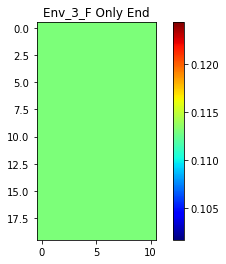

In [89]:
final_table = Network_Qtable(model, env)
plt.imshow(final_table, cmap='jet')
plt.title("Env_" + "3" + "_F Only End")
plt.colorbar()
img_save_path = os.path.join('Q-Plot', "Env_" + "3" + "_F_Only_Pess")
plt.savefig(img_save_path)


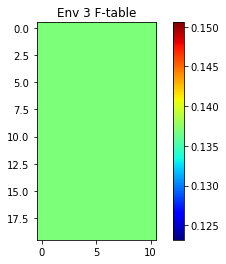

In [90]:
final_table = Network_Ftable(model, env, "max")
plt.imshow(final_table, cmap='jet')
plt.title("Env " + "3" + " F-table")
plt.colorbar()
img_save_path = os.path.join('Q-Plot', "Env " + "3" + " F-table(Pess)")
plt.savefig(img_save_path)

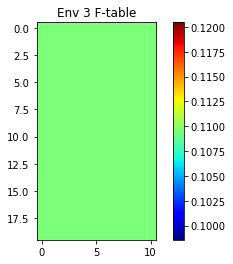

In [91]:
final_table = Network_Ftable(model, env, "min")
plt.imshow(final_table, cmap='jet')
plt.title("Env " + "3" + " F-table")
plt.colorbar()
img_save_path = os.path.join('Q-Plot', "Env " + "3" + " F-table min(pess)")
plt.savefig(img_save_path)